# 1 Problem Statement

Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores. Currently, the forecasting is taken care of by the store managers who are tasked with forecasting daily sales for the next six weeks. 

 

As expected, store sales are influenced by many factors, including promotional campaigns, competition, state holidays, seasonality, and locality.

 

With thousands of individual managers predicting sales based on their unique circumstances and intuitions, the accuracy of the forecasts is quite varied. To overcome this problem, the company has hired you as a data scientist to work on the forecasting problem. As part of your job role, you are tasked with building a forecasting model to forecast the daily sales for the next six weeks. To help you with the same, you have been provided with historical sales data for 1,115 Rossmann stores.

## 1.1 Data definition

The data is provided in two tables, **stores and train**. The store table contains the metadata for every single **store** including the following:

 

**Store** - an Id that represents the store

**StoreType** - differentiates between 4 different store models: a, b, c, d

**Assortment** - describes an assortment level: a = basic, b = extra, c = extended

**CompetitionDistance** - describes thedistance in meters to the nearest competitor store

**CompetitionOpenSince[Month/Year]** - gives the approximate year and month of the time the nearest competitor was opened

**Promo2** - Promo2 is a continuing and consecutive promotion for some stores: 0 = store is not participating, 1 = store is participating

**Promo2Since[Year/Week]** - describes the year and calendar week when the store started participating in Promo2

**PromoInterval** - describes the consecutive intervals Promo2 is started, naming the months the promotion is started anew. E.g. "Feb, May, Aug, Nov" means each round starts in February, May, August, November of any given year for that store

 
--------------------------------------------------------------------------------
 

The **train** table contains the sales data for individual stores at a daily level along with the details about the day

 

**Store** - a unique Id for each store

**DayOfWeek** - Describes the day of the week (1 - Monday till 7 - Sunday)

**Date** - Describes the date on the day

**Sales** - the turnover for any given day (this is what you are forecasting)

**Customers** - the number of customers on a given day

**Open** - an indicator for whether the store was open: 0 = closed, 1 = open

**StateHoliday** - indicates a state holiday. Normally all stores, with few exceptions, are closed on state holidays. Note that all schools are closed on public holidays and weekends. a = public holiday, b = Easter holiday, c = Christmas, 0 = None

**SchoolHoliday** - indicates if the (Store, Date) was affected by the closure of public schools

 

Since the company is just embarking on this project, the scope has been kept to nine key stores across Europe. The stores are key for the company keeping in mind the revenue and historical prestige associated with them. These stores are numbered - **1,3,8,9,13,25,29,31 and 46**.

## 1.2 Import Libraries

In [1]:
!pip install statsmodels

import pandas as pd 
import numpy as np 

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import seaborn as sns
import matplotlib.pyplot as plt

from pylab import rcParams

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARIMA

import sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error


pd.set_option('display.float_format', lambda x: '%.5f' % x)

## 1.3 Import Data

In [2]:
# Load both the given csv file as dataframes
df_train = pd.read_csv("train.csv")
df_store = pd.read_csv("store.csv")

# 2 Exploratory Data Analysis

## 2.1 Data quality check

### train dataframe

In [3]:
# print first 5 rows of data
df_train.head() 

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [4]:
df_train.shape # print shape

(1017209, 9)

In [5]:
df_train.info() # Check data types and Null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   Store          1017209 non-null  int64 
 1   DayOfWeek      1017209 non-null  int64 
 2   Date           1017209 non-null  object
 3   Sales          1017209 non-null  int64 
 4   Customers      1017209 non-null  int64 
 5   Open           1017209 non-null  int64 
 6   Promo          1017209 non-null  int64 
 7   StateHoliday   1017209 non-null  object
 8   SchoolHoliday  1017209 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 69.8+ MB


- No missing values are there. 
- 'Date' column seem to have data issue as wrong data type is assigned.
- Check columns individually for any missing data or other data issues.

In [6]:
df_train['Store'].nunique() # Check total no. of stores and found 1115 uniques store entries

1115

In [7]:
df_train['DayOfWeek'].value_counts() # Days encoded from 1 to 7. Seems properly done.

5    145845
4    145845
3    145665
2    145664
1    144730
7    144730
6    144730
Name: DayOfWeek, dtype: int64

In [8]:
df_train['Date'] = pd.to_datetime(df_train['Date']) # Changed the data type to datetime
df_train['Date'].nunique()                          # 942 data is recorded for 942 days

942

In [9]:
df_train['StateHoliday'].value_counts()

0    855087
0    131072
a     20260
b      6690
c      4100
Name: StateHoliday, dtype: int64

Values should be 'a', 'b', 'c' & '0' for this variable but there seem one is string and other is integer.

In [10]:
# Check the index to find about '0'
df_train['StateHoliday'].value_counts().index  # one 0 is integer and other is string.

Index(['0', 0, 'a', 'b', 'c'], dtype='object')

In [11]:
# Convert this column to object(string) datatype
df_train['StateHoliday'] = df_train['StateHoliday'].astype(str)

In [12]:
# Check if problem is corrected
df_train['StateHoliday'].value_counts()

0    986159
a     20260
b      6690
c      4100
Name: StateHoliday, dtype: int64

- 0 & '0' sucessfully merged to single text value of '0'.
- Replace '0' with 0.
- Replace a,b,c with 1 to make holiday as 1.

In [13]:
df_train['StateHoliday'] = df_train['StateHoliday'].replace({'0':0})
df_train['StateHoliday'] = df_train['StateHoliday'].replace({'a':1})
df_train['StateHoliday'] = df_train['StateHoliday'].replace({'b':1})
df_train['StateHoliday'] = df_train['StateHoliday'].replace({'c':1})

In [14]:
df_train['SchoolHoliday'].value_counts()

0    835488
1    181721
Name: SchoolHoliday, dtype: int64

'SchoolHoliday' column is proper having only 0 and 1 value.

In [15]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   Store          1017209 non-null  int64         
 1   DayOfWeek      1017209 non-null  int64         
 2   Date           1017209 non-null  datetime64[ns]
 3   Sales          1017209 non-null  int64         
 4   Customers      1017209 non-null  int64         
 5   Open           1017209 non-null  int64         
 6   Promo          1017209 non-null  int64         
 7   StateHoliday   1017209 non-null  int64         
 8   SchoolHoliday  1017209 non-null  int64         
dtypes: datetime64[ns](1), int64(8)
memory usage: 69.8 MB


Now, Data types look proper and all columns are individually checked also.
Moving to store.csv file.

In [16]:
df_train.isnull().sum() # Missing values present in the dataframe

Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

Important stores for company are 1,3,8,9,13,25,29,31 and 46.

In [17]:
stores = [1,3,8,9,13,25,29,31,46] # List of stores required for further analysis

df_train = df_train[df_train['Store'].isin(stores)] # filter based on stores

In [18]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8110 entries, 0 to 1016140
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Store          8110 non-null   int64         
 1   DayOfWeek      8110 non-null   int64         
 2   Date           8110 non-null   datetime64[ns]
 3   Sales          8110 non-null   int64         
 4   Customers      8110 non-null   int64         
 5   Open           8110 non-null   int64         
 6   Promo          8110 non-null   int64         
 7   StateHoliday   8110 non-null   int64         
 8   SchoolHoliday  8110 non-null   int64         
dtypes: datetime64[ns](1), int64(8)
memory usage: 633.6 KB


Outlier Study

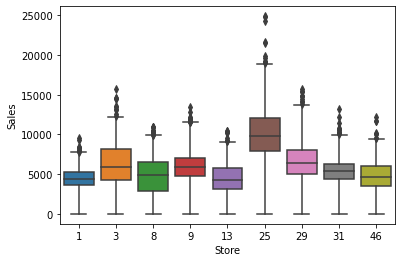

In [19]:
# boxplot to check for outliers in Sales column
sns.boxplot(x='Store',y='Sales', data = df_train, whis=[0,99])
plt.show()

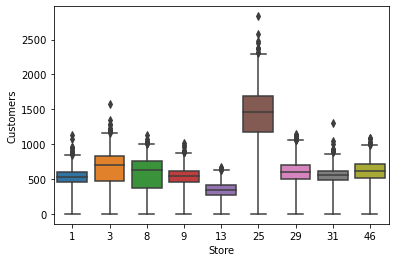

In [20]:
# boxplot to check for outliers in customers column
sns.boxplot(x='Store',y='Customers' ,data = df_train, whis=[0,99])
plt.show()

Outliers are visible in box plot for both Sales and customers. We will remove those during further process.

### store dataframe

In [21]:
# print first 5 lines
df_store.head() 

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.00000,9.00000,2008.00000,0,NaN,NaN,NaN
1,2,a,a,570.00000,11.00000,2007.00000,1,13.00000,2010.00000,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.00000,12.00000,2006.00000,1,14.00000,2011.00000,"Jan,Apr,Jul,Oct"
3,4,c,c,620.00000,9.00000,2009.00000,0,NaN,NaN,NaN
4,5,a,a,29910.00000,4.00000,2015.00000,0,NaN,NaN,NaN


In [22]:
# As earlier we filter the data for only for required stores.
df_store = df_store[df_store['Store'].isin(stores)] 

In [23]:
df_store.isna().sum() # Null values

Store                        0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    2
CompetitionOpenSinceYear     2
Promo2                       0
Promo2SinceWeek              6
Promo2SinceYear              6
PromoInterval                6
dtype: int64

In [24]:
df_store.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9 entries, 0 to 45
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      9 non-null      int64  
 1   StoreType                  9 non-null      object 
 2   Assortment                 9 non-null      object 
 3   CompetitionDistance        9 non-null      float64
 4   CompetitionOpenSinceMonth  7 non-null      float64
 5   CompetitionOpenSinceYear   7 non-null      float64
 6   Promo2                     9 non-null      int64  
 7   Promo2SinceWeek            3 non-null      float64
 8   Promo2SinceYear            3 non-null      float64
 9   PromoInterval              3 non-null      object 
dtypes: float64(5), int64(2), object(3)
memory usage: 792.0+ bytes


CompetitionOpenSinceMonth, CompetitionOpenSinceYear, Promo2SinceWeek, Promo2SinceYear, PromoInterval

In [25]:
# Find the reason for missing values in 'CompetitionOpenSinceYear' & 'CompetitionOpenSinceMonth' Column.
print(df_store[df_store['CompetitionOpenSinceYear'].isna()].shape)
print(df_store[df_store['CompetitionOpenSinceYear'].isna()].shape)
print(df_store[(df_store['CompetitionOpenSinceYear'].isna()) & (df_store['CompetitionOpenSinceMonth'].isna())].shape)

(2, 10)
(2, 10)
(2, 10)


It shows both 'CompetitionOpenSinceYear' & 'CompetitionOpenSinceMonth' values are missing at same place. It means no information is available about some competition store for opening date.

In [26]:
df_store[(df_store['CompetitionOpenSinceMonth'].isna() & df_store['CompetitionOpenSinceYear'].isna())]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
12,13,d,a,310.00000,NaN,NaN,1,45.00000,2009.00000,"Feb,May,Aug,Nov"
28,29,d,c,2170.00000,NaN,NaN,0,NaN,NaN,NaN


In [27]:
print(df_store[df_store['Promo2SinceWeek'].isna()].shape)
print(df_store[df_store['Promo2SinceYear'].isna()].shape)
print(df_store[df_store['PromoInterval'].isna()].shape)
print(df_store[(df_store['Promo2SinceWeek'].isna()) & (df_store['Promo2SinceYear'].isna()) & (df_store['PromoInterval'].isna())].shape) 
# check if value is missing at same place.

(6, 10)
(6, 10)
(6, 10)
(6, 10)


It shows 'Promo2SinceWeek', 'Promo2SinceYear' & 'PromoInterval' values are missing at same place. 

Check - It means either no promotion or no information is available about promo for these rows.

In [28]:
df_store[(df_store['Promo2SinceWeek'].isna()) & (df_store['Promo2SinceYear'].isna()) & (df_store['PromoInterval'].isna())]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.00000,9.00000,2008.00000,0,NaN,NaN,NaN
7,8,a,a,7520.00000,10.00000,2014.00000,0,NaN,NaN,NaN
8,9,a,c,2030.00000,8.00000,2000.00000,0,NaN,NaN,NaN
24,25,c,a,430.00000,4.00000,2003.00000,0,NaN,NaN,NaN
28,29,d,c,2170.00000,NaN,NaN,0,NaN,NaN,NaN
30,31,d,c,9800.00000,7.00000,2012.00000,0,NaN,NaN,NaN


In [29]:
categorical = ['CompetitionOpenSinceYear', 'CompetitionOpenSinceMonth']
for i in categorical:
  df_store[i]= df_store[i].fillna(df_store[i].median())

df_store= df_store.fillna(0) # Replace other columns with 0.

In [30]:
df_store.isna().sum() # Missing values

Store                        0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval                0
dtype: int64

Now no missing values so we can move further to merge 2 dataframes for further analysis.

### Merge the dataframes

In [31]:
# merge both dataframes
df_merged = pd.merge(df_train, df_store, how='inner', on='Store')
df_merged.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.00000,9.00000,2008.00000,0,0.00000,0.00000,0
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.00000,9.00000,2008.00000,0,0.00000,0.00000,0
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.00000,9.00000,2008.00000,0,0.00000,0.00000,0
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.00000,9.00000,2008.00000,0,0.00000,0.00000,0
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.00000,9.00000,2008.00000,0,0.00000,0.00000,0


In [32]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8110 entries, 0 to 8109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Store                      8110 non-null   int64         
 1   DayOfWeek                  8110 non-null   int64         
 2   Date                       8110 non-null   datetime64[ns]
 3   Sales                      8110 non-null   int64         
 4   Customers                  8110 non-null   int64         
 5   Open                       8110 non-null   int64         
 6   Promo                      8110 non-null   int64         
 7   StateHoliday               8110 non-null   int64         
 8   SchoolHoliday              8110 non-null   int64         
 9   StoreType                  8110 non-null   object        
 10  Assortment                 8110 non-null   object        
 11  CompetitionDistance        8110 non-null   float64       
 12  Compet

StoreType, Assortment and PromoInterval are Object DataType.

In [33]:
# print unique values in these columns.
print(df_merged['StoreType'].unique())
print(df_merged['Assortment'].unique())
print(df_merged['PromoInterval'].unique())

['c' 'a' 'd']
['a' 'c']
[0 'Jan,Apr,Jul,Oct' 'Feb,May,Aug,Nov']


Data is as per metadata info. We need to change it to int type so that we can do further analysis.

In [34]:
# Convert datatype to int by substituting
df_merged['StoreType'] = df_merged['StoreType'].map({'a':1,'c':2,'d':3})
df_merged['Assortment'] = df_merged['Assortment'].map({'a':1,'c':2})
df_merged['PromoInterval'] = df_merged['PromoInterval'].map({0:0,'Jan,Apr,Jul,Oct':1,'Feb,May,Aug,Nov':2})

In [35]:
df_merged.info() # check data types

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8110 entries, 0 to 8109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Store                      8110 non-null   int64         
 1   DayOfWeek                  8110 non-null   int64         
 2   Date                       8110 non-null   datetime64[ns]
 3   Sales                      8110 non-null   int64         
 4   Customers                  8110 non-null   int64         
 5   Open                       8110 non-null   int64         
 6   Promo                      8110 non-null   int64         
 7   StateHoliday               8110 non-null   int64         
 8   SchoolHoliday              8110 non-null   int64         
 9   StoreType                  8110 non-null   int64         
 10  Assortment                 8110 non-null   int64         
 11  CompetitionDistance        8110 non-null   float64       
 12  Compet

## 2.2 Data Analysis

In [36]:
df_merged_eda = df_merged.copy() # create copy of dataframe

# create additional features for plotting and analysis
df_merged_eda['Year'] = pd.DatetimeIndex(df_merged_eda['Date']).year
df_merged_eda['Month'] = pd.DatetimeIndex(df_merged_eda['Date']).month
df_merged_eda['Day'] = pd.DatetimeIndex(df_merged_eda['Date']).day
df_merged_eda['Week'] = pd.DatetimeIndex(df_merged_eda['Date']).week

In [37]:
# function for bar chart
def bar_plot(groupby,data_mapping=None ):
  eda_grp = df_merged_eda.copy()
  
  eda_grp = df_merged_eda.groupby([groupby],as_index = False)
  eda_grp = eda_grp.agg({'Sales':np.mean})
  if data_mapping is not None:
    eda_grp[groupby] =eda_grp[groupby].map(data_mapping).astype(str)
  fig, ax= plt.subplots( figsize=(10,5))
  sns.barplot(x=groupby,y='Sales',data = eda_grp, ax=ax)
  plt.show()

In [38]:
# function for factor chart
def factor_plot(col=None, hue=None, x='Month', y='Sales', row='Year', data=df_merged_eda):
  if col!=None and hue !=None:
    sns.factorplot(data = df_merged_eda, x =x, y = y, 
               col = col, # per store type in cols
               hue = hue,
               row = row
             )
  elif hue!=None and col == None:
    if row == None:
      sns.factorplot(data = df_merged_eda, x =x, y = y, 
               hue = hue
             )
    else:
       sns.factorplot(data = df_merged_eda, x =x, y = y, 
               hue = hue,
               row = row
             )
  else:
    if row == None:
      sns.factorplot(data = df_merged_eda, x =x, y = y)
    else:
      sns.factorplot(data = df_merged_eda, x =x, y = y, row=row)

In [39]:
# scatter plot
def scatter_plot(hue, col, values):
   fig, axs = plt.subplots(3,3,figsize=(10,10))
   for i, ax in enumerate(axs.flatten()):
     sns.scatterplot(x='Sales',y='Customers',hue=hue,data=df_merged_eda[df_merged_eda['Store']==values[i]],ax=ax)
     ax.set_title('Store '+ str(values[i]))
   fig.tight_layout()
   fig.subplots_adjust(top=0.90)
   plt.suptitle('Interaction between Sales, Customers & promo')

### Sales Analysis

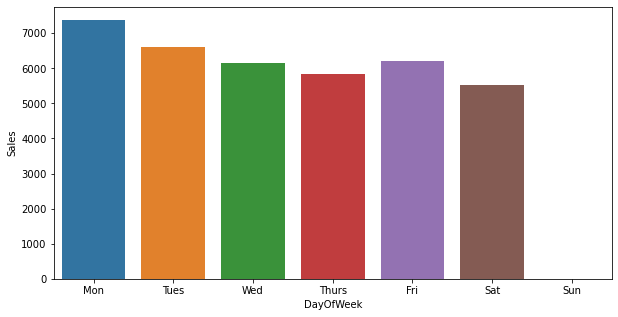

In [40]:
bar_plot('DayOfWeek',{1:'Mon',2:'Tues',3:'Wed',4:'Thurs',5:'Fri',6:'Sat',7:'Sun'}) # sales on different weekdays

Sales is usually high on Monday and then reduces. There is no sales on sunday. Friday has increased sales.

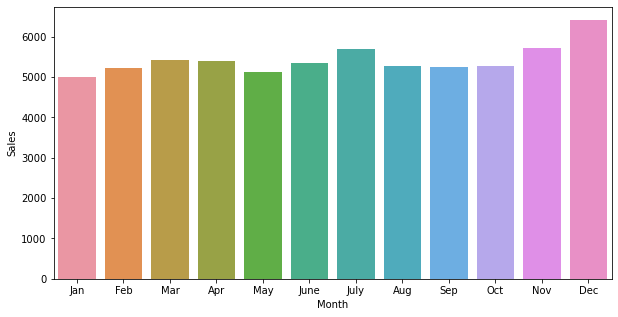

In [41]:
# sales in different months
bar_plot('Month',{1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'June',7:'July',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})

Sales is higher in November and December compared to others. Highest in December.

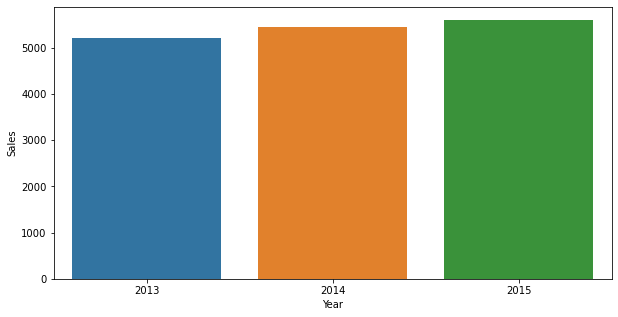

In [42]:
bar_plot('Year')

Slow increase in sales can be observed over years.

<AxesSubplot:>

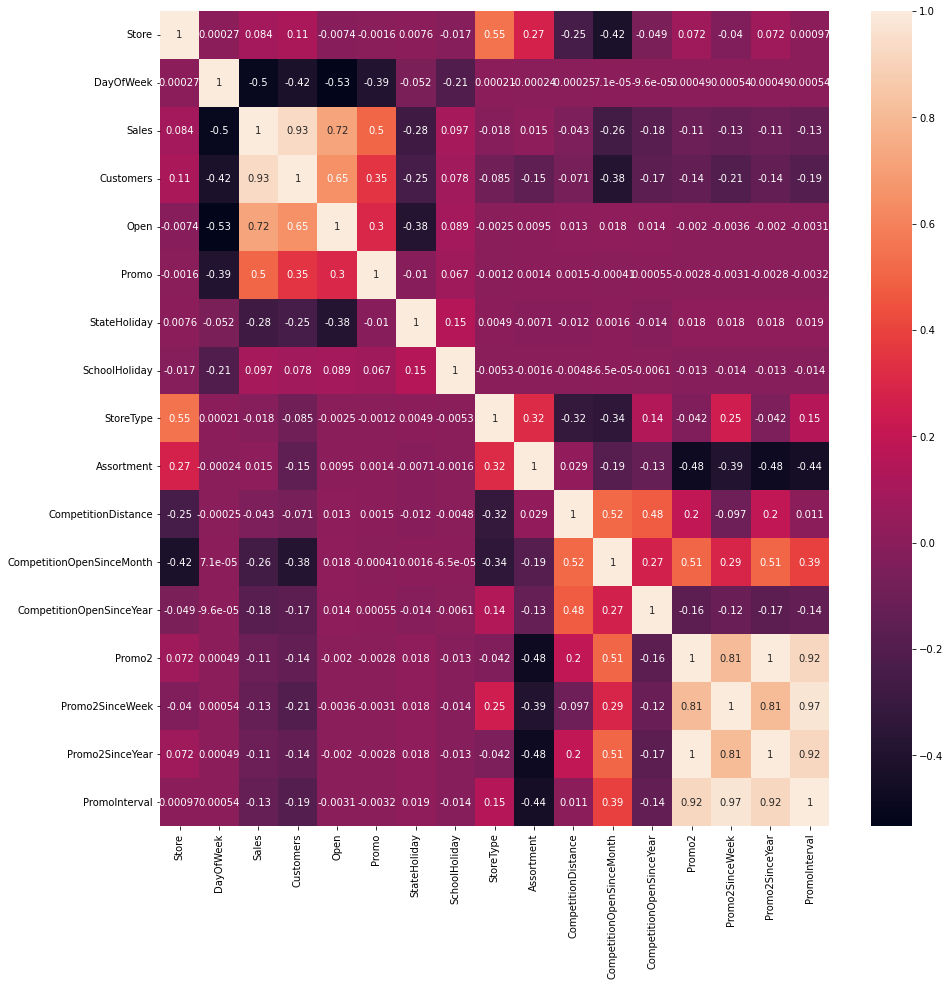

In [43]:
# Plot heatmap to see different correlation with sales
cols = ['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'StoreType', 'Assortment',
       'CompetitionDistance', 'CompetitionOpenSinceMonth',
       'CompetitionOpenSinceYear', 'Promo2', 'Promo2SinceWeek',
       'Promo2SinceYear', 'PromoInterval'] # columns for heatmap
corr_matrix = df_merged_eda[cols].corr()
plt.figure(figsize=(15,15))

sns.heatmap(corr_matrix, annot=True)

Sales is having positive correlation with Customers, Promo , Open and negative correlation with DayOfWeek.

### Impact of promotional offers on sales.

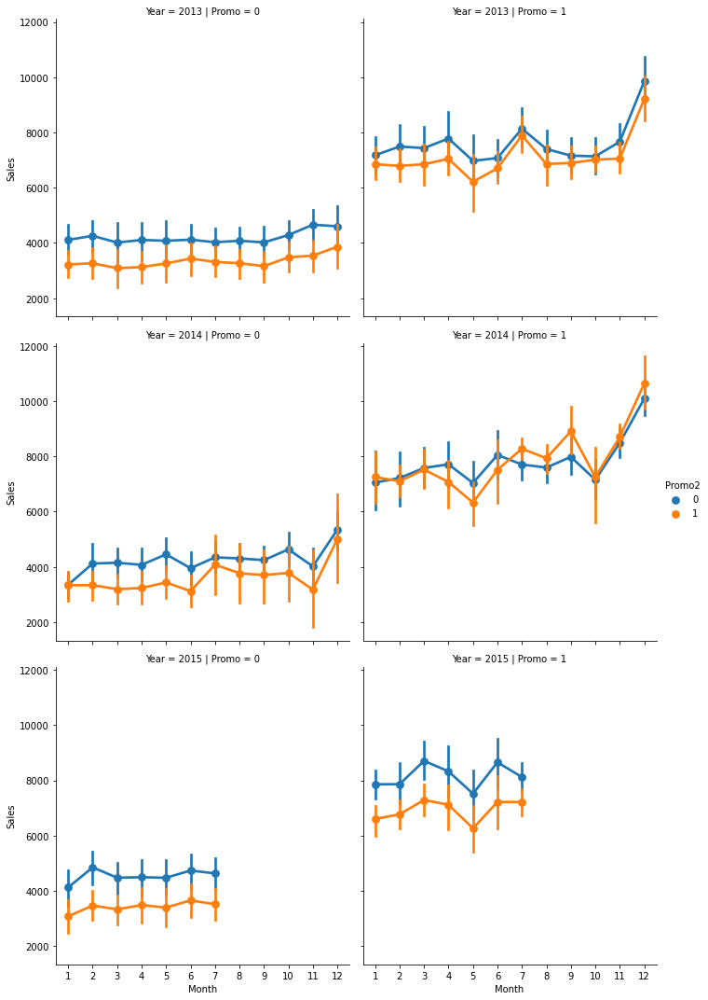

In [44]:
# plot factor chart to study effect of promo & promo2
factor_plot(col='Promo', hue='Promo2')

promotional offers affect sales. upward trend can be seen in data. Promo is affecting sales while promo2 doesn't affect sales much.

### Sales vs Customers

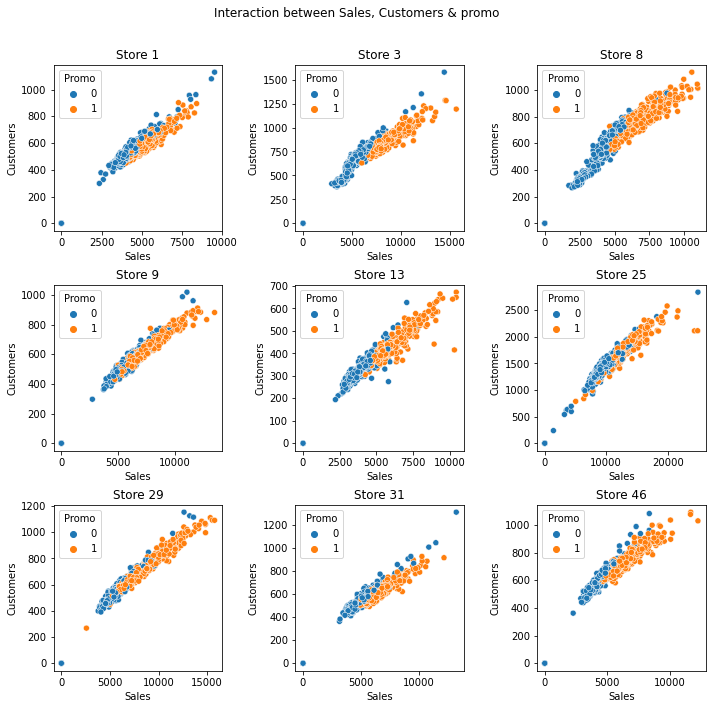

In [45]:
# Scatter plot to study interaction of promo, sales & customers.
scatter_plot(hue='Promo', col='Sale', values=stores)

It is evident that no. of customers increase during promo. Also customers are related to sales directly. Increase in customers signify increase in sales.

#### Inference that can be drawn from data analysis:

  - Sales on Monday are higher and no sales on Sunday.
  - Promo2 doesnt affect sales.
  - Promo is directly related to sales and customers
  - Sales and customers have significantly high correlation of 0.93

# 3 Time Series Analysis

### Functions for different plots & Pre-processing

In [46]:
# time series plotting
def time_series_plot(data,store_num):
  data.resample('W').sum().plot()
  plt.title('Store Number '+ str(store_num))
  plt.show()

In [47]:
# stationarity test 
def stationarity_test_adf(data, store_num):
  res = adfuller(data)
  print('ADF Statistic: %f' % res[0])
  print('p-value: %f' % res[1])
  print('Critical Values:')
  for key, value in res[4].items():
    if key=='5%':
      print('\t%s: %.3f' % (key, value))

  if res[1] <= 0.05:
    print('Store '+str(store_num)+' is Stationary Time Series')
  else:
    print('Store '+str(store_num)+' is not Stationary Time Series')

In [48]:
# seasonal decomposition plotting - additive model
def seasonal_decomposition_plot(data):
  rcParams['figure.figsize'] = 15, 10
  decomp = sm.tsa.seasonal_decompose(data, model='additive',freq=365) # additive model
  fig = decomp.plot()
  plt.show()

In [49]:
# ACF & PACF plot
def acf_pacf_plot(data, title):
    plt.figure(figsize=(15,8))

    plt.subplot(211)
    plot_acf(data,lags=50, ax=plt.gca())
    plt.title('ACF plot for '+title)

    plt.subplot(212)
    plot_pacf(data,lags=50, ax=plt.gca())
    plt.title('PACF plot for'+title)

    plt.show()

In [50]:
# funtion to calculate MAPE
def percent_error(actual, predicted):
    res = np.empty(actual.shape)
    for j in range(actual.shape[0]):
        if actual[j] != 0:
            res[j] = (actual[j] - predicted[j]) / actual[j]
        else:
            res[j] = predicted[j] / np.mean(actual)
    return res

def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs(percent_error(np.asarray(y_true), np.asarray(y_pred)))) * 100

In [51]:
# johansen test to determine cointegration
"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def johansen_test(data, variables):
    res = coint_johansen(data[variables],-1,1)

    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    traces = res.lr1
    cvts = res.cvt  ## 0: 90%  1:95% 2: 99%

    N, l = np.asarray(data[variables]).shape
    r =0
    for i in range(l):
        if traces[i] > cvts[i, 1]:
            r = i + 1

    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    if r == 2:
      print("The Rank is 2. There is no cointegration but the series is stationary. VAR/VARMAX models can be build.'\n'")
    elif r == 1:
      print("The Rank is 1. Variable 2 can be expressed in terms of Variable 1. Cointegration exists so VAR/VARMAX models can be build.'\n'")
    elif r == 0:
      print("The Rank is 0.  Unable to find a non zero value for ω1 and ω2 ⇒ No cointegrating vector exists ⇒ y1t and y2t are not cointegrated ⇒ VAR/VARMAX model not possible.'\n'")

In [52]:
# function for removing outliers
def remove_outliers(data):
    print('Outliers above 99 percentile removed')
    sales_upper_limit=data['Sales'].quantile(0.99)
    customers_upper_limit=data['Customers'].quantile(0.99)
    data = data[data['Sales']<= sales_upper_limit]
    data = data[data['Customers']<= customers_upper_limit]
    return data

In [53]:
# Impute missing values
def impute_missing_values(data, store_num):
    print('Imputed missing values using linear interpolation')
    temp = pd.date_range(start=data.index.min(), end= data.index.max())

    print(len(temp))

    data= data.reindex(temp, fill_value=np.nan)
    
    data = data.assign(Sales_Linear_Interpolation=data.Sales.interpolate(method='linear'))
    data[['Sales_Linear_Interpolation']].plot(figsize=(18, 5))
    plt.legend(loc='best')
    plt.title('Store {}: Linear interpolation'.format(store_num))
    plt.show(block=False)


    data = data.assign(Customers_Linear_Interpolation=data.Customers.interpolate(method='linear'))
    data[['Customers_Linear_Interpolation']].plot(figsize=(18, 5))
    plt.legend(loc='best')
    plt.title('Store {}: Linear interpolation'.format(store_num))
    plt.show(block=False)


    data['Sales'] = data['Sales_Linear_Interpolation']
    data['Customers'] = data['Customers_Linear_Interpolation']
    data.drop(columns=['Sales_Linear_Interpolation','Customers_Linear_Interpolation'],inplace=True)
    
    data= data.fillna(0)
    
    data[data['DayOfWeek']==7] = data[data['DayOfWeek']==7].assign(Sales = 0 )
    
    data[data['DayOfWeek']==7] = data[data['DayOfWeek']==7].assign(Customers = 0 )
    
    print(data[data['DayOfWeek']==7].head())

    data.sort_index(inplace=True)

    data.isnull().sum()
    
    return data

In [54]:
# Standardising/ Scaling Sales and Customers features 
data = df_merged.copy()
'''
  Customers, Promo and DayOfWeek, Open has high correlation with Sales. 
  Therefore these columns are selected for further analysis
'''
data = data[['Store','Date','Sales','Customers','Promo', 'DayOfWeek', 'Open']]

# MinmaxScaler
Minmax=sklearn.preprocessing.MinMaxScaler()

data[["Sales", "Customers"]]=Minmax.fit_transform(data[["Sales", "Customers"]])

# Setting Date as Index 
data = data.set_index('Date')

# Sorting the index
data.sort_index(inplace=True)

In [55]:
data.head()

,Store,Sales,Customers,Promo,DayOfWeek,Open
Date,,,,,,
2013-01-01,46,0.00000,0.00000,0,2,0
2013-01-01,25,0.00000,0.00000,0,2,0
2013-01-01,8,0.00000,0.00000,0,2,0
2013-01-01,13,0.00000,0.00000,0,2,0
2013-01-01,9,0.00000,0.00000,0,2,0


In [56]:
# exogenous features for univariate models like ARIMAX & SARIMAX
exo_uni_features = ['Customers','Promo','Open', 'DayOfWeek'] 

# exogenous features for multivariate models like VAR & VARMAX
exo_mul_features = ['Promo','Open', 'DayOfWeek']

### Define function & class for ARMA and VAR Model types
We will work with ARIMAX and SARIMAX models as they can capture external variable effects and SARIMAX can additionally capture seasonal trends.

VAR models we will study as sales & customers seems highly related.

 - For ARMA Models -- ARIMAX and SARIMAX
 - For VAR Models -- VAR and VARMAX



In [57]:
class ARMA_Model:
  def __init__(self, data, store_number, endog, order, seasonal_order=None, exog=None):
    self.endog = endog
    self.exog= exog
    self.data = data
    self.order= order
    self.seasonal_order= seasonal_order
    self.store_number=store_number
    

  def build_model_ARIMAX(self):
    
    # Predict for 6 weeks - 42 days
    train_length = -42

    endog_data=self.data[self.endog].astype(float)

    endog_data[self.endog]=endog_data[self.endog].astype(float)

    train_endog = endog_data[:train_length]
    test_endog=endog_data[train_length:]

    train_exog = self.data[:train_length][self.exog].astype(float)
    test_exog = self.data[train_length:][self.exog].astype(float)

    
    arima_model = ARIMA(train_endog, order=self.order, exog=train_exog)
    arima_model_fit = arima_model.fit()

  
    test_endog['ArimaxForecastedSales'] = arima_model_fit.predict(start=test_endog.index.min(),end=test_endog.index.max(), exog=test_exog).round(2)
   
    print(test_endog.head(5))

    print('\n\n ------------ Test & Model forecast -----------------------')
    # printing summary of the model 
    plt.figure(figsize=(15,5)) 
    plt.plot(test_endog['Sales'], label='Test')
    plt.plot(test_endog['ArimaxForecastedSales'], label='ARIMAX')
    plt.legend(loc='best')
    plt.title('ARIMAX Model')
    plt.show()

    rmse_sales = np.sqrt(mean_squared_error(test_endog['Sales'], test_endog['ArimaxForecastedSales'])).round(2)
    mape_sales = mean_absolute_percentage_error(test_endog['Sales'], test_endog['ArimaxForecastedSales']).round(2)
    smape_sales = np.round(np.mean(np.abs(test_endog['Sales'] - test_endog['ArimaxForecastedSales'])/((abs(test_endog['Sales'])+abs(test_endog['ArimaxForecastedSales']))/2))*100,2)

    tempResults = pd.DataFrame({'Store':self.store_number,'Time Series Model':'ARIMAX', 'RMSE': [rmse_sales],'MAPE': [mape_sales], 'Variable':['Sales'] })
    return tempResults


  def build_model_SARIMAX(self):
    
    # Predict for 6 weeks - 42 days
    train_length = -42

    endog_data=self.data[self.endog].astype(float)

    endog_data[self.endog]=endog_data[self.endog].astype(float)

    train_endog = endog_data[:train_length]
    test_endog=endog_data[train_length:]

    train_exog = self.data[:train_length][self.exog].astype(float)
    test_exog = self.data[train_length:][self.exog].astype(float)

    
    sarimax_model = SARIMAX(train_endog, order=self.order, seasonal_order=self.seasonal_order, exog=train_exog,  
                                           enforce_stationarity=False,
                                            enforce_invertibility=False,
                           simple_differencing =True)
    sarimax_model_fit = sarimax_model.fit()

  
    test_endog['SarimaxForecastedSales'] = sarimax_model_fit.predict(start=test_endog.index.min(),end=test_endog.index.max(), exog=test_exog).round(2)
    print(test_endog.head(5))
    
    print('\n\n ------------ Test & Model forecast -----------------------')
    # priniting summary of the model 
    plt.figure(figsize=(15,5)) 
    plt.plot(test_endog['Sales'], label='Test')
    plt.plot(test_endog['SarimaxForecastedSales'], label='SARIMAX')
    plt.legend(loc='best')
    plt.title('SARIMAX Model')
    plt.show()

    rmse_sales = np.sqrt(mean_squared_error(test_endog['Sales'], test_endog['SarimaxForecastedSales'])).round(2)
    mape_sales = mean_absolute_percentage_error(test_endog['Sales'], test_endog['SarimaxForecastedSales']).round(2)
    smape_sales = np.round(np.mean(np.abs(test_endog['Sales'] - test_endog['SarimaxForecastedSales'])/((abs(test_endog['Sales'])+abs(test_endog['SarimaxForecastedSales']))/2))*100,2)

    tempResults = pd.DataFrame({'Store':self.store_number,'Time Series Model':'SARIMAX', 'RMSE': [rmse_sales],'MAPE': [mape_sales], 'Variable':['Sales'] })
    return tempResults




In [58]:
class VAR_Model:
  def __init__(self, data, store_number, endog, order, seasonal_order=None, exog=None):
    self.endog = endog
    self.exog= exog
    self.data = data
    self.order= order
    self.seasonal_order= seasonal_order
    self.store_number=store_number

  def build_model_VAR(self):
    
    # Predict for 6 weeks - 42 days
    train_length = -42

    endog_data=self.data[self.endog].astype(float)

    endog_data[self.endog]=endog_data[self.endog].astype(float)


    train = endog_data[:train_length]
    test=endog_data[train_length:]


    mod = sm.tsa.VARMAX(train[self.endog], order=self.order, trend='n')
    result = mod.fit(maxiter=1000, disp=False)
    print(result.summary())

    predictions = result.predict(start=test.index.min(),end=test.index.max())
 
    results = pd.DataFrame(columns=['Store','Time Series Model', 'RMSE','MAPE', 'Variable'])
    for var in self.endog:
      plt.figure(figsize=(15,5)) 
      plt.plot(test[var], label='Test')
      plt.plot(predictions[var], label='VAR')
      plt.legend(loc='best')
      plt.title('VAR Model - '+ var)
      plt.show()

      rmse = np.sqrt(mean_squared_error(test[var], predictions[var])).round(2)
      mape = mean_absolute_percentage_error(test[var], predictions[var]).round(2)

      tempResults = pd.DataFrame({'Store':[self.store_number],'Time Series Model':['VAR'], 'RMSE': [rmse],'MAPE': [mape], 'Variable':[var] })
      results = pd.concat([results, tempResults])

    return results


  def build_model_VARMAX(self):
    
    # Predict for 6 weeks - 42 days
    train_length = -42

    endog_data=self.data[self.endog]

    endog_data[self.endog]=endog_data[self.endog].astype(float)

    train_endog = endog_data[:train_length]
    test_endog=endog_data[train_length:]

    train_exog = self.data[:train_length][self.exog].astype(float)
    test_exog = self.data[train_length:][self.exog].astype(float)

    
    mod = sm.tsa.VARMAX(train_endog[self.endog], order=self.order, trend='n',exog=train_exog)
    result = mod.fit(maxiter=1000, disp=False)
    print(result.summary())

    predictions = result.predict(start=test_endog.index.min(),end=test_endog.index.max(),exog= test_exog)

    results = pd.DataFrame(columns=['Store','Time Series Model', 'RMSE','MAPE', 'Variable'])
    for var in self.endog:
      plt.figure(figsize=(15,5)) 
      plt.plot(test_endog[var], label='Test')
      plt.plot(predictions[var], label='VARMAX')
      plt.legend(loc='best')
      plt.title('VAR Model - '+ var)
      plt.show()

      rmse = np.sqrt(mean_squared_error(test_endog[var], predictions[var])).round(2)
      mape = mean_absolute_percentage_error(test_endog[var], predictions[var]).round(2)

      tempResults = pd.DataFrame({'Store':self.store_number,'Time Series Model':'VARMAX', 'RMSE': [rmse],'MAPE': [mape], 'Variable':[var] })
      results = pd.concat([results, tempResults])

    return results

# 4 Storewise - Time Series Model Building & Forecasting

## Store 1

### Pre-Processing of Data

Outliers above 99 percentile removed
Imputed missing values using linear interpolation
942


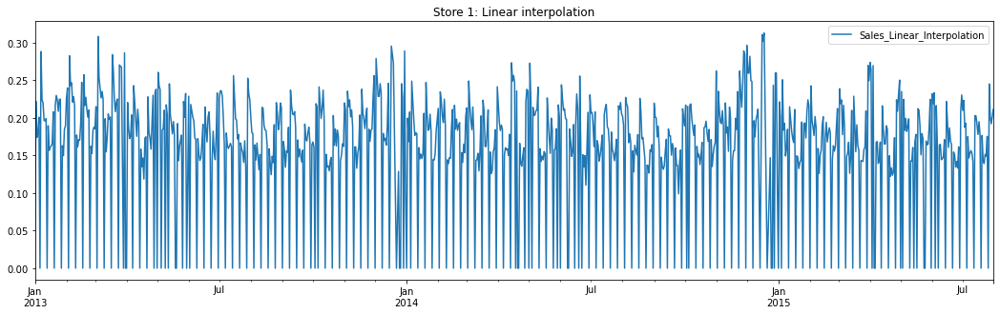

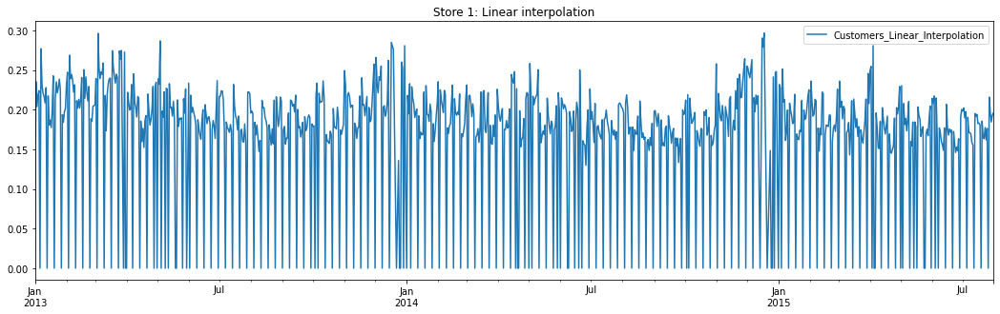

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000
942


In [59]:
store1 = data[data['Store'] == 1] # filter data for store num 1
store1 = remove_outliers(store1) # Remove outliers
store1.drop(['Store'], axis=1, inplace=True) # Drop store column
store1= impute_missing_values(store1, 1) # Impute missing values
store1.sort_index(inplace=True)
print(len(store1))

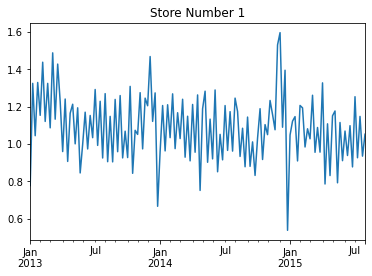

In [60]:
time_series_plot(store1['Sales'], '1') # plot time series

In [61]:
stationarity_test_adf(store1['Sales'], 1) # stationarity test

ADF Statistic: -5.484182
p-value: 0.000002
Critical Values:
	5%: -2.865
Store 1 is Stationary Time Series


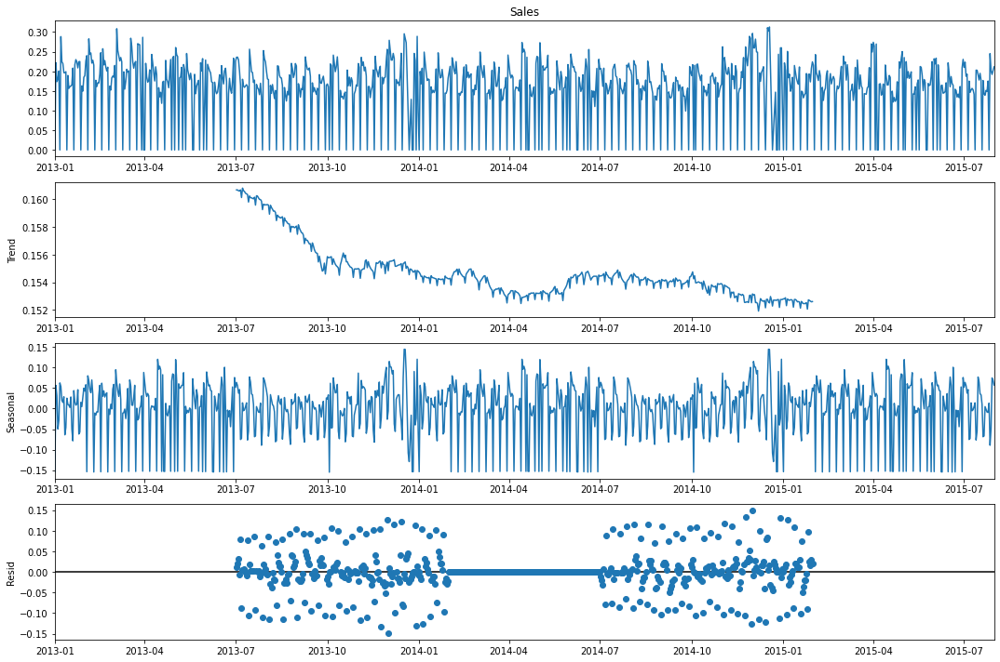

In [62]:
# seasonal decomposition to see trend, seasonal & residual component
seasonal_decomposition_plot(store1['Sales'])

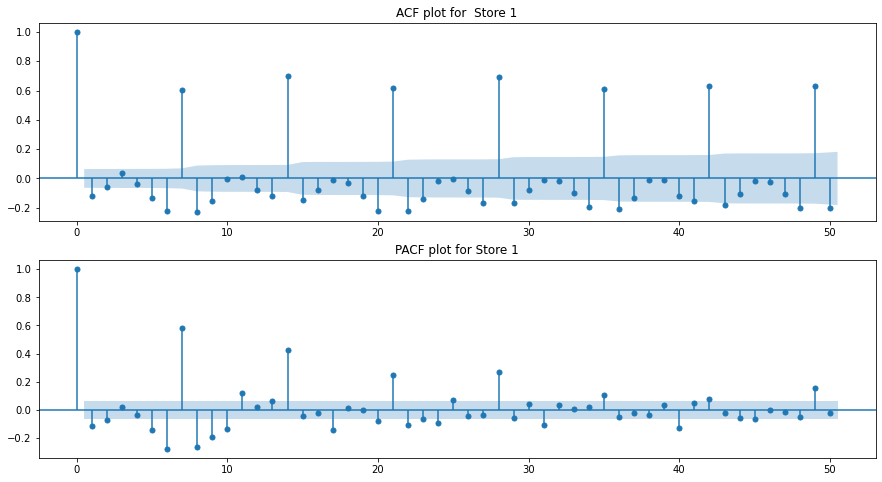

In [63]:
# acf & pacf plot to determine q & p values for model
acf_pacf_plot(store1['Sales'], ' Store '+str(1))

- ADF test shows that time series is stationary. 
- Store 1 sales is having downward trend.
- Novermber and December months shows spike in the Sales. There indicates seasonality.
- PACF plot shows significant high value at 7.
- ACF plot shows some trend and doesnt cut off.
- p=7 and q=0 are selected.

### ARIMAX Model

In [64]:
# Empty DataFrame to Store results obtained
results1 = pd.DataFrame(columns= ['Time Series Model','Store','Variable','MAPE','RMSE'])
results1

,Time Series Model,Store,Variable,MAPE,RMSE


In [65]:
store1.head()

,Sales,Customers,Promo,DayOfWeek,Open
2013-01-01,0.00000,0.00000,0.00000,2.00000,0.00000
2013-01-02,0.22225,0.23563,0.00000,3.00000,1.00000
2013-01-03,0.17390,0.20388,0.00000,4.00000,1.00000
2013-01-04,0.18029,0.21834,0.00000,5.00000,1.00000
2013-01-05,0.20083,0.22399,0.00000,6.00000,1.00000


             Sales  ArimaxForecastedSales
2015-06-20 0.16466                0.16000
2015-06-21 0.00000                0.00000
2015-06-22 0.15457                0.16000
2015-06-23 0.15119                0.14000
2015-06-24 0.13447                0.13000


 ------------ Test & Model forecast -----------------------


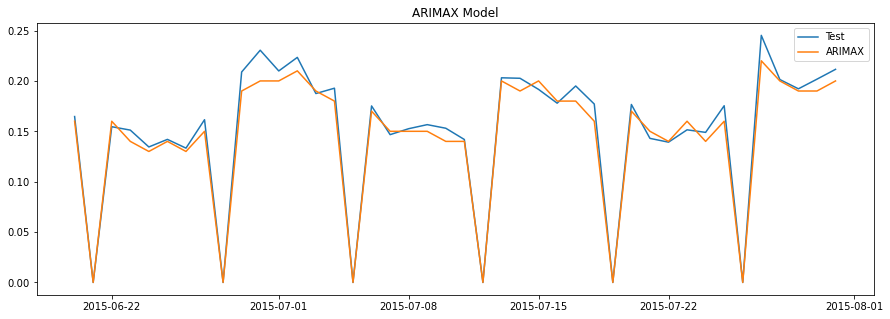

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,1,Sales,4.14000,0.01000


In [66]:
# Instantiate Model
endog=['Sales']
arimax1 = ARMA_Model(data=store1,store_number=1,endog=endog,exog=exo_uni_features, order=(7,0,0))
temp1 = arimax1.build_model_ARIMAX() # model building
results1 = pd.concat([results1, temp1])
results1

### SARIMAX Model

C:\Users\shail\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


             Sales  SarimaxForecastedSales
2015-06-20 0.16466                 0.16000
2015-06-21 0.00000                 0.00000
2015-06-22 0.15457                 0.16000
2015-06-23 0.15119                 0.14000
2015-06-24 0.13447                 0.13000


 ------------ Test & Model forecast -----------------------


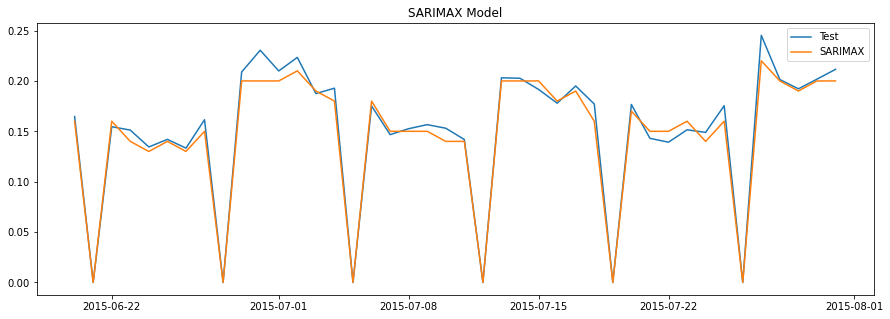

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,1,Sales,4.14000,0.01000
0,SARIMAX,1,Sales,3.83000,0.01000


In [67]:
# Instantiate Model
sarimax1 = ARMA_Model(data=store1,store_number=1,endog=endog,order=(7,0,0),seasonal_order=(7,0,1,12),exog=exo_uni_features)
temp1 = sarimax1.build_model_SARIMAX() # model building
results1 = pd.concat([results1, temp1])
results1

In [68]:
# Checking for Cointegration between Sales and Customers
johansen_test(store1, ['Sales','Customers'])

   max_eig_stat  trace_stat
0     151.26262   184.94299
1      33.68036    33.68036 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 

The Rank is 2. There is no cointegration but the series is stationary. VAR/VARMAX models can be build.'
'


### VAR Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                             VAR(7)   Log Likelihood                4136.086
Date:                    Wed, 20 Jul 2022   AIC                          -8210.172
Time:                            20:44:57   BIC                          -8061.298
Sample:                        01-01-2013   HQIC                         -8153.301
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.11, 0.00   Jarque-Bera (JB):        869.66, 31.31
Prob(Q):                        0.74, 0.99   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.19, 0.98   Skew:                     -0.40, -0.10
Prob(H) (two-sided):            0.14, 0.83   Kurtosis:                   7.75, 3.89


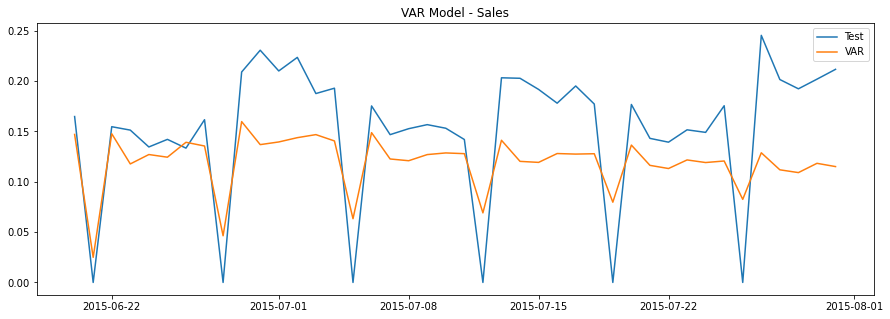

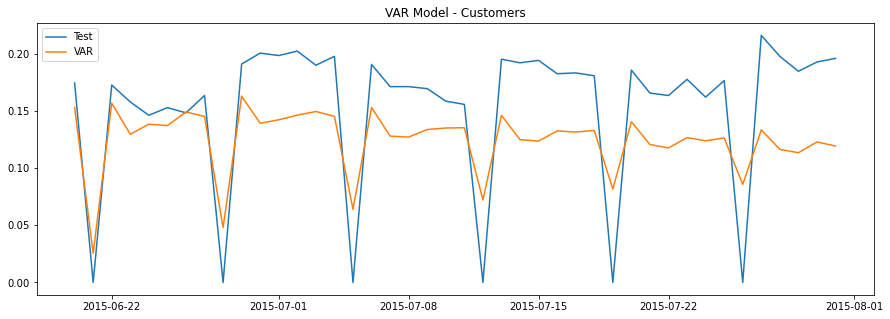

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,1,Sales,4.14000,0.01000
0,SARIMAX,1,Sales,3.83000,0.01000
0,VAR,1,Sales,27.40000,0.06000
0,VAR,1,Customers,26.49000,0.05000


In [69]:
# endogenuous vairable for VAR models
endog_multi_variate = ['Sales','Customers']
# Instantiate VAR Model class
var1 = VAR_Model(data=store1,store_number=1,endog=endog_multi_variate,order=(7,0))
temp1 = var1.build_model_VAR() # model building
results1 = pd.concat([results1,temp1]) # concat results
results1

### VARMAX Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                4835.125
Date:                    Wed, 20 Jul 2022   AIC                          -9596.250
Time:                            20:46:02   BIC                          -9418.561
Sample:                        01-01-2013   HQIC                         -9528.372
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            36.75, 2.80   Jarque-Bera (JB):      1279.93, 155.29
Prob(Q):                        0.00, 0.09   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.32, 0.90   Skew:                      0.58, -0.00
Prob(H) (two-sided):            0.02, 0.36   Kurtosis:                   8.72, 5.03


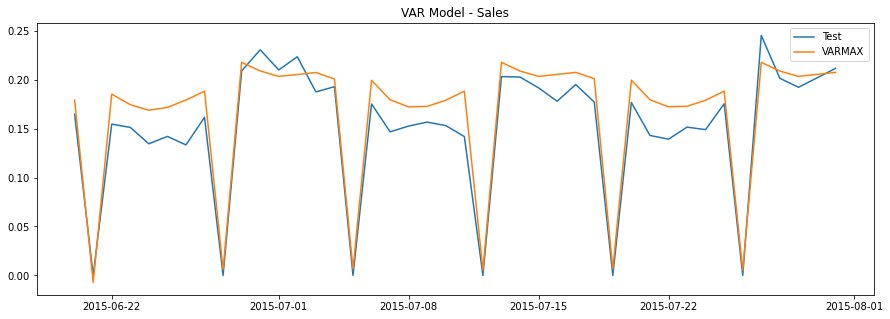

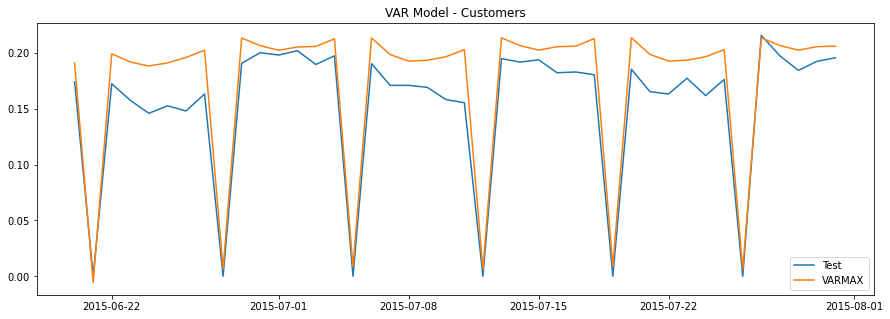

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,1,Sales,4.14000,0.01000
0,SARIMAX,1,Sales,3.83000,0.01000
0,VAR,1,Sales,27.40000,0.06000
0,VAR,1,Customers,26.49000,0.05000
0,VARMAX,1,Sales,11.77000,0.02000
0,VARMAX,1,Customers,12.43000,0.02000


In [70]:
# Instantiate VAR Model class
varmax1 = VAR_Model(data=store1,store_number=1,endog=endog_multi_variate,order=(7,0), exog= exo_mul_features)
temp1 = varmax1.build_model_VARMAX() # model building
temp1
results1 = pd.concat([results1,temp1]) # concat results
results1

### Best model
For Store no. 1 is SARIMAX with MAPE-3.83, RMSE-0.01

## Store 3

### Pre-Processing of Data

Outliers above 99 percentile removed
Imputed missing values using linear interpolation
942


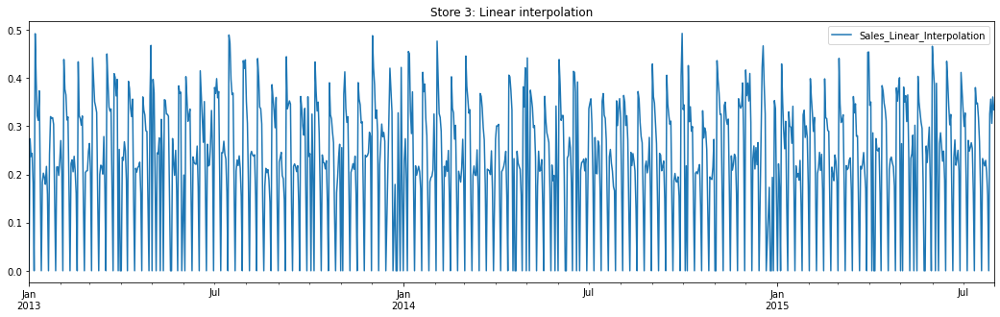

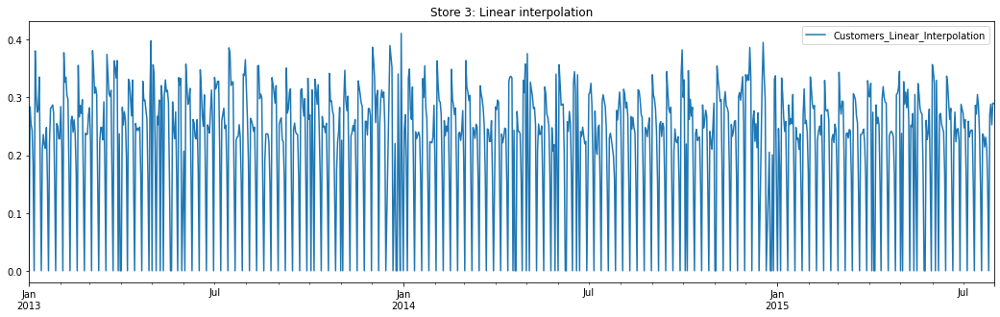

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000


In [71]:
store3 = data[data['Store'] == 3] # filter data for store num 3
store3.drop(['Store'], axis=1, inplace=True) # Drop store column
store3 = remove_outliers(store3) # Remove outliers
store3= impute_missing_values(store3, 3) # Impute missing values
store3.sort_index(inplace=True)

In [72]:
store3.head() # print first 5 lines of store3

,Sales,Customers,Promo,DayOfWeek,Open
2013-01-01,0.00000,0.00000,0.00000,2.00000,0.00000
2013-01-02,0.27421,0.28395,0.00000,3.00000,1.00000
2013-01-03,0.23720,0.25432,0.00000,4.00000,1.00000
2013-01-04,0.24391,0.24339,0.00000,5.00000,1.00000
2013-01-05,0.18178,0.18519,0.00000,6.00000,1.00000


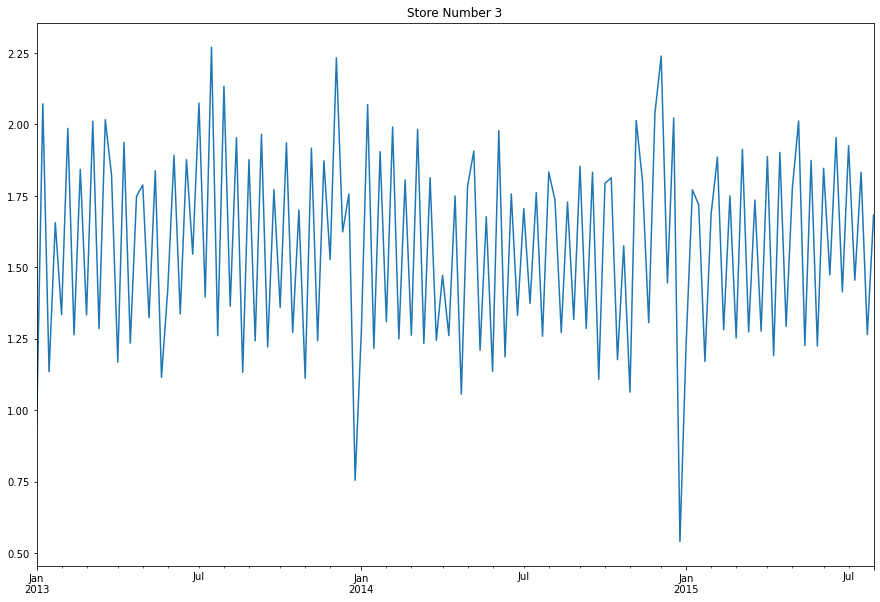

In [73]:
time_series_plot(store3['Sales'], '3') # plot time series

In [74]:
stationarity_test_adf(store3['Sales'], 3) # stationarity test

ADF Statistic: -7.213068
p-value: 0.000000
Critical Values:
	5%: -2.865
Store 3 is Stationary Time Series


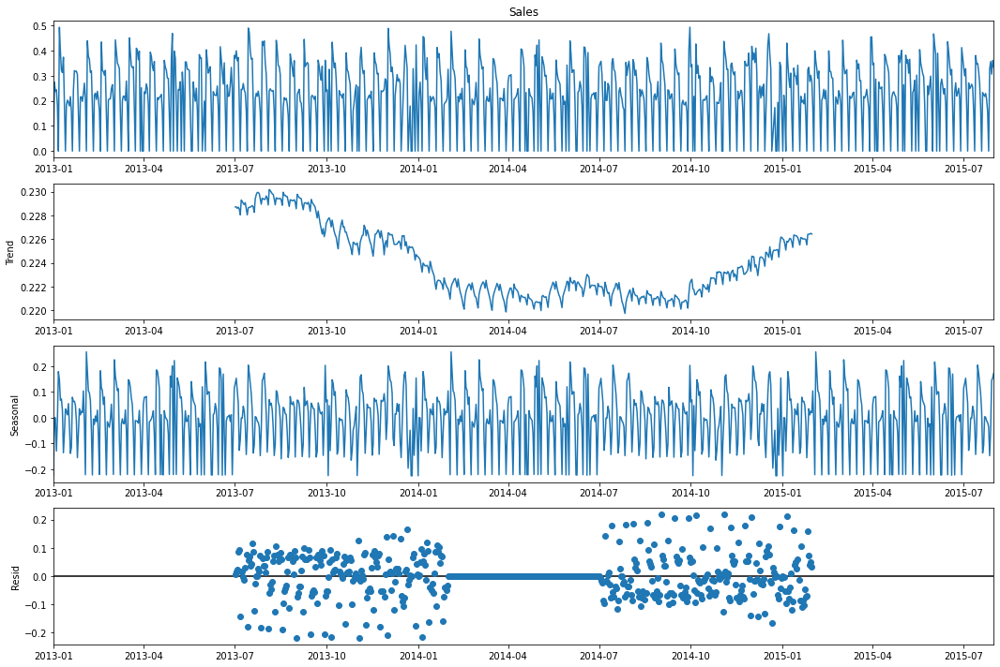

In [75]:
# seasonal decomposition to see trend, seasonal & residual component
seasonal_decomposition_plot(store3['Sales'])

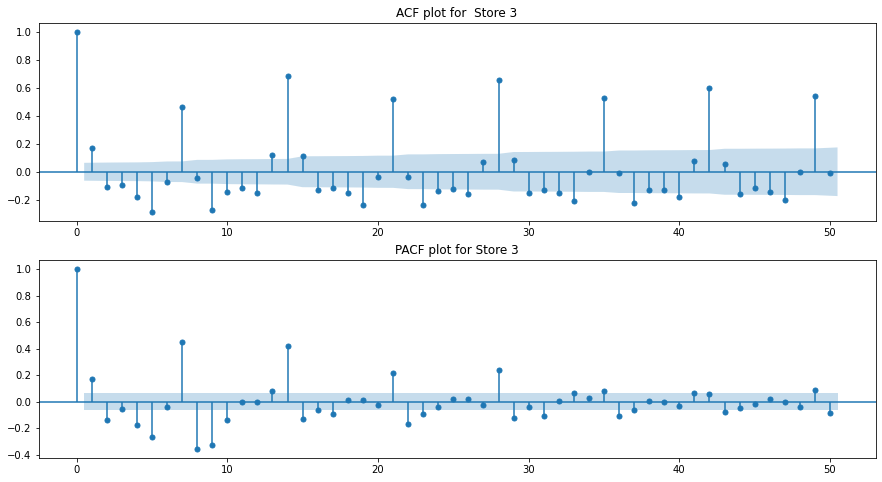

In [76]:
# acf & pacf plot to determine q & p values for model
acf_pacf_plot(store3['Sales'], ' Store '+str(3))

- ADF test shows that time series is stationary.
- Store 3 sales decrease and then increase from october 2014.
- In Novermber and December, there is increase in the Sales. This shows seasonality.
- PACF plot shows significant high value at 7.
- ACF plot shows some trend and doesnt cut off.
- p=7 and q=0 are selected.

### ARIMAX Model

In [77]:
# Empty DataFrame to Store results obtained
results3 = pd.DataFrame(columns= ['Time Series Model','Store','Variable','MAPE','RMSE'])
results3

,Time Series Model,Store,Variable,MAPE,RMSE


In [78]:
store3.head()

,Sales,Customers,Promo,DayOfWeek,Open
2013-01-01,0.00000,0.00000,0.00000,2.00000,0.00000
2013-01-02,0.27421,0.28395,0.00000,3.00000,1.00000
2013-01-03,0.23720,0.25432,0.00000,4.00000,1.00000
2013-01-04,0.24391,0.24339,0.00000,5.00000,1.00000
2013-01-05,0.18178,0.18519,0.00000,6.00000,1.00000


             Sales  ArimaxForecastedSales
2015-06-20 0.15638                0.14000
2015-06-21 0.00000               -0.01000
2015-06-22 0.23471                0.22000
2015-06-23 0.27156                0.27000
2015-06-24 0.21895                0.21000


 ------------ Test & Model forecast -----------------------


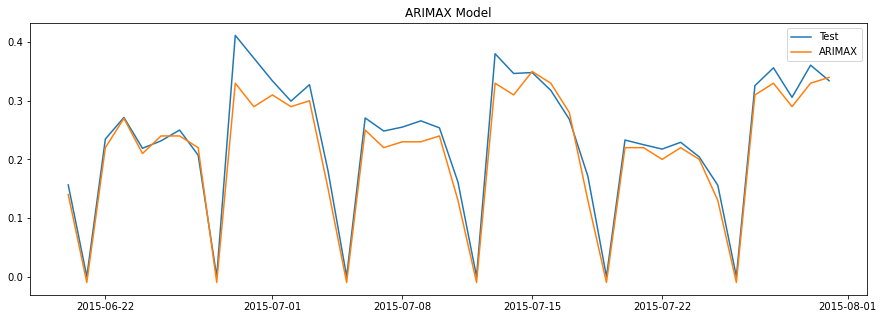

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,3,Sales,7.82000,0.03000


In [79]:
# build ARIMA model
endog=['Sales'] # endogenuous variable
# instantiate ARMA model class
arimax3 = ARMA_Model(data=store3,store_number=3,endog=endog,exog=exo_uni_features, order=(7,0,0))
temp3 = arimax3.build_model_ARIMAX() 
temp3
results3 = pd.concat([results3, temp3]) # concat results with results3 dataframe
results3

### SARIMAX Model

C:\Users\shail\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


             Sales  SarimaxForecastedSales
2015-06-20 0.15638                 0.13000
2015-06-21 0.00000                -0.01000
2015-06-22 0.23471                 0.23000
2015-06-23 0.27156                 0.29000
2015-06-24 0.21895                 0.20000


 ------------ Test & Model forecast -----------------------


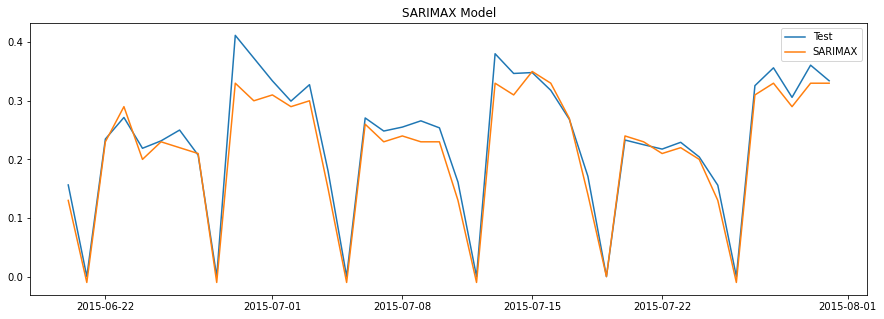

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,3,Sales,7.82000,0.03000
0,SARIMAX,3,Sales,7.37000,0.03000


In [80]:
# Instantiate ARMA Model class
sarimax3 = ARMA_Model(data=store3,store_number=3,endog=endog,order=(7,0,0),seasonal_order=(7,0,0,12),exog=exo_uni_features)
temp3 = sarimax3.build_model_SARIMAX()
results3 = pd.concat([results3, temp3]) # concat result
results3

In [81]:
# Checking for Cointegration between Sales and Customers
johansen_test(store3, ['Sales','Customers'])

   max_eig_stat  trace_stat
0     146.75546   193.91894
1      47.16348    47.16348 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 

The Rank is 2. There is no cointegration but the series is stationary. VAR/VARMAX models can be build.'
'


### VAR Model

In [82]:
endog_multi_variate

['Sales', 'Customers']

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                             VAR(7)   Log Likelihood                3300.781
Date:                    Wed, 20 Jul 2022   AIC                          -6539.562
Time:                            20:48:13   BIC                          -6390.688
Sample:                        01-01-2013   HQIC                         -6482.691
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.36, 0.46   Jarque-Bera (JB):       537.40, 170.28
Prob(Q):                        0.55, 0.50   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.01, 1.25   Skew:                     -0.28, -0.45
Prob(H) (two-sided):            0.93, 0.06   Kurtosis:                   6.74, 4.93


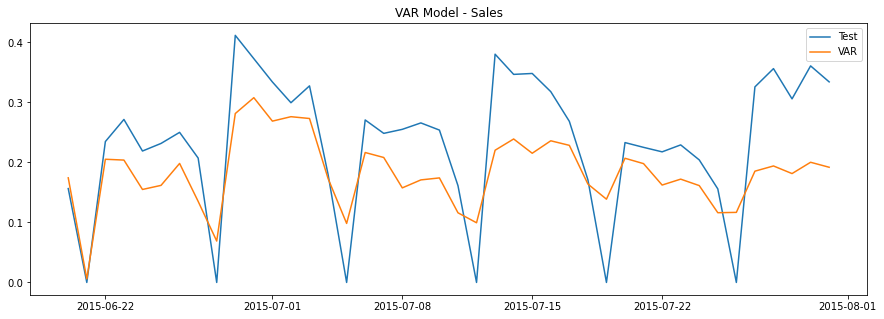

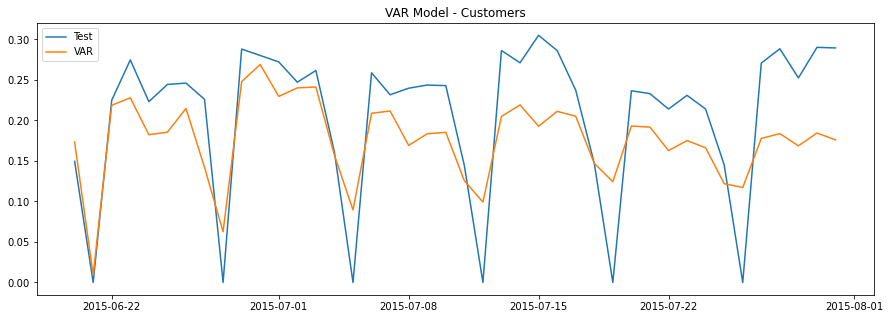

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,3,Sales,7.82000,0.03000
0,SARIMAX,3,Sales,7.37000,0.03000
0,VAR,3,Sales,27.40000,0.09000
0,VAR,3,Customers,22.94000,0.07000


In [83]:
# endogenuous vairable for VAR models
endog_multi_variate = ['Sales','Customers']
# Instantiate VAR model class
var3 = VAR_Model(data=store3,store_number=3,endog=endog_multi_variate,order=(7,0))
temp3 = var3.build_model_VAR() # model building
results3 = pd.concat([results3,temp3]) # concat
results3

### VARMAX Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                4165.074
Date:                    Wed, 20 Jul 2022   AIC                          -8256.149
Time:                            20:49:44   BIC                          -8078.460
Sample:                        01-01-2013   HQIC                         -8188.270
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            36.32, 2.91   Jarque-Bera (JB):      1876.00, 276.66
Prob(Q):                        0.00, 0.09   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.10, 1.07   Skew:                      0.97, -0.29
Prob(H) (two-sided):            0.39, 0.57   Kurtosis:                   9.80, 5.65


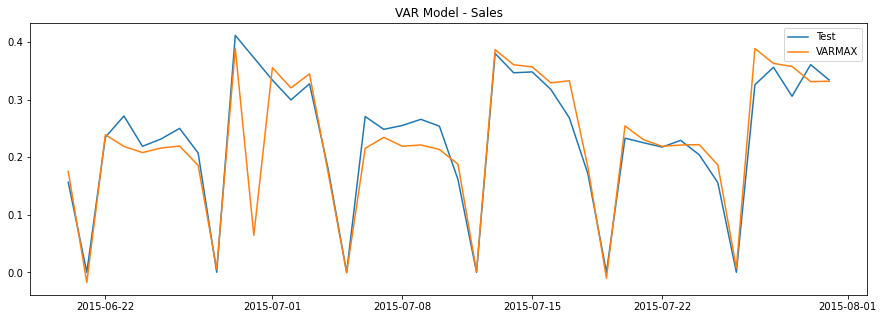

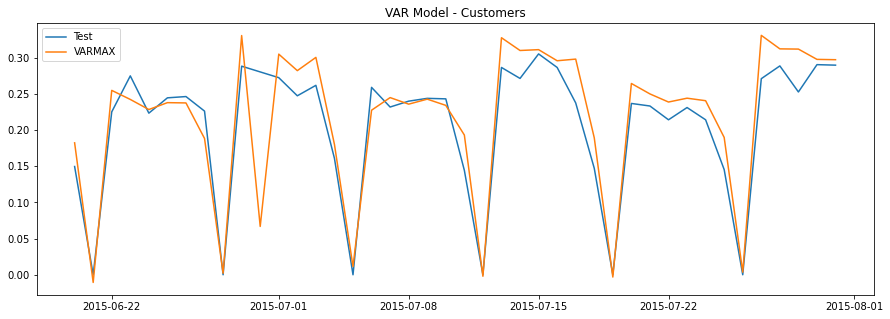

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,3,Sales,7.82000,0.03000
0,SARIMAX,3,Sales,7.37000,0.03000
0,VAR,3,Sales,27.40000,0.09000
0,VAR,3,Customers,22.94000,0.07000
0,VARMAX,3,Sales,10.00000,0.05000
0,VARMAX,3,Customers,12.25000,0.04000


In [84]:
# Instantiate VAR Model class
varmax3 = VAR_Model(data=store3,store_number=3,endog=endog_multi_variate,order=(7,0), exog= exo_mul_features)
temp3 = varmax3.build_model_VARMAX() # model building
temp3
results3 = pd.concat([results3,temp3]) # concat result of varmax to result3 dataframe
results3

### Best model
For Store no. 3 is SARIMAX with MAPE-7.37 , RMSE-0.03

## Store 8

### Pre-Processing of Data

Outliers above 99 percentile removed
Imputed missing values using linear interpolation
942


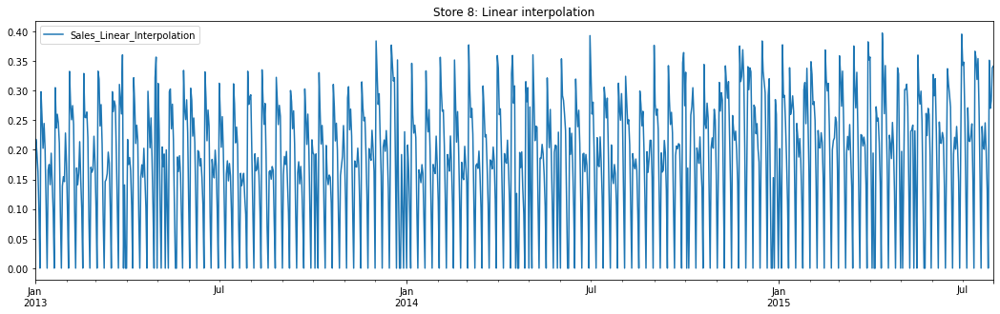

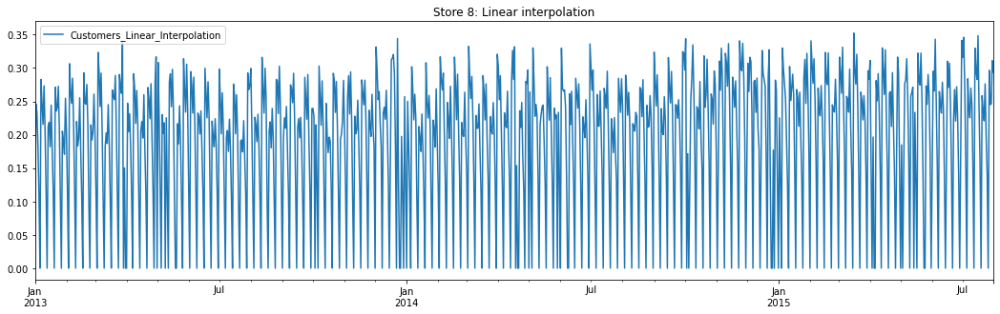

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000


In [85]:
store8 = data[data['Store'] == 8] # filter data for store num 8
store8.drop(['Store'], axis=1, inplace=True) # Drop store column
store8 = remove_outliers(store8) # Remove outliers
store8= impute_missing_values(store8, 8) # Impute missing values
store8.sort_index(inplace=True)

In [86]:
store8.head() # print first 5 lines of store8

,Sales,Customers,Promo,DayOfWeek,Open
2013-01-01,0.00000,0.00000,0.00000,2.00000,0.00000
2013-01-02,0.21779,0.24621,0.00000,3.00000,1.00000
2013-01-03,0.19460,0.23351,0.00000,4.00000,1.00000
2013-01-04,0.16313,0.18236,0.00000,5.00000,1.00000
2013-01-05,0.09392,0.11005,0.00000,6.00000,1.00000


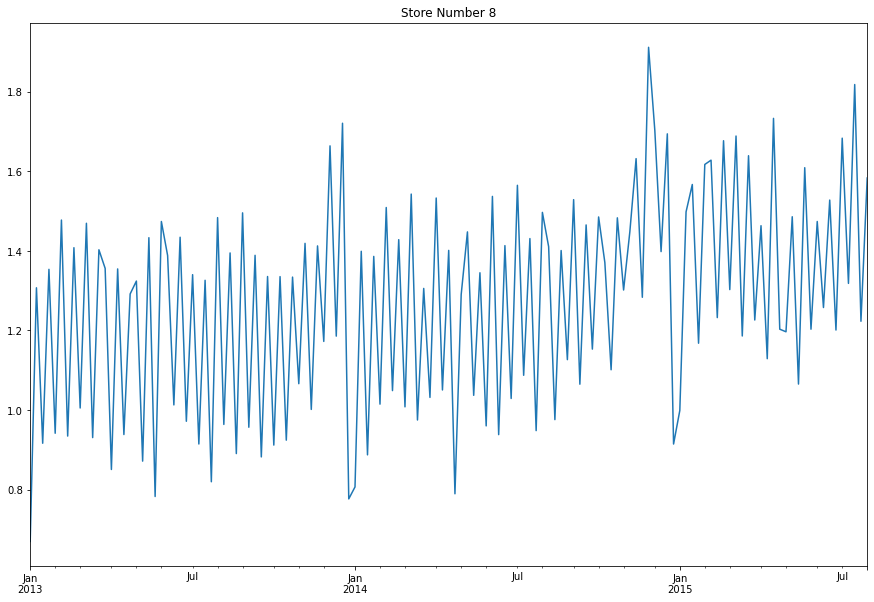

In [87]:
time_series_plot(store8['Sales'], '8') # plot time series

In [88]:
stationarity_test_adf(store8['Sales'], 8) # stationarity test

ADF Statistic: -3.866695
p-value: 0.002294
Critical Values:
	5%: -2.865
Store 8 is Stationary Time Series


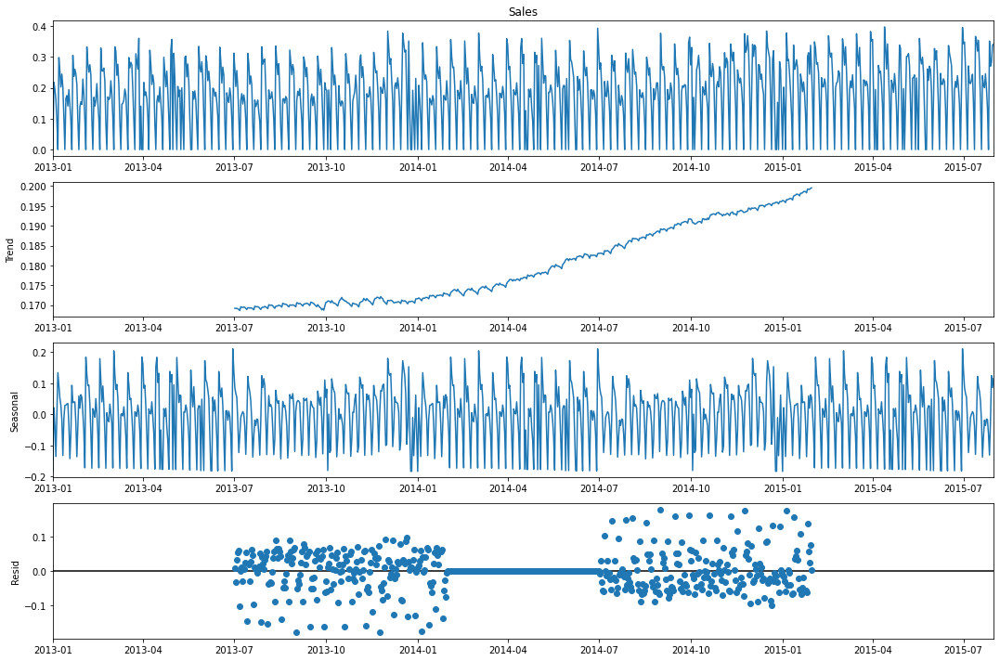

In [89]:
# seasonal decomposition to see trend, seasonal & residual component
seasonal_decomposition_plot(store8['Sales'])

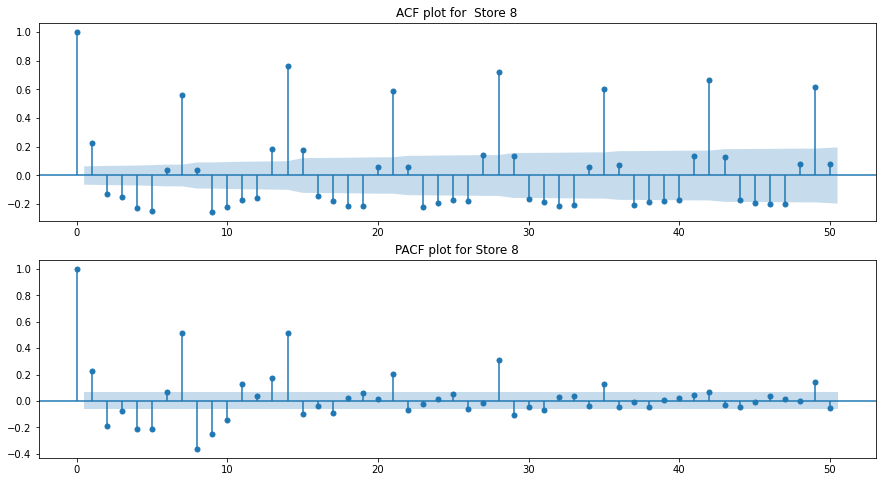

In [90]:
# acf & pacf plot to determine q & p values for model
acf_pacf_plot(store8['Sales'], ' Store '+str(8))

- ADF test shows that time series is stationary.
- Store 8 sales increase consistantly over time.
- PACF plot shows significant high value at 7 and 14.
- ACF plot shows some trend and doesnt cut off.
- p=7 and q=0 are selected.

### ARIMAX Model

In [91]:
# Empty DataFrame to Store results obtained
results8 = pd.DataFrame(columns= ['Time Series Model','Store','Variable','MAPE','RMSE'])
results8

,Time Series Model,Store,Variable,MAPE,RMSE


             Sales  ArimaxForecastedSales
2015-06-20 0.14512                0.13000
2015-06-21 0.00000               -0.00000
2015-06-22 0.19275                0.21000
2015-06-23 0.22108                0.25000
2015-06-24 0.20115                0.20000


 ------------ Test & Model forecast -----------------------


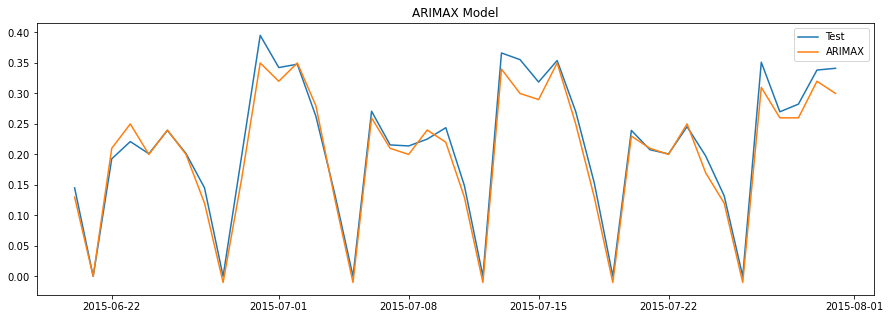

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,8,Sales,6.99000,0.02000


In [92]:
# build ARIMAX model
endog=['Sales'] # endogenuous variable
# instantiate ARMA model class
arimax8 = ARMA_Model(data=store8,store_number=8,endog=endog,exog=exo_uni_features, order=(7,0,0))
temp8 = arimax8.build_model_ARIMAX() 
temp8
results8 = pd.concat([results8, temp8]) # concat results with results8 dataframe
results8

### SARIMAX Model

C:\Users\shail\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


             Sales  SarimaxForecastedSales
2015-06-20 0.14512                 0.13000
2015-06-21 0.00000                -0.00000
2015-06-22 0.19275                 0.22000
2015-06-23 0.22108                 0.25000
2015-06-24 0.20115                 0.20000


 ------------ Test & Model forecast -----------------------


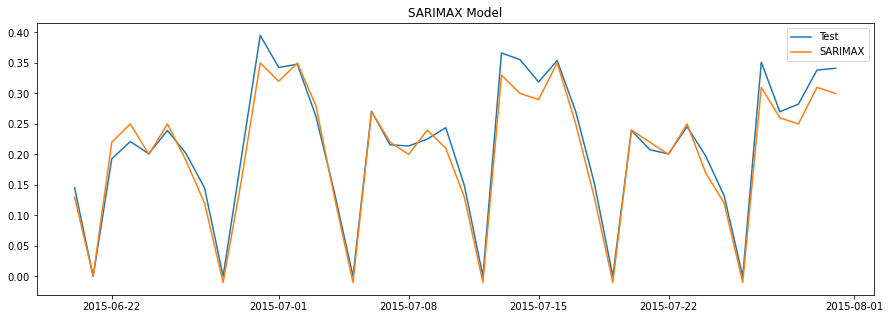

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,8,Sales,6.99000,0.02000
0,SARIMAX,8,Sales,7.58000,0.02000


In [93]:
# Instantiate ARMA Model class
sarimax8 = ARMA_Model(data=store8,store_number=8,endog=endog,order=(7,0,0),seasonal_order=(7,0,0,12),exog=exo_uni_features)
temp8 = sarimax8.build_model_SARIMAX()
results8 = pd.concat([results8, temp8]) # concat result
results8

In [94]:
# Checking for Cointegration between Sales and Customers
johansen_test(store8, ['Sales','Customers'])

   max_eig_stat  trace_stat
0     159.53165   212.51675
1      52.98510    52.98510 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 

The Rank is 2. There is no cointegration but the series is stationary. VAR/VARMAX models can be build.'
'


### VAR Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                             VAR(7)   Log Likelihood                3626.437
Date:                    Wed, 20 Jul 2022   AIC                          -7190.875
Time:                            20:52:05   BIC                          -7042.001
Sample:                        01-01-2013   HQIC                         -7134.004
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.02, 0.03   Jarque-Bera (JB):        952.03, 92.86
Prob(Q):                        0.89, 0.87   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.53, 1.35   Skew:                      0.07, -0.26
Prob(H) (two-sided):            0.00, 0.01   Kurtosis:                   8.04, 4.49


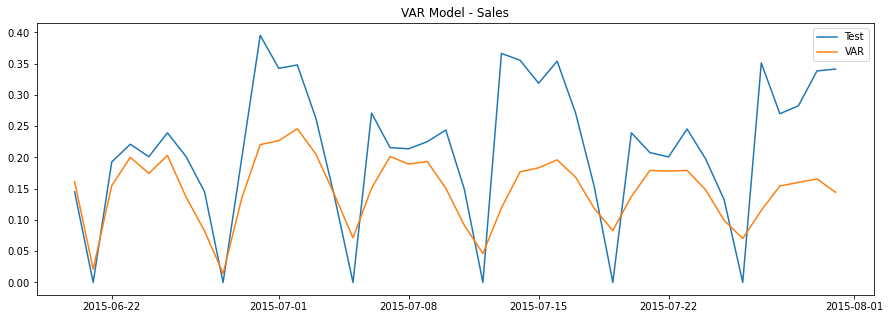

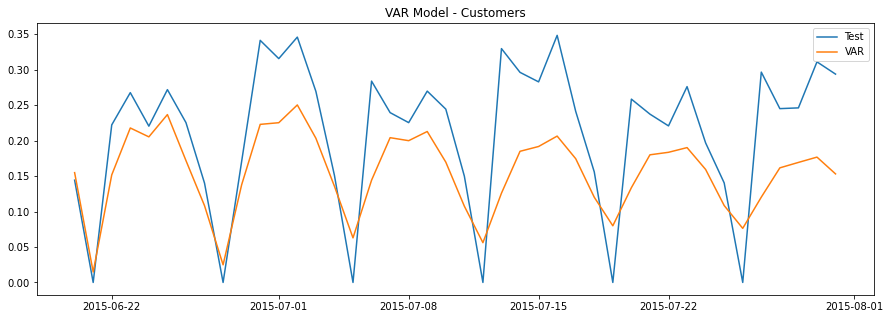

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,8,Sales,6.99000,0.02000
0,SARIMAX,8,Sales,7.58000,0.02000
0,VAR,8,Sales,30.38000,0.10000
0,VAR,8,Customers,27.95000,0.08000


In [95]:
# endogenuous vairable for VAR models
endog_multi_variate = ['Sales','Customers']
# Instantiate VAR model class
var8 = VAR_Model(data=store8,store_number=8,endog=endog_multi_variate,order=(7,0))
temp8 = var8.build_model_VAR() # model building
results8 = pd.concat([results8,temp8]) # concat
results8

### VARMAX Model

C:\Users\shail\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                4404.024
Date:                    Wed, 20 Jul 2022   AIC                          -8734.048
Time:                            20:53:34   BIC                          -8556.359
Sample:                        01-01-2013   HQIC                         -8666.169
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            74.73, 0.20   Jarque-Bera (JB):       253.14, 276.05
Prob(Q):                        0.00, 0.66   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.65, 1.34   Skew:                      0.29, -0.15
Prob(H) (two-sided):            0.00, 0.01   Kurtosis:                   5.53, 5.70


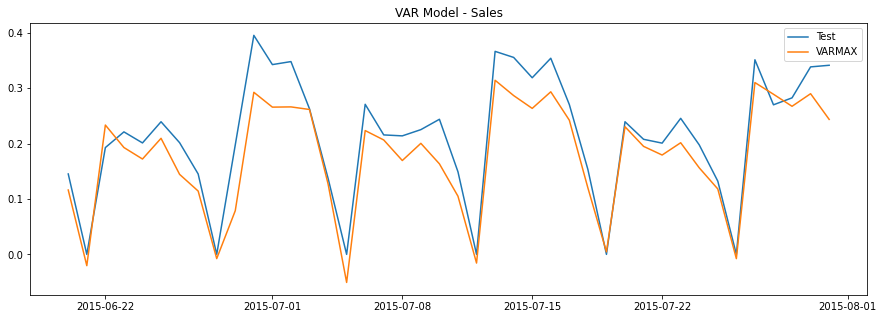

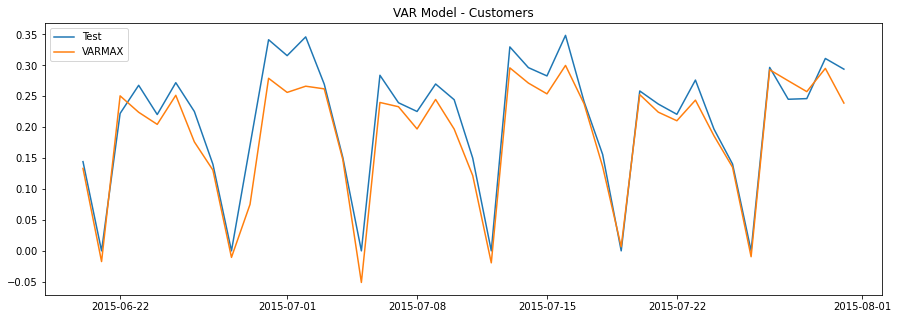

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,8,Sales,6.99000,0.02000
0,SARIMAX,8,Sales,7.58000,0.02000
0,VAR,8,Sales,30.38000,0.10000
0,VAR,8,Customers,27.95000,0.08000
0,VARMAX,8,Sales,16.04000,0.05000
0,VARMAX,8,Customers,11.09000,0.03000


In [96]:
# Instantiate VAR Model class
varmax8 = VAR_Model(data=store8,store_number=8,endog=endog_multi_variate,order=(7,0), exog= exo_mul_features)
temp8 = varmax8.build_model_VARMAX() # model building
temp8
results8 = pd.concat([results8,temp8]) # concat result of varmax to result8 dataframe
results8

### Best model
For Store no. 8 is ARIMAX with MAPE-6.99 , RMSE-0.02

## Store 9

### Pre-Processing of Data

Outliers above 99 percentile removed
Imputed missing values using linear interpolation
942


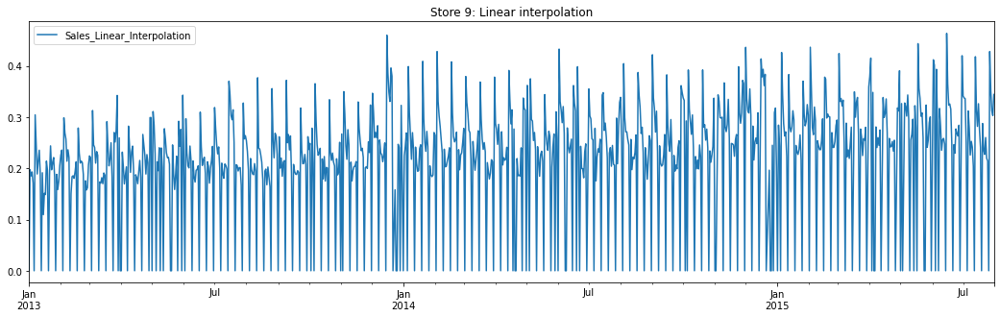

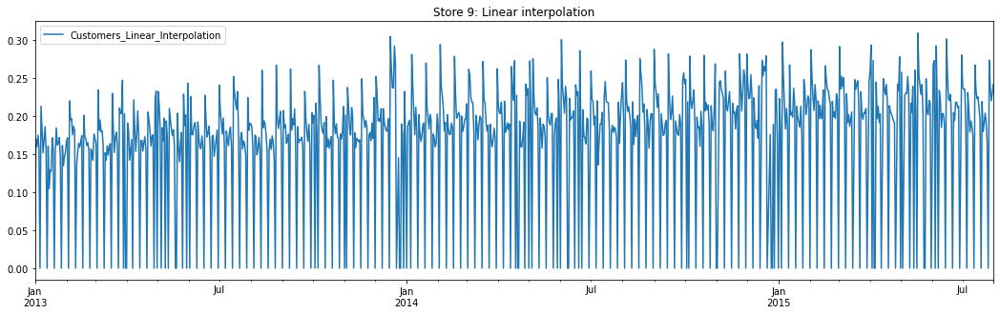

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000


In [97]:
store9 = data[data['Store'] == 9] # filter data for store num 9
store9.drop(['Store'], axis=1, inplace=True) # Drop store column
store9 = remove_outliers(store9) # Remove outliers
store9= impute_missing_values(store9, 9) # Impute missing values
store9.sort_index(inplace=True)

In [98]:
store9.head() # print first 5 lines of store9

,Sales,Customers,Promo,DayOfWeek,Open
2013-01-01,0.00000,0.00000,0.00000,2.00000,0.00000
2013-01-02,0.19705,0.16966,0.00000,3.00000,1.00000
2013-01-03,0.18495,0.15979,0.00000,4.00000,1.00000
2013-01-04,0.19283,0.17531,0.00000,5.00000,1.00000
2013-01-05,0.17097,0.15873,0.00000,6.00000,1.00000


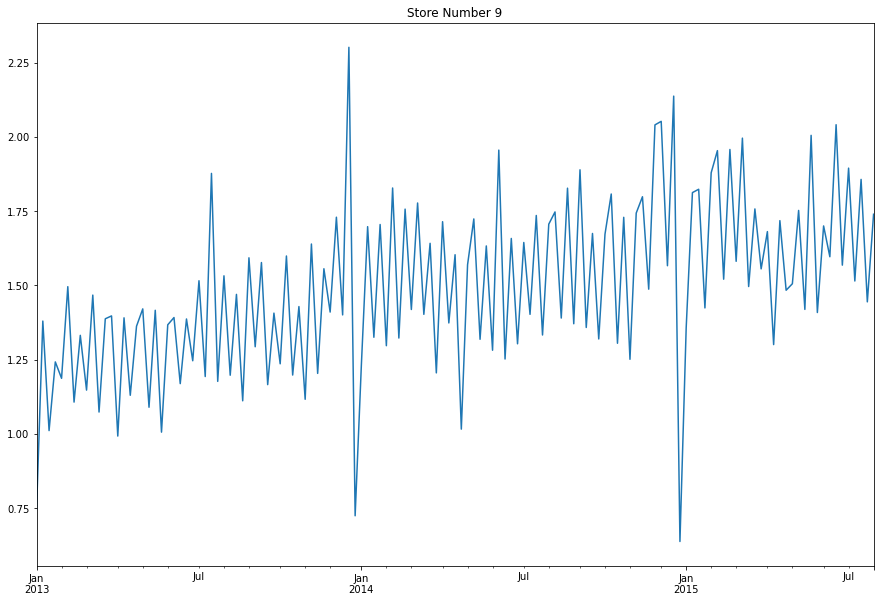

In [99]:
time_series_plot(store9['Sales'], '9') # plot time series

In [100]:
stationarity_test_adf(store9['Sales'], 9) # stationarity test

ADF Statistic: -3.782094
p-value: 0.003096
Critical Values:
	5%: -2.865
Store 9 is Stationary Time Series


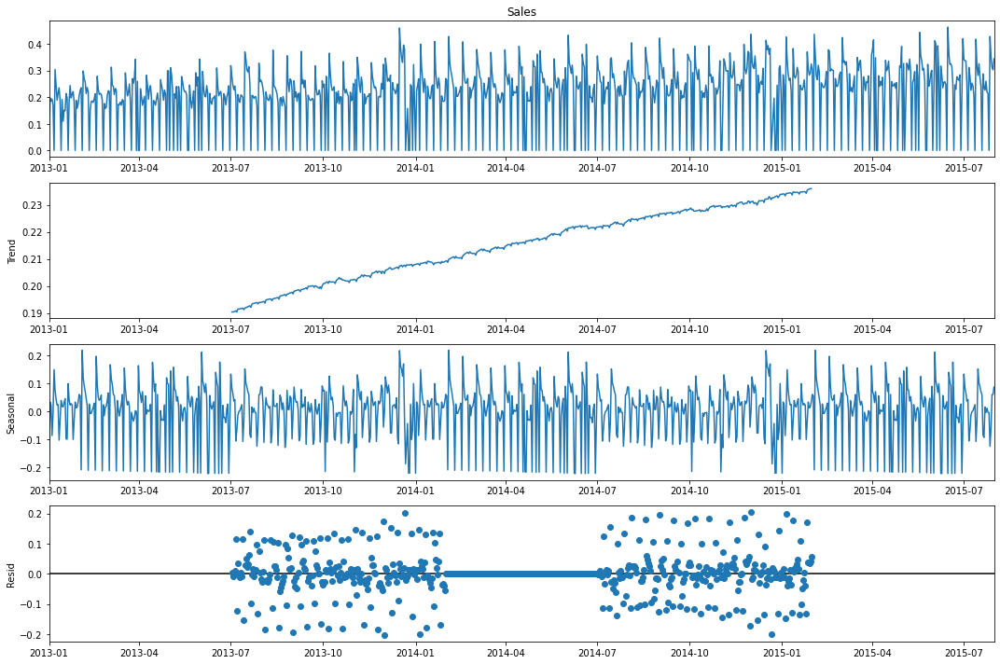

In [101]:
# seasonal decomposition to see trend, seasonal & residual component
seasonal_decomposition_plot(store9['Sales'])

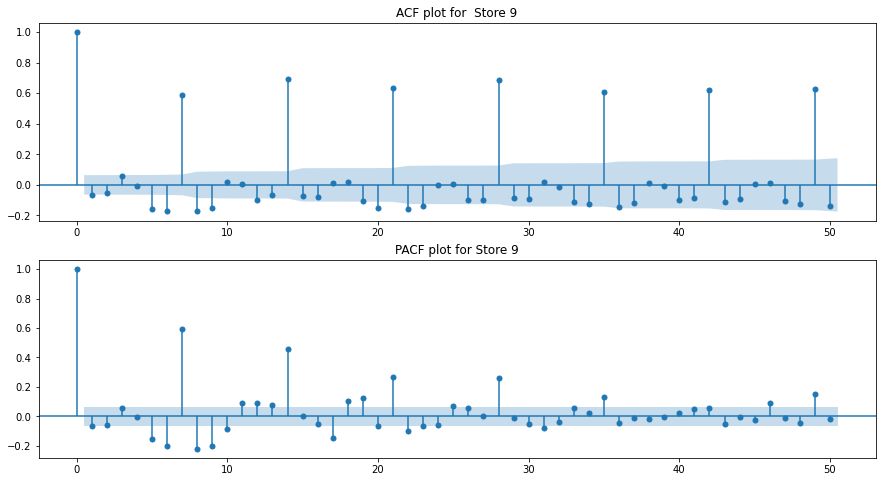

In [102]:
# acf & pacf plot to determine q & p values for model
acf_pacf_plot(store9['Sales'], ' Store '+str(9))

- ADF test confirms that time series is stationary.
- Store 9 sales increase consistently over time showing upwards trend.
- PACF plot shows significant high value at 7.
- ACF plot shows some trend and doesnt cut off.
- p=7 and q=0 are selected.

### ARIMAX Model

In [103]:
# Empty DataFrame to Store results obtained
results9 = pd.DataFrame(columns= ['Time Series Model','Store','Variable','MAPE','RMSE'])
results9

,Time Series Model,Store,Variable,MAPE,RMSE


             Sales  ArimaxForecastedSales
2015-06-20 0.24833                0.24000
2015-06-21 0.00000               -0.00000
2015-06-22 0.24600                0.26000
2015-06-23 0.22964                0.24000
2015-06-24 0.27683                0.28000


 ------------ Test & Model forecast -----------------------


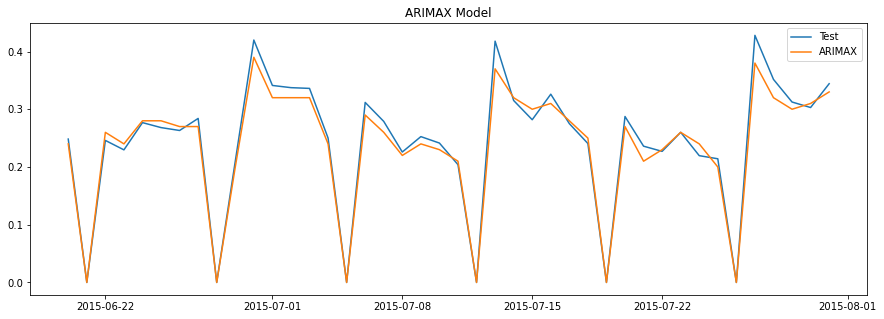

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,9,Sales,4.35000,0.02000


In [104]:
# build ARIMAX model
endog=['Sales'] # endogenuous variable
# instantiate ARMA model class
arimax9 = ARMA_Model(data=store9,store_number=9,endog=endog,exog=exo_uni_features, order=(7,0,0))
temp9 = arimax9.build_model_ARIMAX() 
temp9
results9 = pd.concat([results9, temp9]) # concat results with results9 dataframe
results9

### SARIMAX Model

             Sales  SarimaxForecastedSales
2015-06-20 0.24833                 0.24000
2015-06-21 0.00000                -0.00000
2015-06-22 0.24600                 0.26000
2015-06-23 0.22964                 0.24000
2015-06-24 0.27683                 0.28000


 ------------ Test & Model forecast -----------------------


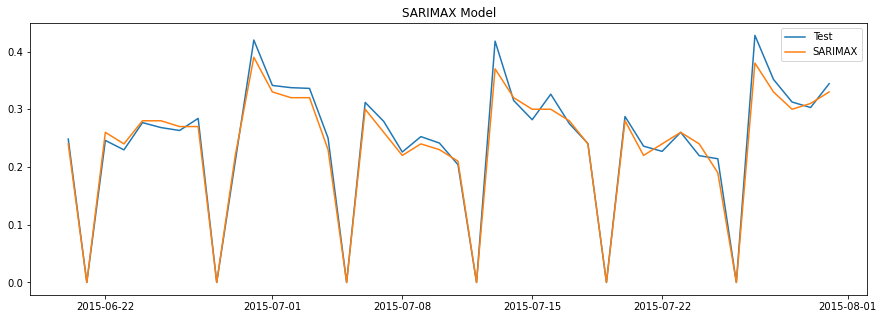

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,9,Sales,4.35000,0.02000
0,SARIMAX,9,Sales,4.25000,0.02000


In [105]:
# Instantiate ARMA Model class
sarimax9 = ARMA_Model(data=store9,store_number=9,endog=endog,order=(7,0,0),seasonal_order=(7,0,0,12),exog=exo_uni_features)
temp9 = sarimax9.build_model_SARIMAX()
results9 = pd.concat([results9, temp9]) # concat result
results9

In [106]:
# Checking for Cointegration between Sales and Customers
johansen_test(store9, ['Sales','Customers'])

   max_eig_stat  trace_stat
0     166.41896   203.24356
1      36.82460    36.82460 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 

The Rank is 2. There is no cointegration but the series is stationary. VAR/VARMAX models can be build.'
'


### VAR Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                             VAR(7)   Log Likelihood                3823.123
Date:                    Wed, 20 Jul 2022   AIC                          -7584.246
Time:                            20:59:54   BIC                          -7435.371
Sample:                        01-01-2013   HQIC                         -7527.375
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             6.13, 1.12   Jarque-Bera (JB):        675.09, 55.62
Prob(Q):                        0.01, 0.29   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.80, 1.46   Skew:                     -0.43, -0.39
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                   7.16, 3.94


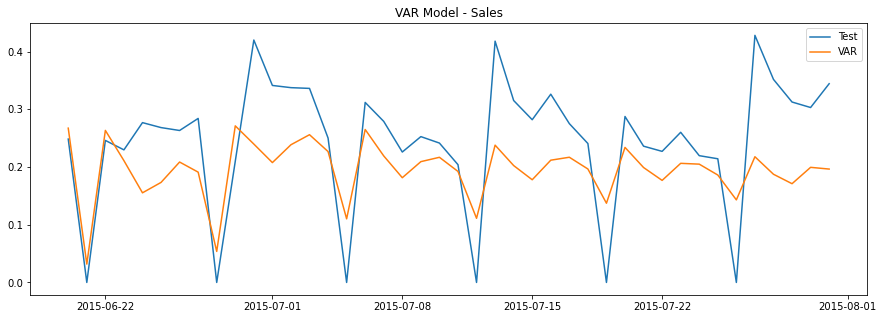

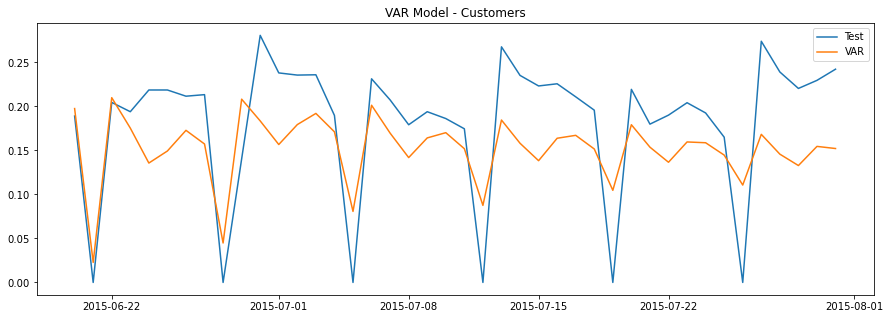

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,9,Sales,4.35000,0.02000
0,SARIMAX,9,Sales,4.25000,0.02000
0,VAR,9,Sales,27.72000,0.10000
0,VAR,9,Customers,26.41000,0.06000


In [107]:
# endogenuous vairable for VAR models
endog_multi_variate = ['Sales','Customers']
# Instantiate VAR model class
var9 = VAR_Model(data=store9,store_number=9,endog=endog_multi_variate,order=(7,0))
temp9 = var9.build_model_VAR() # model building
results9 = pd.concat([results9,temp9]) # concat
results9

### VARMAX Model

C:\Users\shail\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                4655.461
Date:                    Wed, 20 Jul 2022   AIC                          -9236.921
Time:                            21:04:13   BIC                          -9059.233
Sample:                        01-01-2013   HQIC                         -9169.043
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            29.61, 2.04   Jarque-Bera (JB):        39.07, 664.85
Prob(Q):                        0.00, 0.15   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.51, 1.18   Skew:                      0.14, -0.32
Prob(H) (two-sided):            0.00, 0.15   Kurtosis:                   3.98, 7.16


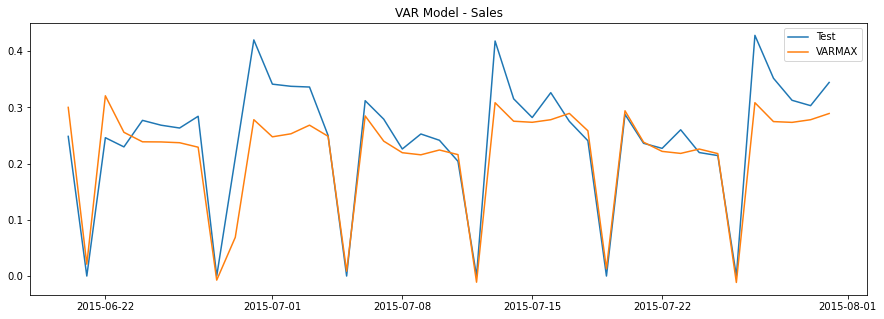

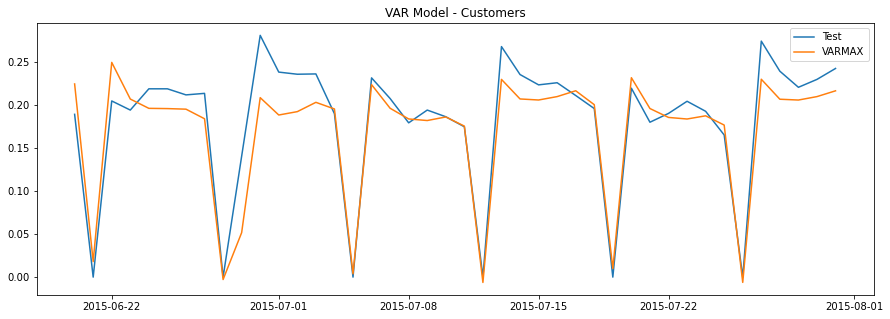

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,9,Sales,4.35000,0.02000
0,SARIMAX,9,Sales,4.25000,0.02000
0,VAR,9,Sales,27.72000,0.10000
0,VAR,9,Customers,26.41000,0.06000
0,VARMAX,9,Sales,13.23000,0.05000
0,VARMAX,9,Customers,9.94000,0.03000


In [108]:
# Instantiate VAR Model class
varmax9 = VAR_Model(data=store9,store_number=9,endog=endog_multi_variate,order=(7,0), exog= exo_mul_features)
temp9 = varmax9.build_model_VARMAX() # model building
temp9
results9 = pd.concat([results9,temp9]) # concat result of varmax to result9 dataframe
results9

### Best model
For Store no. 9 is SARIMAX with MAPE-4.25 , RMSE-0.02

## Store 13

### Pre-Processing of Data

Imputed missing values using linear interpolation
942


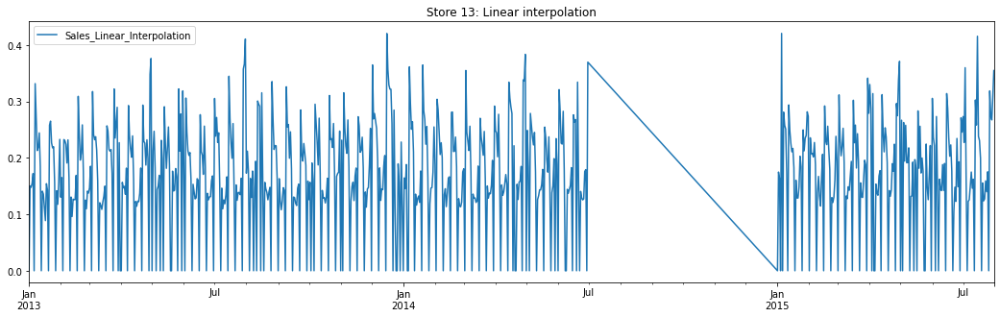

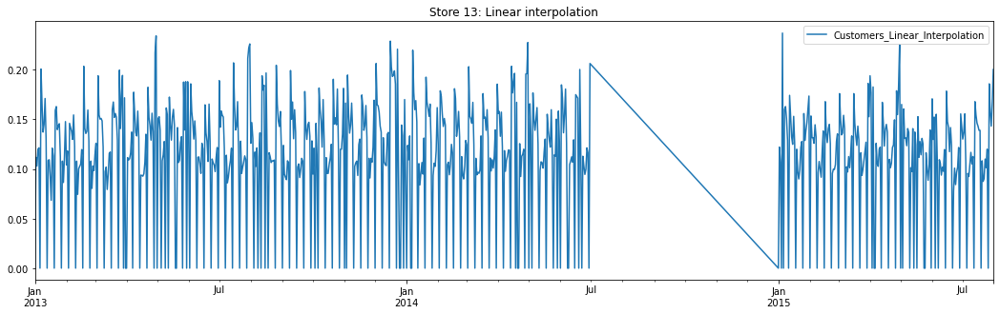

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000
Outliers above 99 percentile removed
929
Imputed missing values using linear interpolation
942


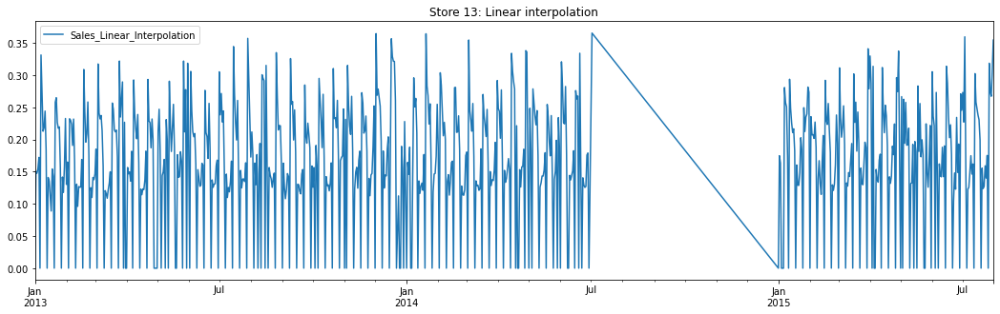

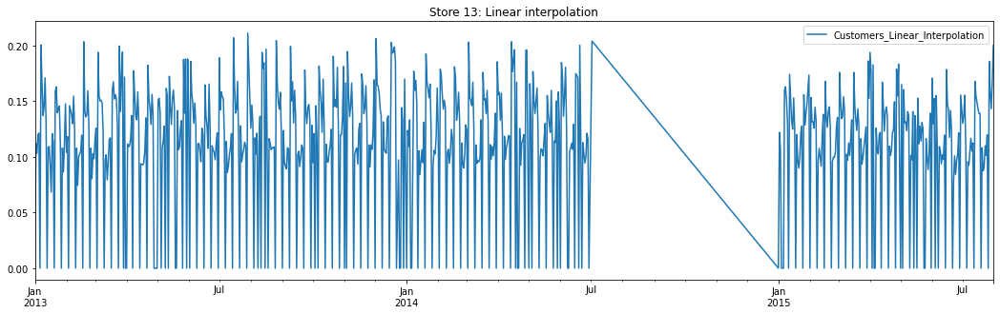

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000
942


In [109]:
store13 = data[data['Store'] == 13] # filter data for store num 13
store13.drop(['Store'], axis=1, inplace=True) # Drop store column

store13= impute_missing_values(store13, 13) # Impute missing values
store13 = remove_outliers(store13) # Remove outliers

print(len(store13))
store13= impute_missing_values(store13, 13) # again Impute missing values

store13.sort_index(inplace=True)
print(len(store13))

In [110]:
store13.head() # print first 5 lines of store13

,Sales,Customers,Promo,DayOfWeek,Open
2013-01-01,0.00000,0.00000,0.00000,2.00000,0.00000
2013-01-02,0.15019,0.11182,0.00000,3.00000,1.00000
2013-01-03,0.14766,0.10300,0.00000,4.00000,1.00000
2013-01-04,0.15465,0.11993,0.00000,5.00000,1.00000
2013-01-05,0.17221,0.12134,0.00000,6.00000,1.00000


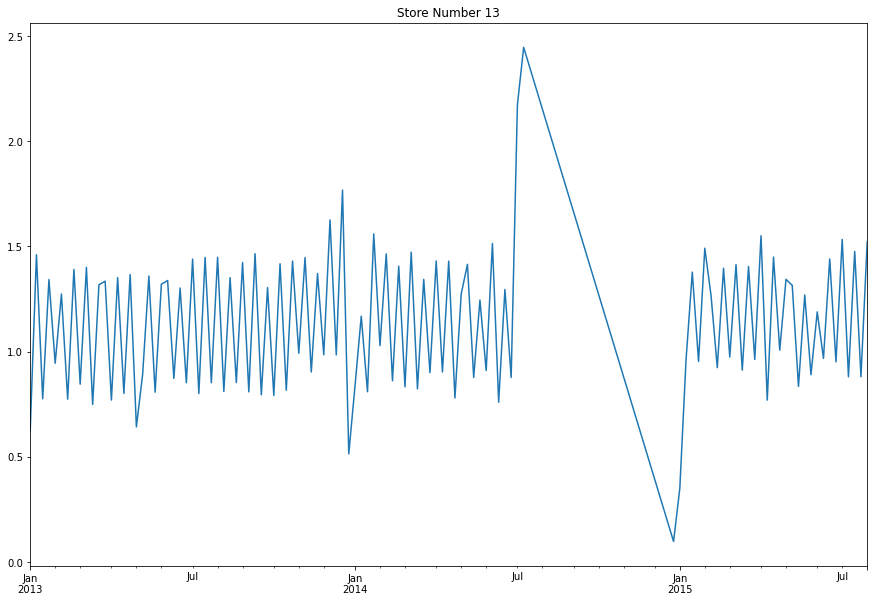

In [111]:
time_series_plot(store13['Sales'], '13') # plot time series

In [112]:
stationarity_test_adf(store13['Sales'], 13) # stationarity test

ADF Statistic: -3.034043
p-value: 0.031835
Critical Values:
	5%: -2.865
Store 13 is Stationary Time Series


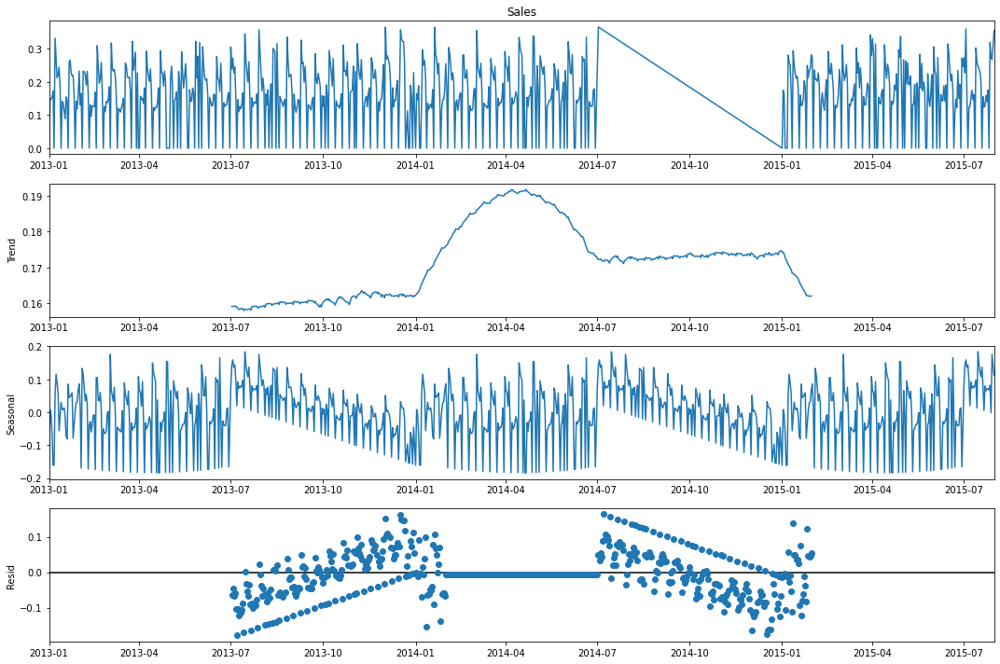

In [113]:
# seasonal decomposition to see trend, seasonal & residual component
seasonal_decomposition_plot(store13['Sales'])

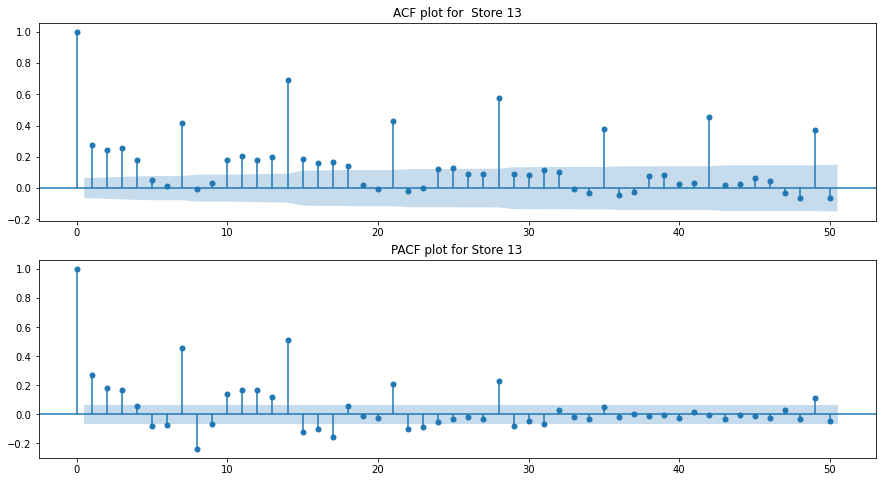

In [114]:
# acf & pacf plot to determine q & p values for model
acf_pacf_plot(store13['Sales'], ' Store '+str(13))

- ADF test shows that time series is stationary.
- Store 13 sales slowly increased over time.
- PACF plot shows significant high value at 7 & 14.
- ACF plot shows some trend and doesnt cut off.
- p=7 and q=0 are selected.

### ARIMAX Model

In [115]:
# Empty DataFrame to Store results obtained
results13 = pd.DataFrame(columns= ['Time Series Model','Store','Variable','MAPE','RMSE'])
results13

,Time Series Model,Store,Variable,MAPE,RMSE


             Sales  ArimaxForecastedSales
2015-06-20 0.17647                0.18000
2015-06-21 0.00000                0.00000
2015-06-22 0.10461                0.10000
2015-06-23 0.14794                0.14000
2015-06-24 0.12282                0.11000


 ------------ Test & Model forecast -----------------------


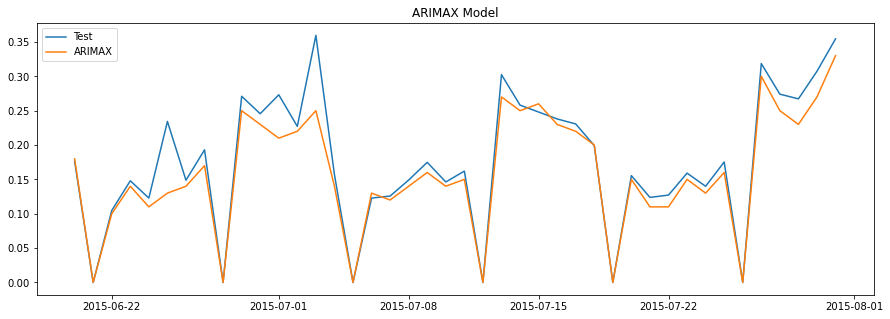

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,13,Sales,7.79000,0.03000


In [116]:
# build ARIMAX model
endog=['Sales'] # endogenuous variable
# instantiate ARMA model class
arimax13 = ARMA_Model(data=store13,store_number=13,endog=endog,exog=exo_uni_features, order=(7,0,0))
temp13 = arimax13.build_model_ARIMAX() 
temp13
results13 = pd.concat([results13, temp13]) # concat results with results13 dataframe
results13

### SARIMAX Model

C:\Users\shail\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


             Sales  SarimaxForecastedSales
2015-06-20 0.17647                 0.18000
2015-06-21 0.00000                 0.00000
2015-06-22 0.10461                 0.10000
2015-06-23 0.14794                 0.15000
2015-06-24 0.12282                 0.11000


 ------------ Test & Model forecast -----------------------


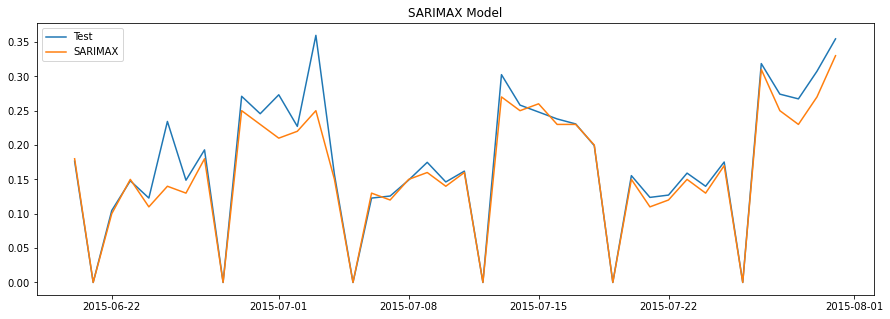

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,13,Sales,7.79000,0.03000
0,SARIMAX,13,Sales,6.70000,0.03000


In [117]:
# Instantiate ARMA Model class
sarimax13 = ARMA_Model(data=store13,store_number=13,endog=endog,order=(7,0,0),seasonal_order=(7,0,0,12),exog=exo_uni_features)
temp13 = sarimax13.build_model_SARIMAX()
results13 = pd.concat([results13, temp13]) # concat result
results13

In [118]:
# Checking for Cointegration between Sales and Customers
johansen_test(store13, ['Sales','Customers'])

   max_eig_stat  trace_stat
0      86.36576   117.15887
1      30.79311    30.79311 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 

The Rank is 2. There is no cointegration but the series is stationary. VAR/VARMAX models can be build.'
'


### VAR Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                             VAR(7)   Log Likelihood                4121.513
Date:                    Wed, 20 Jul 2022   AIC                          -8181.026
Time:                            21:10:22   BIC                          -8032.152
Sample:                        01-01-2013   HQIC                         -8124.155
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.44, 1.20   Jarque-Bera (JB):        438.58, 61.59
Prob(Q):                        0.51, 0.27   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.91, 0.86   Skew:                      -0.16, 0.05
Prob(H) (two-sided):            0.43, 0.18   Kurtosis:                   6.41, 4.28


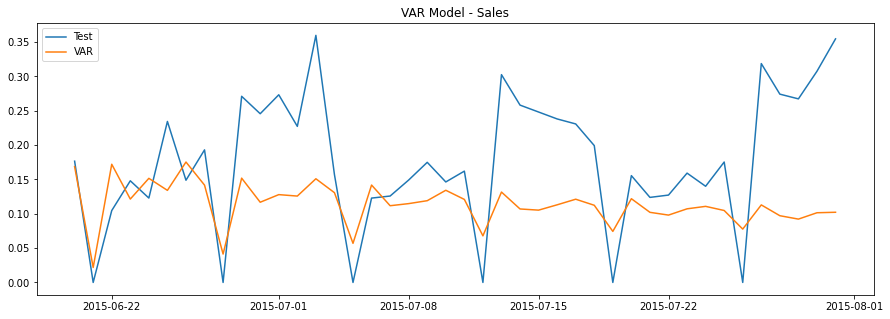

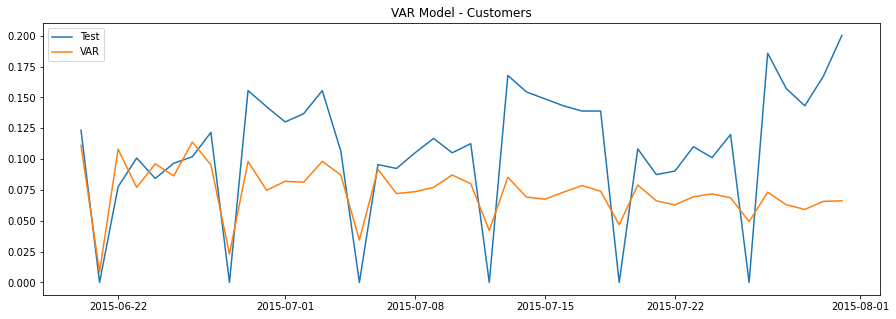

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,13,Sales,7.79000,0.03000
0,SARIMAX,13,Sales,6.70000,0.03000
0,VAR,13,Sales,37.60000,0.11000
0,VAR,13,Customers,34.97000,0.06000


In [119]:
# endogenuous vairable for VAR models
endog_multi_variate = ['Sales','Customers']
# Instantiate VAR model class
var13 = VAR_Model(data=store13,store_number=13,endog=endog_multi_variate,order=(7,0))
temp13 = var13.build_model_VAR() # model building
results13 = pd.concat([results13,temp13]) # concat
results13

### VARMAX Model

C:\Users\shail\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                4648.874
Date:                    Wed, 20 Jul 2022   AIC                          -9223.749
Time:                            21:14:29   BIC                          -9046.060
Sample:                        01-01-2013   HQIC                         -9155.871
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            37.16, 0.74   Jarque-Bera (JB):        56.60, 540.18
Prob(Q):                        0.00, 0.39   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.77, 1.16   Skew:                     -0.06, -0.55
Prob(H) (two-sided):            0.03, 0.19   Kurtosis:                   4.22, 6.64


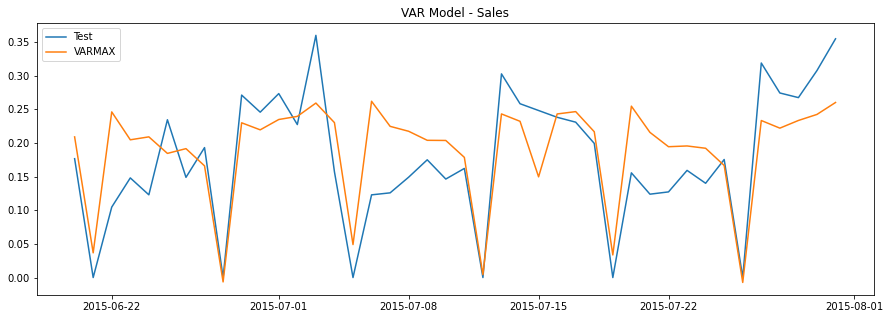

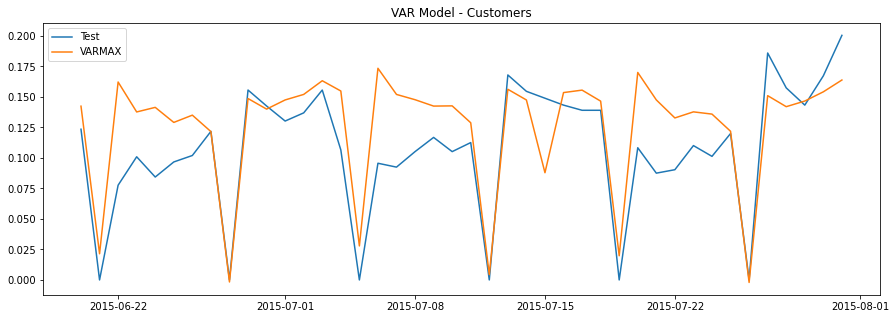

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,13,Sales,7.79000,0.03000
0,SARIMAX,13,Sales,6.70000,0.03000
0,VAR,13,Sales,37.60000,0.11000
0,VAR,13,Customers,34.97000,0.06000
0,VARMAX,13,Sales,30.37000,0.06000
0,VARMAX,13,Customers,25.53000,0.03000


In [120]:
# Instantiate VAR Model class
varmax13 = VAR_Model(data=store13,store_number=13,endog=endog_multi_variate,order=(7,0), exog= exo_mul_features)
temp13 = varmax13.build_model_VARMAX() # model building
temp13
results13 = pd.concat([results13,temp13]) # concat result of varmax to result13 dataframe
results13

### Best model
For Store no. 13 is SARIMAX  with MAPE-6.70 , RMSE-0.03

## Store 25

### Pre-Processing of Data

Outliers above 99 percentile removed
Imputed missing values using linear interpolation
942


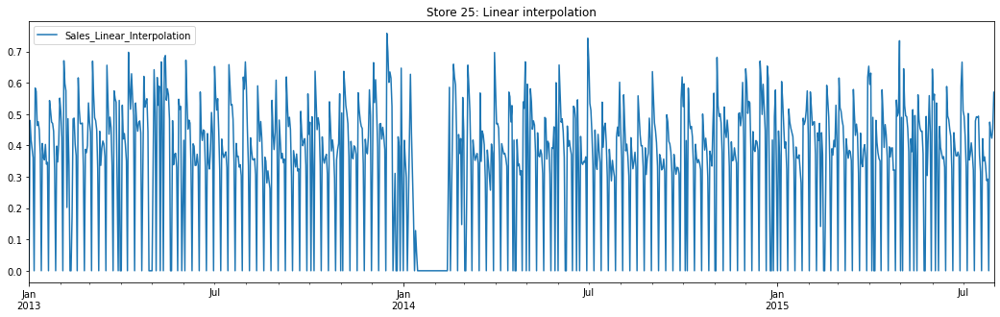

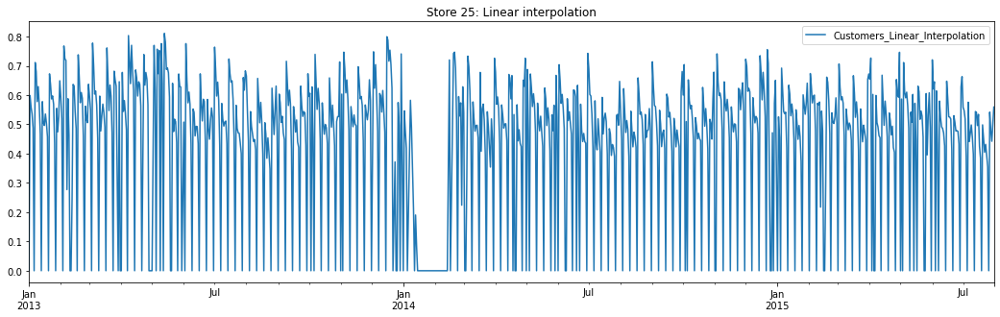

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000


In [121]:
store25 = data[data['Store'] == 25] # filter data for store num 25
store25.drop(['Store'], axis=1, inplace=True) # Drop store column
store25 = remove_outliers(store25) # Remove outliers
store25= impute_missing_values(store25, 25) # Impute missing values
store25.sort_index(inplace=True)

In [122]:
store25.head() # print first 5 lines of store25

,Sales,Customers,Promo,DayOfWeek,Open
2013-01-01,0.00000,0.00000,0.00000,2.00000,0.00000
2013-01-02,0.48003,0.59894,0.00000,3.00000,1.00000
2013-01-03,0.41833,0.55979,0.00000,4.00000,1.00000
2013-01-04,0.39101,0.53616,0.00000,5.00000,1.00000
2013-01-05,0.36118,0.48713,0.00000,6.00000,1.00000


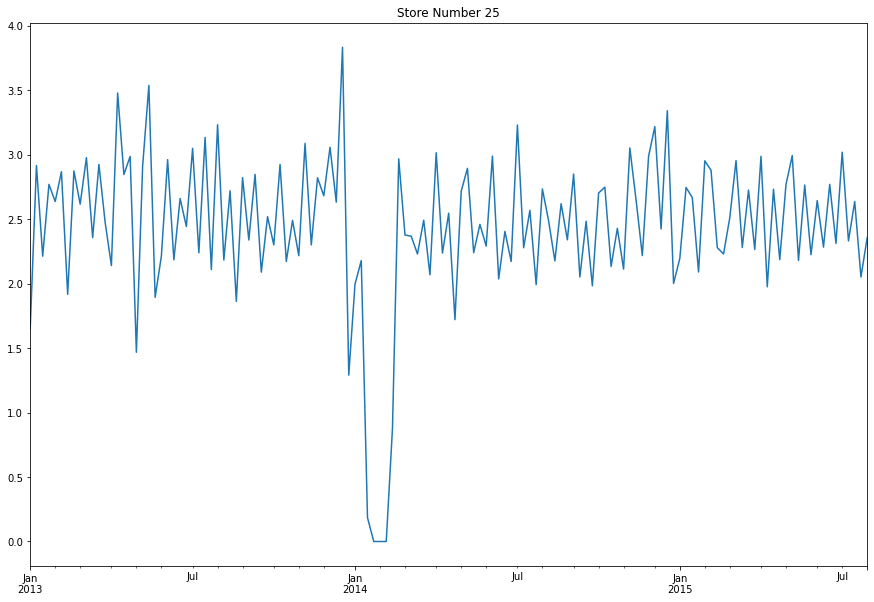

In [123]:
time_series_plot(store25['Sales'], '25') # plot time series

In [124]:
stationarity_test_adf(store25['Sales'], 25) # stationarity test

ADF Statistic: -4.153286
p-value: 0.000790
Critical Values:
	5%: -2.865
Store 25 is Stationary Time Series


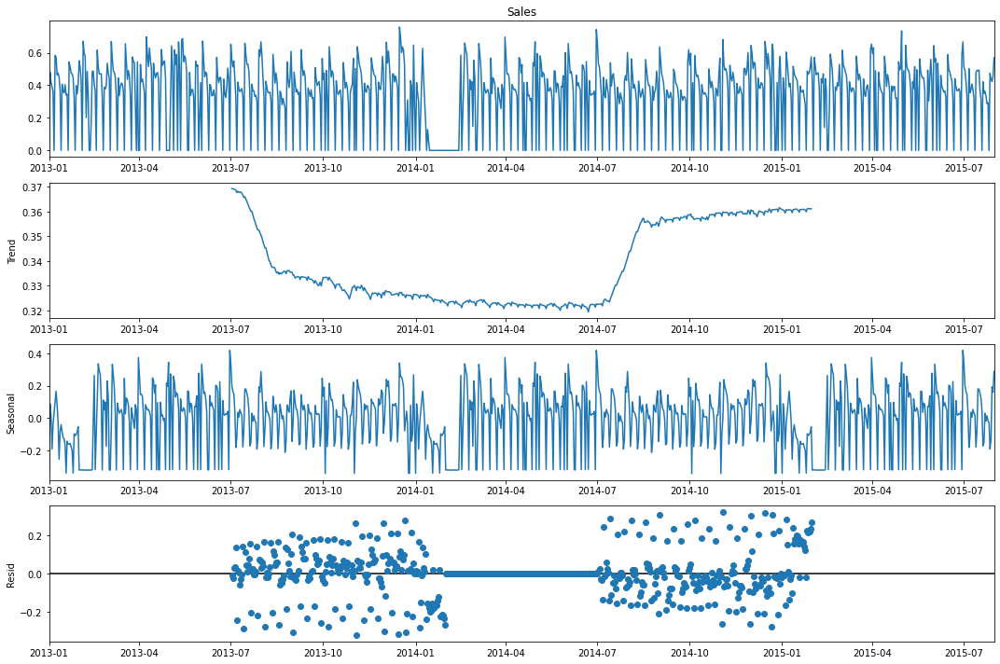

In [125]:
# seasonal decomposition to see trend, seasonal & residual component
seasonal_decomposition_plot(store25['Sales'])

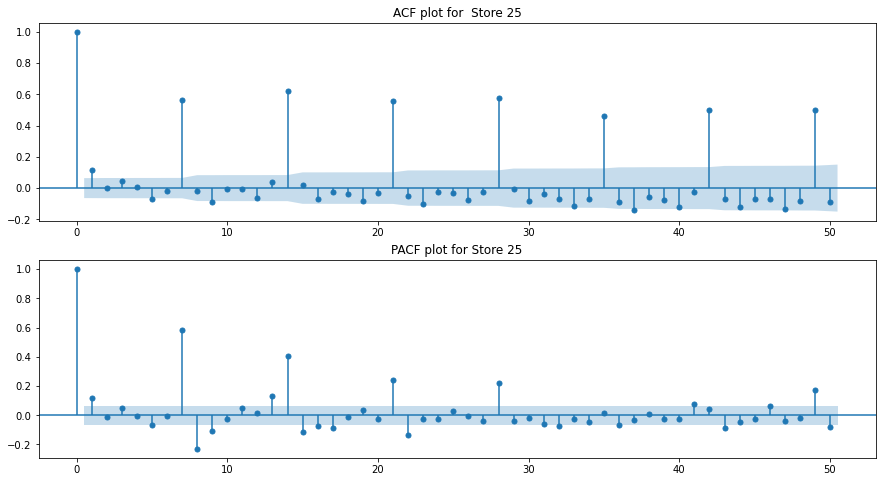

In [126]:
# acf & pacf plot to determine q & p values for model
acf_pacf_plot(store25['Sales'], ' Store '+str(25))

- Store 25 has some missing for jan,feb 2014.
- ADF test shows that time series is stationary.
- Store 25 sales decreased slowly then increased after jul 2014.
- PACF plot shows significant high value at 7.
- ACF plot shows some trend and doesnt cut off.
- p=7 and q=0 are selected.

### ARIMAX Model

In [127]:
# Empty DataFrame to Store results obtained
results25 = pd.DataFrame(columns= ['Time Series Model','Store','Variable','MAPE','RMSE'])
results25

,Time Series Model,Store,Variable,MAPE,RMSE


             Sales  ArimaxForecastedSales
2015-06-20 0.32421                0.31000
2015-06-21 0.00000               -0.00000
2015-06-22 0.44096                0.41000
2015-06-23 0.39338                0.39000
2015-06-24 0.36725                0.37000


 ------------ Test & Model forecast -----------------------


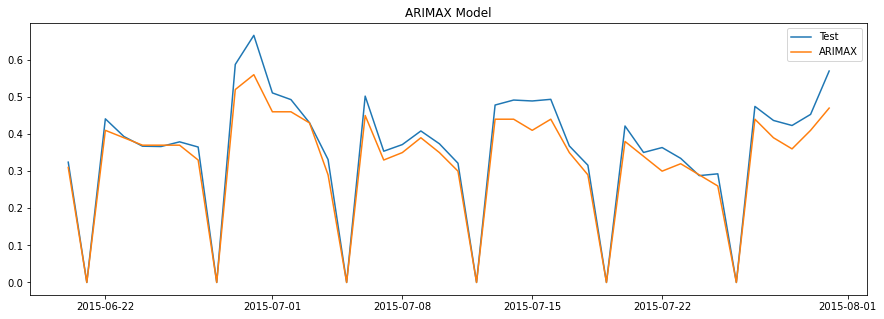

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,25,Sales,6.86000,0.04000


In [128]:
# build ARIMAX model
endog=['Sales'] # endogenuous variable
# instantiate ARMA model class
arimax25 = ARMA_Model(data=store25,store_number=25,endog=endog,exog=exo_uni_features, order=(7,0,0))
temp25 = arimax25.build_model_ARIMAX() 
temp25
results25 = pd.concat([results25, temp25]) # concat results with results25 dataframe
results25

### SARIMAX Model

C:\Users\shail\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


             Sales  SarimaxForecastedSales
2015-06-20 0.32421                 0.31000
2015-06-21 0.00000                 0.01000
2015-06-22 0.44096                 0.42000
2015-06-23 0.39338                 0.40000
2015-06-24 0.36725                 0.38000


 ------------ Test & Model forecast -----------------------


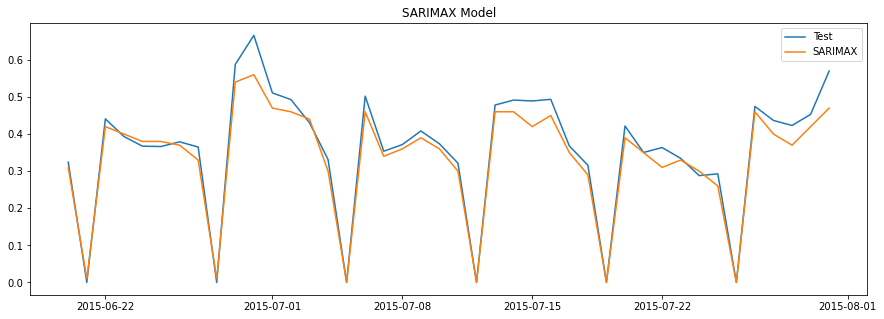

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,25,Sales,6.86000,0.04000
0,SARIMAX,25,Sales,5.96000,0.04000


In [129]:
# Instantiate ARMA Model class
sarimax25 = ARMA_Model(data=store25,store_number=25,endog=endog,order=(7,0,0),seasonal_order=(7,0,0,12),exog=exo_uni_features)
temp25 = sarimax25.build_model_SARIMAX()
results25 = pd.concat([results25, temp25]) # concat result
results25

In [130]:
# Checking for Cointegration between Sales and Customers
johansen_test(store25, ['Sales','Customers'])

   max_eig_stat  trace_stat
0     146.81746   187.13634
1      40.31888    40.31888 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 

The Rank is 2. There is no cointegration but the series is stationary. VAR/VARMAX models can be build.'
'


### VAR Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                             VAR(7)   Log Likelihood                2386.696
Date:                    Wed, 20 Jul 2022   AIC                          -4711.392
Time:                            21:20:24   BIC                          -4562.518
Sample:                        01-01-2013   HQIC                         -4654.521
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             2.65, 0.05   Jarque-Bera (JB):       488.07, 220.10
Prob(Q):                        0.10, 0.83   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.89, 1.19   Skew:                     -0.14, -0.51
Prob(H) (two-sided):            0.34, 0.13   Kurtosis:                   6.60, 5.20


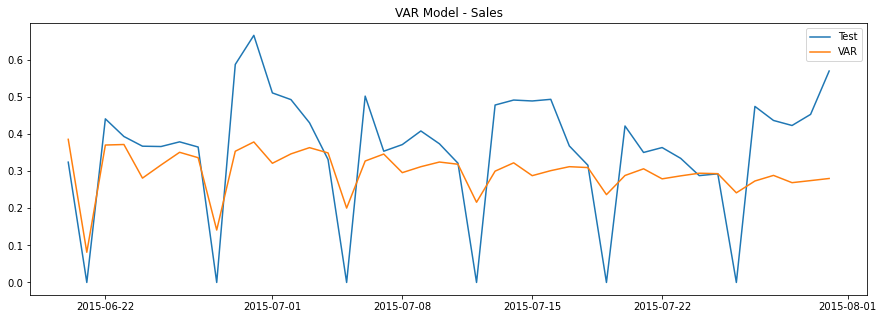

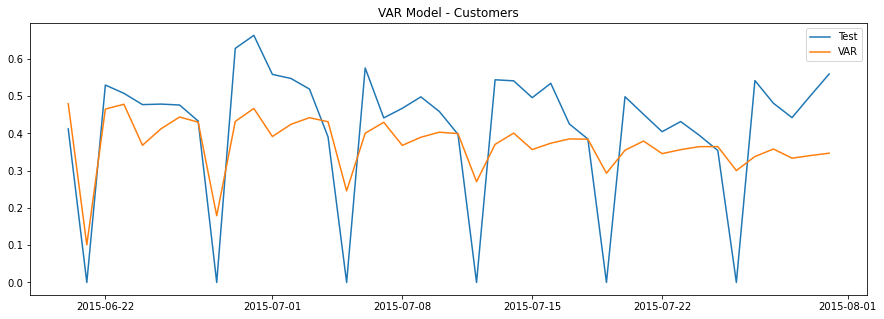

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,25,Sales,6.86000,0.04000
0,SARIMAX,25,Sales,5.96000,0.04000
0,VAR,25,Sales,26.82000,0.14000
0,VAR,25,Customers,24.07000,0.14000


In [131]:
# endogenuous vairable for VAR models
endog_multi_variate = ['Sales','Customers']
# Instantiate VAR model class
var25 = VAR_Model(data=store25,store_number=25,endog=endog_multi_variate,order=(7,0))
temp25 = var25.build_model_VAR() # model building
results25 = pd.concat([results25,temp25]) # concat
results25

### VARMAX Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                3187.689
Date:                    Wed, 20 Jul 2022   AIC                          -6301.378
Time:                            21:23:00   BIC                          -6123.689
Sample:                        01-01-2013   HQIC                         -6233.499
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):           41.94, 10.75   Jarque-Bera (JB):       897.39, 401.62
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.72, 0.92   Skew:                     -0.01, -0.87
Prob(H) (two-sided):            0.01, 0.48   Kurtosis:                   7.89, 5.78


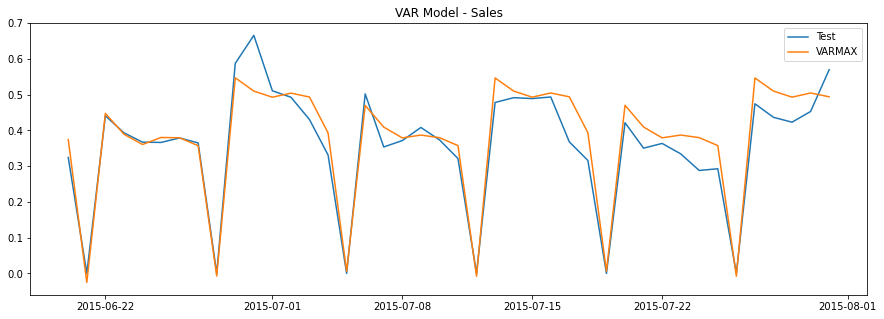

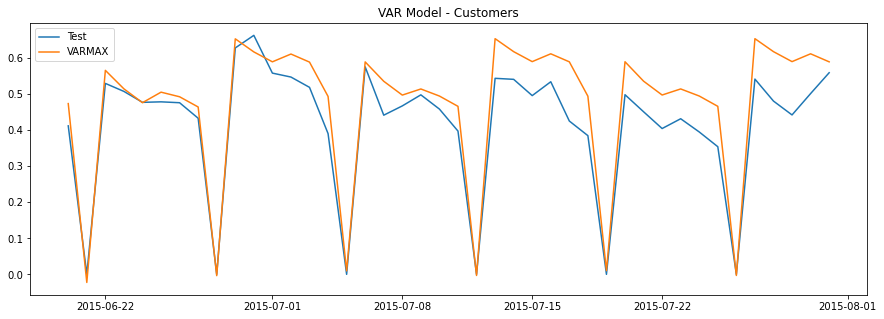

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,25,Sales,6.86000,0.04000
0,SARIMAX,25,Sales,5.96000,0.04000
0,VAR,25,Sales,26.82000,0.14000
0,VAR,25,Customers,24.07000,0.14000
0,VARMAX,25,Sales,9.76000,0.05000
0,VARMAX,25,Customers,13.34000,0.08000


In [132]:
# Instantiate VAR Model class
varmax25 = VAR_Model(data=store25,store_number=25,endog=endog_multi_variate,order=(7,0), exog= exo_mul_features)
temp25 = varmax25.build_model_VARMAX() # model building
temp25
results25 = pd.concat([results25,temp25]) # concat result of varmax to results25 dataframe
results25

### Best model
For Store no. 25 is SARIMAX with MAPE-5.96 , RMSE-0.04

## Store 29

### Pre-Processing of Data

Outliers above 99 percentile removed
Imputed missing values using linear interpolation
942


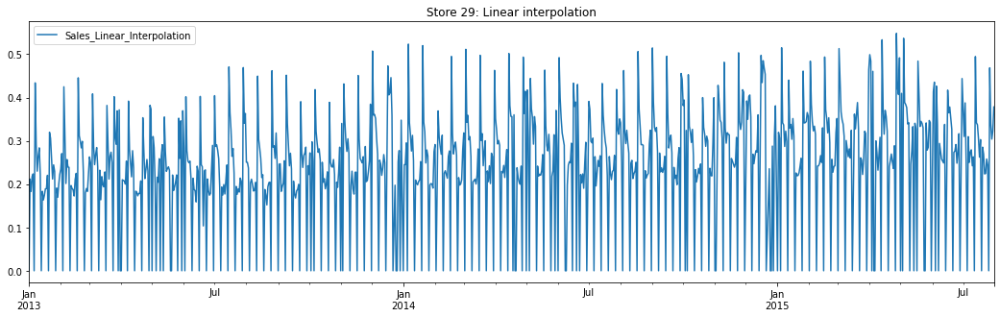

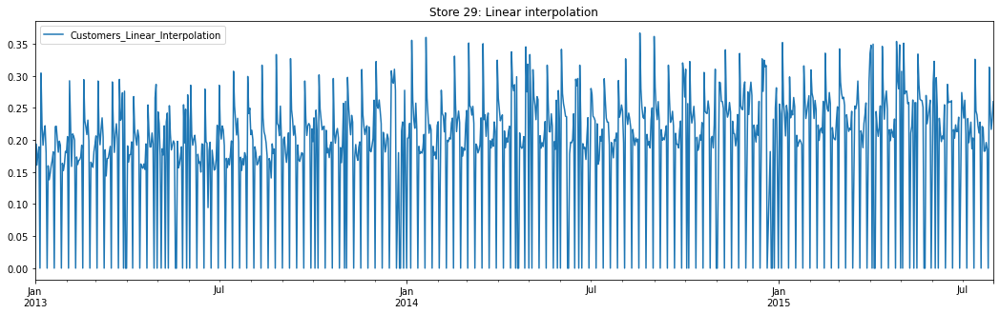

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000
942


In [133]:
store29 = data[data['Store'] == 29] # filter data for store num 29
store29.drop(['Store'], axis=1, inplace=True) # Drop store column

store29 = remove_outliers(store29) # Remove outliers
store29= impute_missing_values(store29, 29) # Impute missing values

store29.sort_index(inplace=True)
print(len(store29))

In [134]:
store29.head() # print first 5 lines of store29

,Sales,Customers,Promo,DayOfWeek,Open
2013-01-01,0.00000,0.00000,0.00000,2.00000,0.00000
2013-01-02,0.21176,0.19400,0.00000,3.00000,1.00000
2013-01-03,0.18302,0.16085,0.00000,4.00000,1.00000
2013-01-04,0.21747,0.17813,0.00000,5.00000,1.00000
2013-01-05,0.22362,0.18942,0.00000,6.00000,1.00000


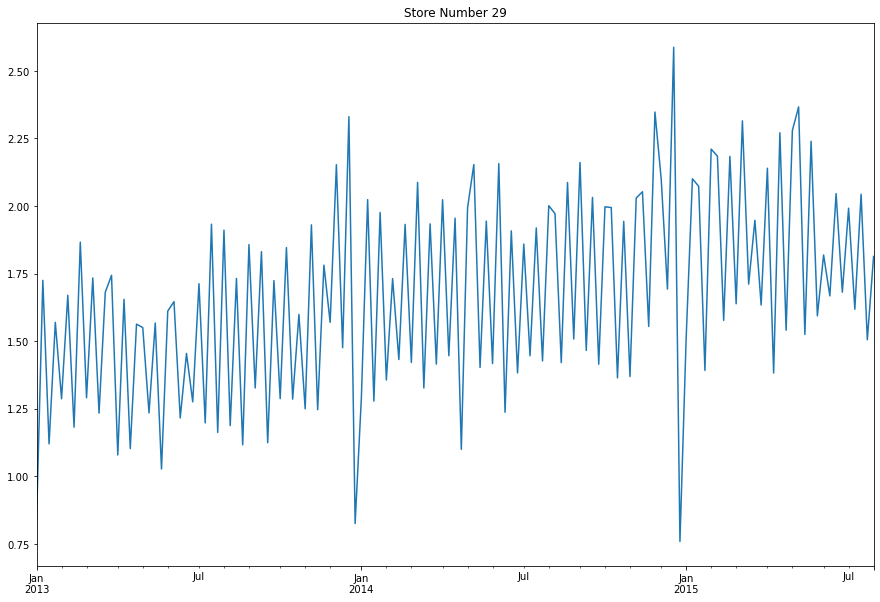

In [135]:
time_series_plot(store29['Sales'], '29') # plot time series

In [136]:
stationarity_test_adf(store29['Sales'], 29) # stationarity test

ADF Statistic: -3.707216
p-value: 0.004013
Critical Values:
	5%: -2.865
Store 29 is Stationary Time Series


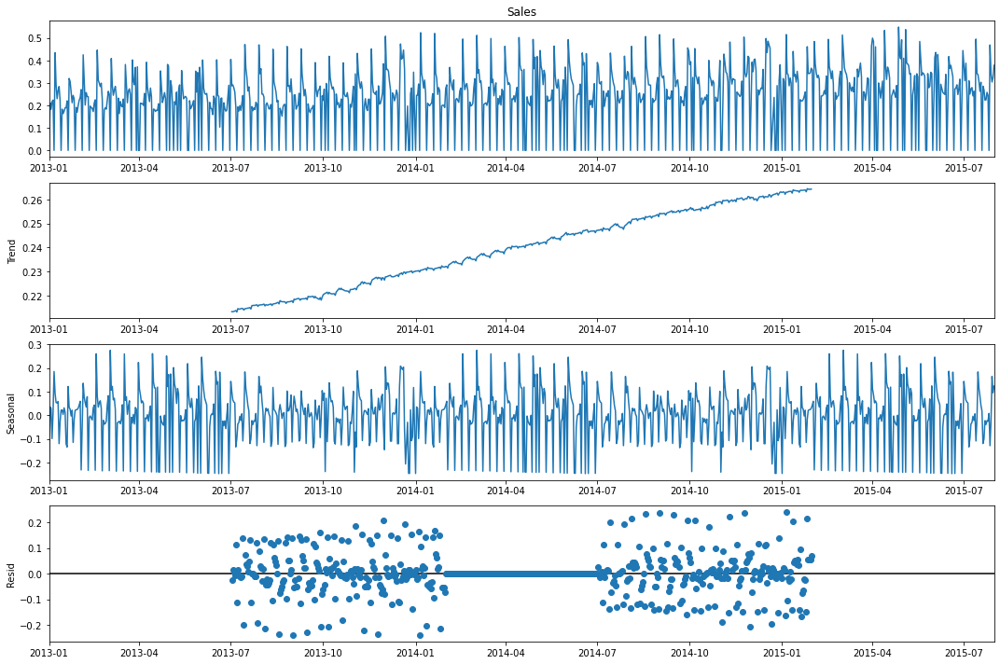

In [137]:
# seasonal decomposition to see trend, seasonal & residual component
seasonal_decomposition_plot(store29['Sales'])

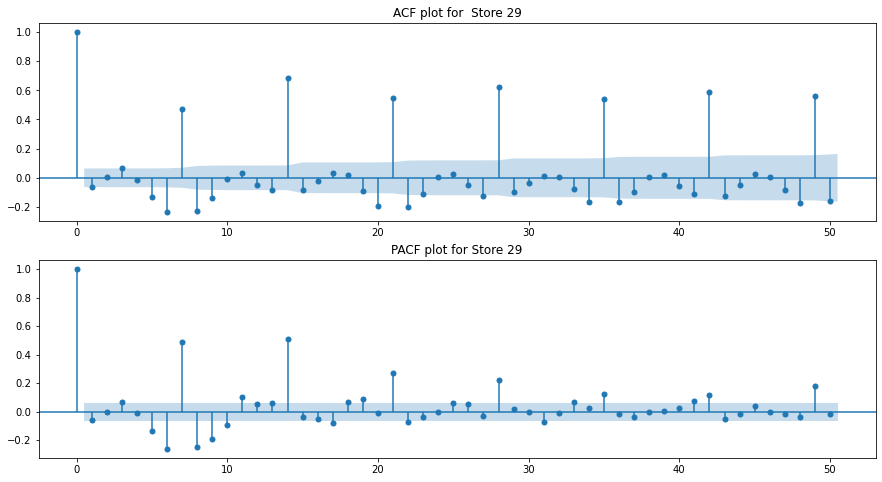

In [138]:
# acf & pacf plot to determine q & p values for model
acf_pacf_plot(store29['Sales'], ' Store '+str(29))

- Time series looks stationary.
- ADF test shows that time series is stationary.
- Store 29 sales increased over time with upward trend.
- PACF plot shows significant high value at 7 & 14.
- ACF plot shows some trend and doesnt cut off.
- p=7 and q=0 are selected.

### ARIMAX Model

In [139]:
# Empty DataFrame to Store results obtained
results29 = pd.DataFrame(columns= ['Time Series Model','Store','Variable','MAPE','RMSE'])
results29

,Time Series Model,Store,Variable,MAPE,RMSE


             Sales  ArimaxForecastedSales
2015-06-20 0.32622                0.34000
2015-06-21 0.00000               -0.00000
2015-06-22 0.27321                0.26000
2015-06-23 0.27630                0.25000
2015-06-24 0.29142                0.28000


 ------------ Test & Model forecast -----------------------


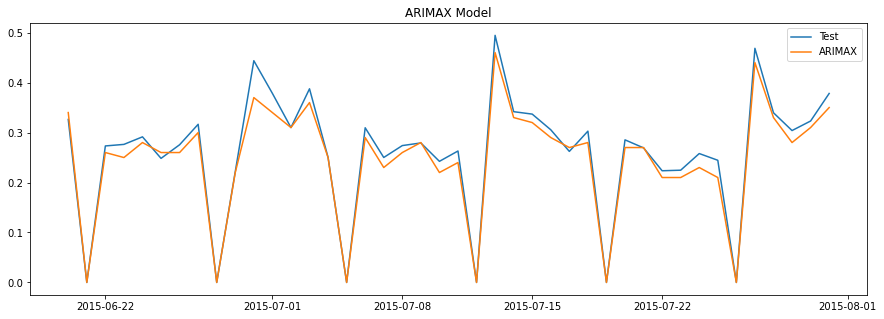

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,29,Sales,5.08000,0.02000


In [140]:
# build ARIMAX model
endog=['Sales'] # endogenuous variable
# instantiate ARMA model class
arimax29 = ARMA_Model(data=store29,store_number=29,endog=endog,exog=exo_uni_features, order=(7,0,0))
temp29 = arimax29.build_model_ARIMAX() 
temp29
results29 = pd.concat([results29, temp29]) # concat results with results29 dataframe
results29

### SARIMAX Model

C:\Users\shail\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


             Sales  SarimaxForecastedSales
2015-06-20 0.32622                 0.34000
2015-06-21 0.00000                -0.00000
2015-06-22 0.27321                 0.27000
2015-06-23 0.27630                 0.24000
2015-06-24 0.29142                 0.28000


 ------------ Test & Model forecast -----------------------


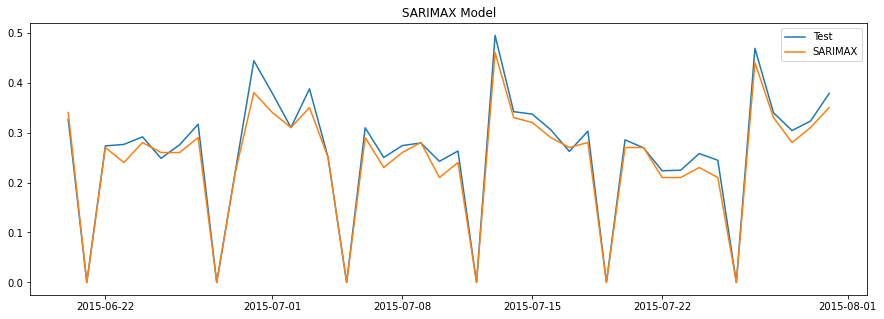

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,29,Sales,5.08000,0.02000
0,SARIMAX,29,Sales,5.26000,0.02000


In [141]:
# Instantiate ARMA Model class
sarimax29 = ARMA_Model(data=store29,store_number=29,endog=endog,order=(7,0,0),seasonal_order=(7,0,0,12),exog=exo_uni_features)
temp29 = sarimax29.build_model_SARIMAX()
results29 = pd.concat([results29, temp29]) # concat result
results29

In [142]:
# Checking for Cointegration between Sales and Customers
johansen_test(store29, ['Sales','Customers'])

   max_eig_stat  trace_stat
0     160.02190   193.53474
1      33.51284    33.51284 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 

The Rank is 2. There is no cointegration but the series is stationary. VAR/VARMAX models can be build.'
'


### VAR Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                             VAR(7)   Log Likelihood                3487.502
Date:                    Wed, 20 Jul 2022   AIC                          -6913.005
Time:                            21:28:37   BIC                          -6764.130
Sample:                        01-01-2013   HQIC                         -6856.134
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.77, 1.73   Jarque-Bera (JB):        474.35, 60.10
Prob(Q):                        0.18, 0.19   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.79, 1.39   Skew:                     -0.20, -0.45
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                   6.53, 3.88


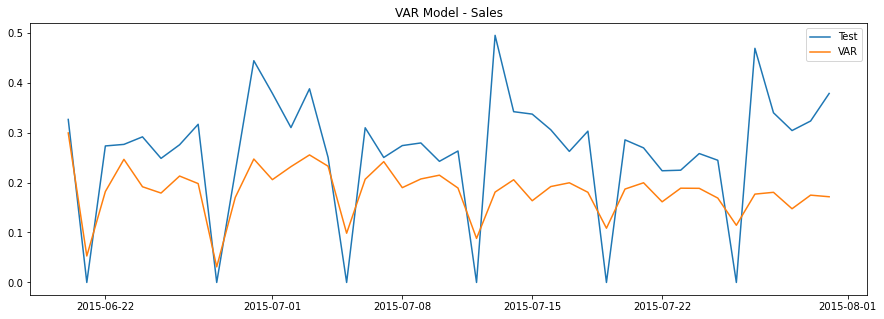

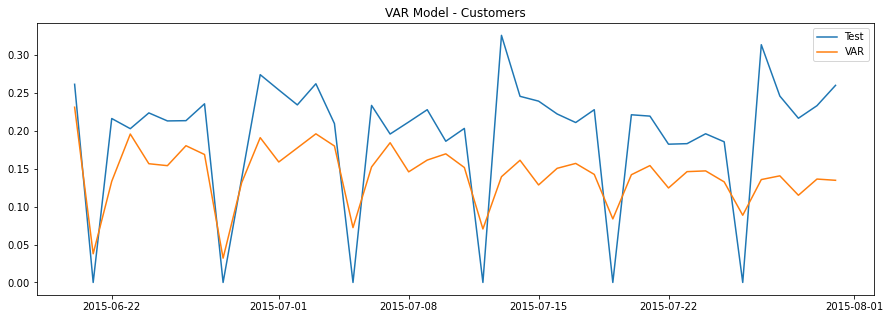

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,29,Sales,5.08000,0.02000
0,SARIMAX,29,Sales,5.26000,0.02000
0,VAR,29,Sales,32.29000,0.12000
0,VAR,29,Customers,30.11000,0.08000


In [143]:
# endogenuous vairable for VAR models
endog_multi_variate = ['Sales','Customers']
# Instantiate VAR model class
var29 = VAR_Model(data=store29,store_number=29,endog=endog_multi_variate,order=(7,0))
temp29 = var29.build_model_VAR() # model building
results29 = pd.concat([results29,temp29]) # concat
results29

### VARMAX Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                4267.541
Date:                    Wed, 20 Jul 2022   AIC                          -8461.082
Time:                            21:30:02   BIC                          -8283.393
Sample:                        01-01-2013   HQIC                         -8393.203
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            39.61, 0.78   Jarque-Bera (JB):         3.78, 399.44
Prob(Q):                        0.00, 0.38   Prob(JB):                   0.15, 0.00
Heteroskedasticity (H):         1.31, 1.08   Skew:                     -0.02, -0.36
Prob(H) (two-sided):            0.02, 0.53   Kurtosis:                   3.31, 6.18


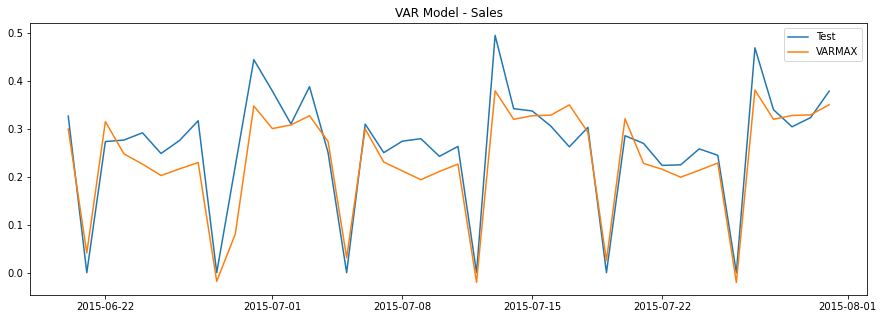

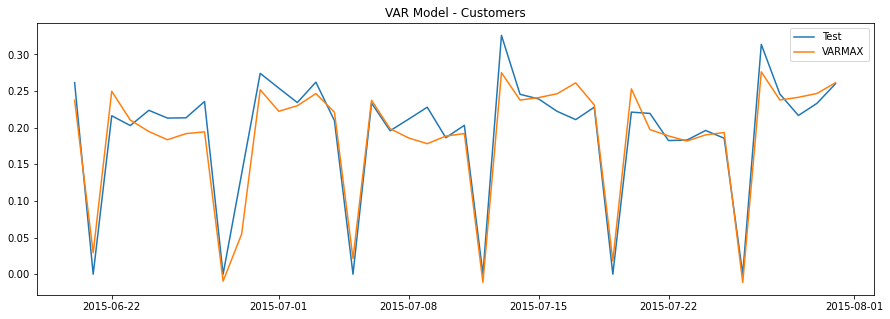

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,29,Sales,5.08000,0.02000
0,SARIMAX,29,Sales,5.26000,0.02000
0,VAR,29,Sales,32.29000,0.12000
0,VAR,29,Customers,30.11000,0.08000
0,VARMAX,29,Sales,14.09000,0.05000
0,VARMAX,29,Customers,9.45000,0.03000


In [144]:
# Instantiate VAR Model class
varmax29 = VAR_Model(data=store29,store_number=29,endog=endog_multi_variate,order=(7,0), exog= exo_mul_features)
temp29 = varmax29.build_model_VARMAX() # model building
temp29
results29 = pd.concat([results29,temp29]) # concat result of varmax to result29 dataframe
results29

### Best model
For Store no. 29 is ARIMAX  with MAPE-5.08 , RMSE-0.02

## Store 31

### Pre-Processing of Data

Outliers above 99 percentile removed
Imputed missing values using linear interpolation
942


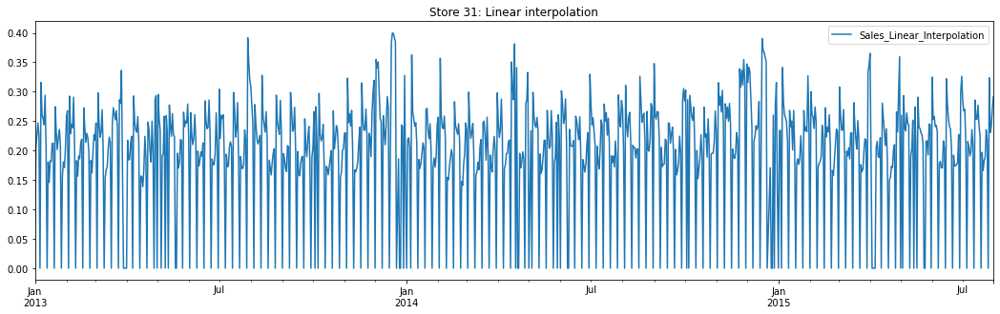

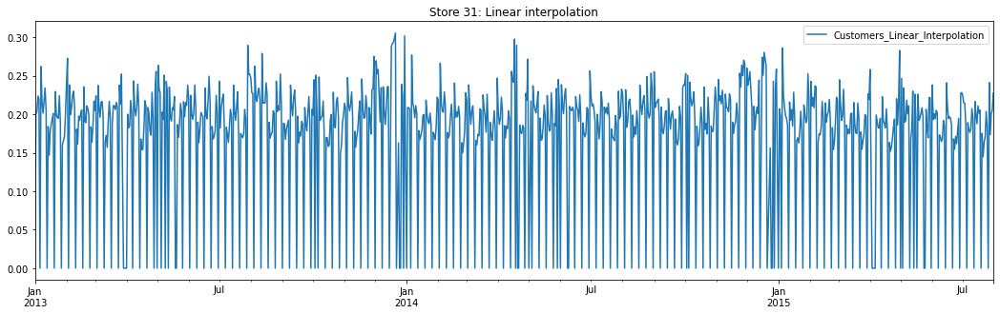

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000
942


In [145]:
store31 = data[data['Store'] == 31] # filter data for store num 31
store31.drop(['Store'], axis=1, inplace=True) # Drop store column

store31 = remove_outliers(store31) # Remove outliers
store31= impute_missing_values(store31, 31) # Impute missing values

store31.sort_index(inplace=True)
print(len(store31))

In [146]:
store31.head() # print first 5 lines of store31

,Sales,Customers,Promo,DayOfWeek,Open
2013-01-01,0.00000,0.00000,0.00000,2.00000,0.00000
2013-01-02,0.20585,0.20000,0.00000,3.00000,1.00000
2013-01-03,0.22599,0.20388,0.00000,4.00000,1.00000
2013-01-04,0.24676,0.22328,0.00000,5.00000,1.00000
2013-01-05,0.22534,0.22011,0.00000,6.00000,1.00000


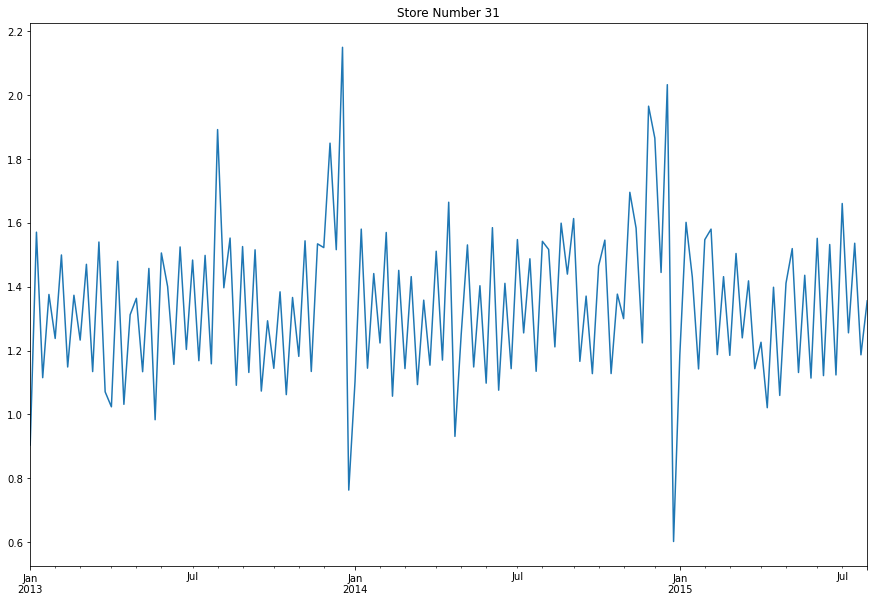

In [147]:
time_series_plot(store31['Sales'], '31') # plot time series

In [148]:
stationarity_test_adf(store31['Sales'], 31) # stationarity test

ADF Statistic: -5.803575
p-value: 0.000000
Critical Values:
	5%: -2.865
Store 31 is Stationary Time Series


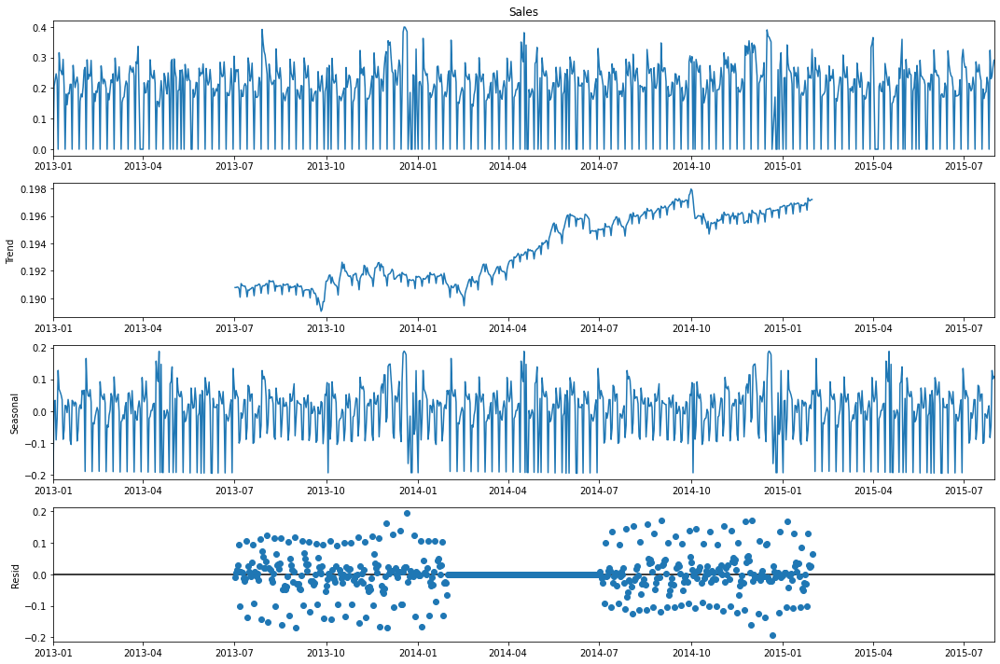

In [149]:
# seasonal decomposition to see trend, seasonal & residual component
seasonal_decomposition_plot(store31['Sales'])

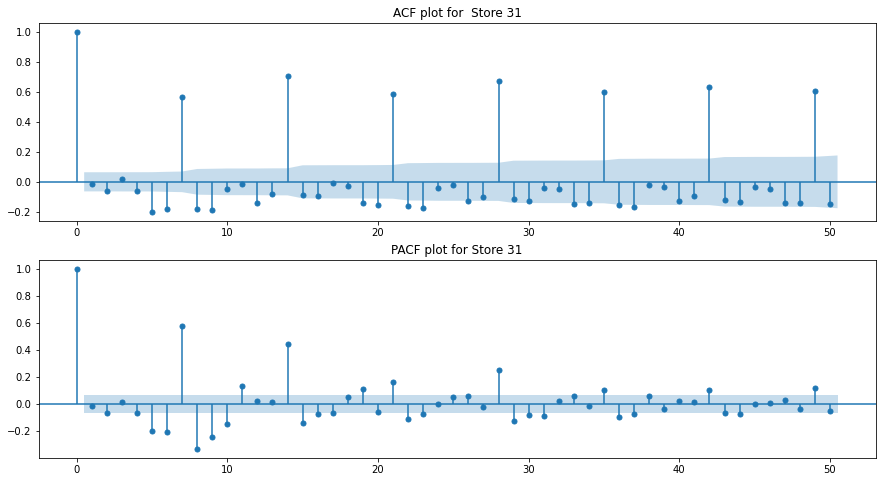

In [150]:
# acf & pacf plot to determine q & p values for model
acf_pacf_plot(store31['Sales'], ' Store '+str(31))

- time series looks stationary.
- ADF test confirms that time series is stationary.
- Store 31 sales shows upward trend with spikes. Which indicates seasonal effects.
- PACF plot shows significant high value at 7.
- ACF plot shows some trend and doesnt cut off.
- p=7 and q=0 are selected.

### ARIMAX Model

In [151]:
# Empty DataFrame to Store results obtained
results31 = pd.DataFrame(columns= ['Time Series Model','Store','Variable','MAPE','RMSE'])
results31

,Time Series Model,Store,Variable,MAPE,RMSE


             Sales  ArimaxForecastedSales
2015-06-20 0.20223                0.20000
2015-06-21 0.00000                0.00000
2015-06-22 0.19207                0.18000
2015-06-23 0.17390                0.16000
2015-06-24 0.17434                0.18000


 ------------ Test & Model forecast -----------------------


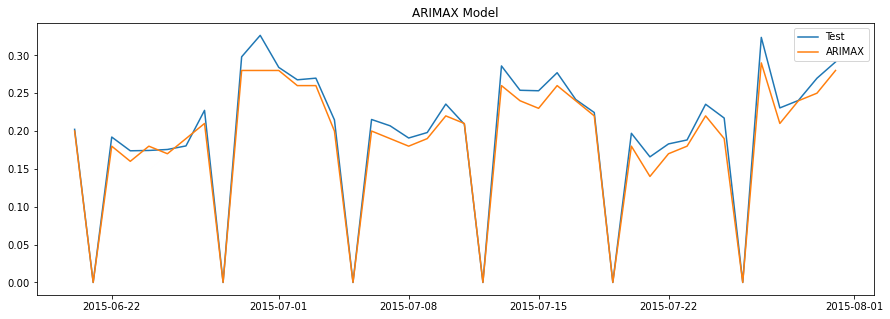

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,31,Sales,5.23000,0.02000


In [152]:
# build ARIMAX model
endog=['Sales'] # endogenuous variable
# instantiate ARMA model class
arimax31 = ARMA_Model(data=store31,store_number=31,endog=endog,exog=exo_uni_features, order=(7,0,0))
temp31 = arimax31.build_model_ARIMAX() 
temp31
results31 = pd.concat([results31, temp31]) # concat results with results31 dataframe
results31

### SARIMAX Model

             Sales  SarimaxForecastedSales
2015-06-20 0.20223                 0.20000
2015-06-21 0.00000                 0.00000
2015-06-22 0.19207                 0.18000
2015-06-23 0.17390                 0.16000
2015-06-24 0.17434                 0.18000


 ------------ Test & Model forecast -----------------------


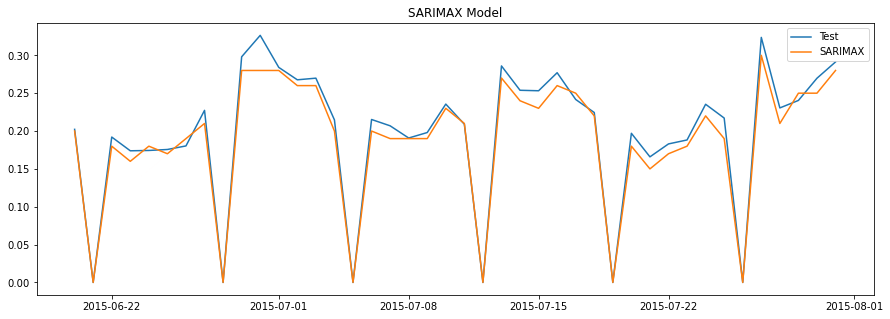

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,31,Sales,5.23000,0.02000
0,SARIMAX,31,Sales,4.86000,0.01000


In [153]:
# Instantiate ARMA Model class
sarimax31 = ARMA_Model(data=store31,store_number=31,endog=endog,order=(7,0,0),seasonal_order=(7,0,0,12),exog=exo_uni_features)
temp31 = sarimax31.build_model_SARIMAX()
results31 = pd.concat([results31, temp31]) # concat result
results31

In [154]:
# Checking for Cointegration between Sales and Customers
johansen_test(store31, ['Sales','Customers'])

   max_eig_stat  trace_stat
0     132.72886   165.31745
1      32.58859    32.58859 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 

The Rank is 2. There is no cointegration but the series is stationary. VAR/VARMAX models can be build.'
'


### VAR Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                             VAR(7)   Log Likelihood                3866.395
Date:                    Wed, 20 Jul 2022   AIC                          -7670.791
Time:                            21:35:47   BIC                          -7521.916
Sample:                        01-01-2013   HQIC                         -7613.920
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.47, 2.66   Jarque-Bera (JB):        754.97, 45.43
Prob(Q):                        0.50, 0.10   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.18, 0.95   Skew:                     -0.19, -0.39
Prob(H) (two-sided):            0.15, 0.68   Kurtosis:                   7.47, 3.77


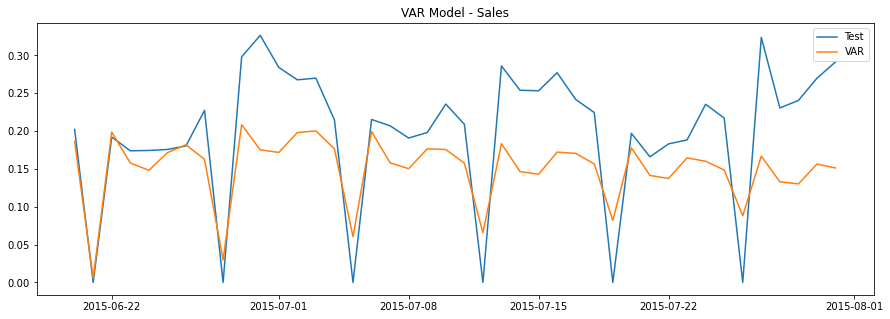

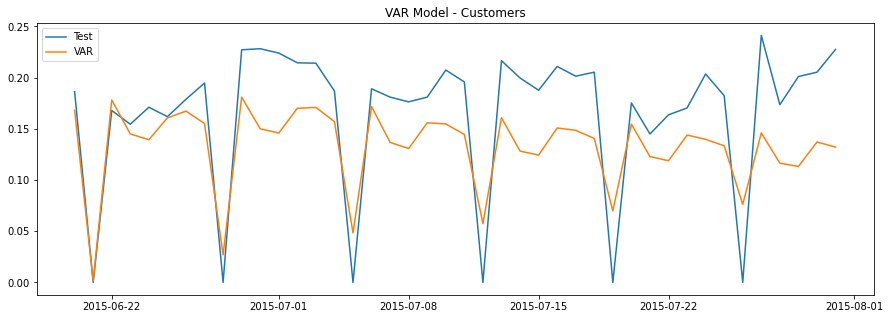

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,31,Sales,5.23000,0.02000
0,SARIMAX,31,Sales,4.86000,0.01000
0,VAR,31,Sales,26.32000,0.08000
0,VAR,31,Customers,24.04000,0.05000


In [155]:
# endogenuous vairable for VAR models
endog_multi_variate = ['Sales','Customers']
# Instantiate VAR model class
var31 = VAR_Model(data=store31,store_number=31,endog=endog_multi_variate,order=(7,0))
temp31 = var31.build_model_VAR() # model building
results31 = pd.concat([results31,temp31]) # concat
results31

### VARMAX Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                4648.826
Date:                    Wed, 20 Jul 2022   AIC                          -9223.653
Time:                            21:38:16   BIC                          -9045.964
Sample:                        01-01-2013   HQIC                         -9155.775
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            42.76, 0.33   Jarque-Bera (JB):       746.35, 596.05
Prob(Q):                        0.00, 0.57   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.49, 0.82   Skew:                      0.51, -0.19
Prob(H) (two-sided):            0.00, 0.10   Kurtosis:                   7.34, 6.97


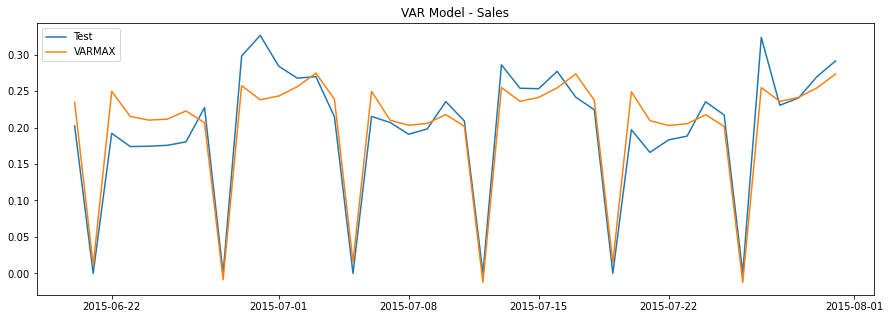

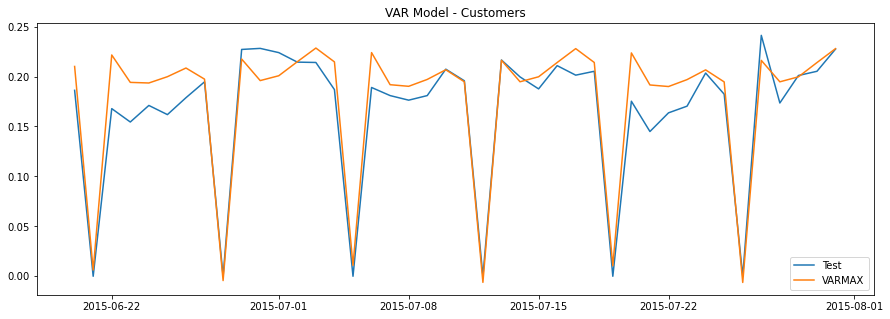

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,31,Sales,5.23000,0.02000
0,SARIMAX,31,Sales,4.86000,0.01000
0,VAR,31,Sales,26.32000,0.08000
0,VAR,31,Customers,24.04000,0.05000
0,VARMAX,31,Sales,11.08000,0.03000
0,VARMAX,31,Customers,9.52000,0.02000


In [156]:
# Instantiate VAR Model class
varmax31 = VAR_Model(data=store31,store_number=31,endog=endog_multi_variate,order=(7,0), exog= exo_mul_features)
temp31 = varmax31.build_model_VARMAX() # model building
temp31
results31 = pd.concat([results31,temp31]) # concat result of varmax to results31 dataframe
results31

### Best model
For Store no. 31 is SARIMAX with MAPE-4.86 , RMSE-0.01

## Store 46

### Pre-Processing of Data

758
Imputed missing values using linear interpolation
942


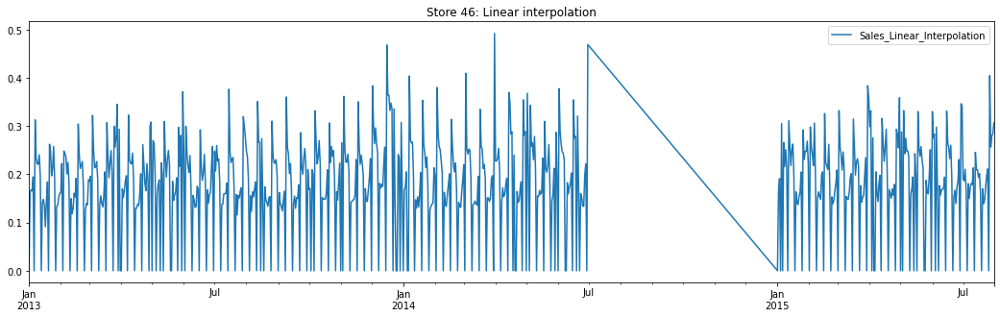

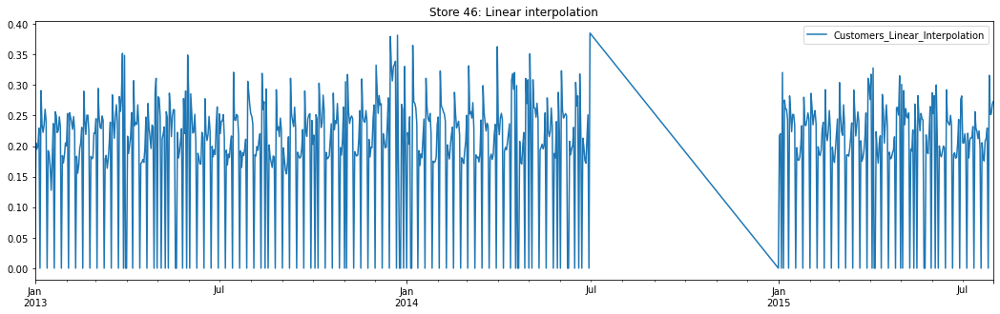

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000
942
Outliers above 99 percentile removed
931
Imputed missing values using linear interpolation
942


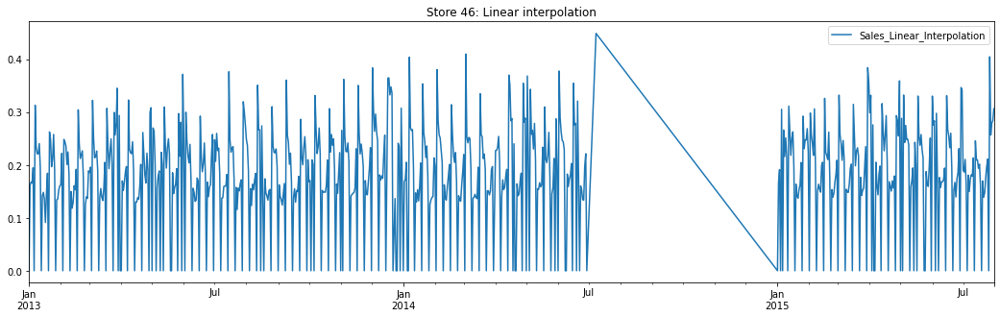

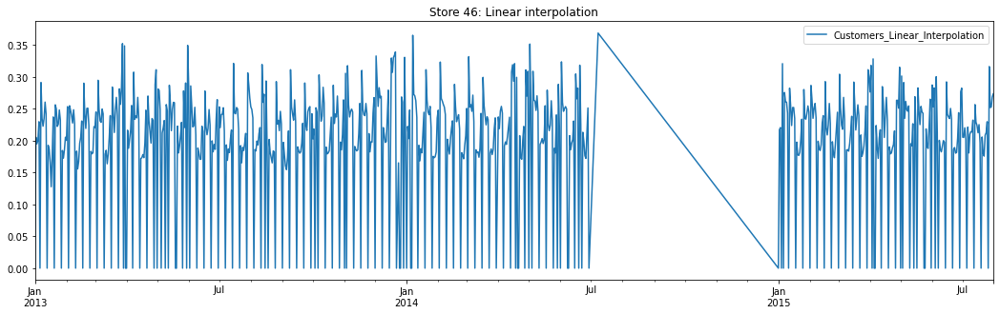

             Sales  Customers   Promo  DayOfWeek    Open
2013-01-06 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-13 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-20 0.00000    0.00000 0.00000    7.00000 0.00000
2013-01-27 0.00000    0.00000 0.00000    7.00000 0.00000
2013-02-03 0.00000    0.00000 0.00000    7.00000 0.00000
942


In [157]:
store46 = data[data['Store'] == 46] # filter data for store num 46
store46.drop(['Store'], axis=1, inplace=True) # Drop store column
print(len(store46))

store46= impute_missing_values(store46, 46) # Impute missing values
print(len(store46))

store46 = remove_outliers(store46) # Remove outliers
print(len(store46))

store46= impute_missing_values(store46, 46) # again impute missing values
print(len(store46))


In [158]:
store46.head() # print first 5 lines of store46

,Sales,Customers,Promo,DayOfWeek,Open
2013-01-01,0.00000,0.00000,0.00000,2.00000,0.00000
2013-01-02,0.16140,0.20529,0.00000,3.00000,1.00000
2013-01-03,0.16787,0.19506,0.00000,4.00000,1.00000
2013-01-04,0.16578,0.20071,0.00000,5.00000,1.00000
2013-01-05,0.19484,0.22963,0.00000,6.00000,1.00000


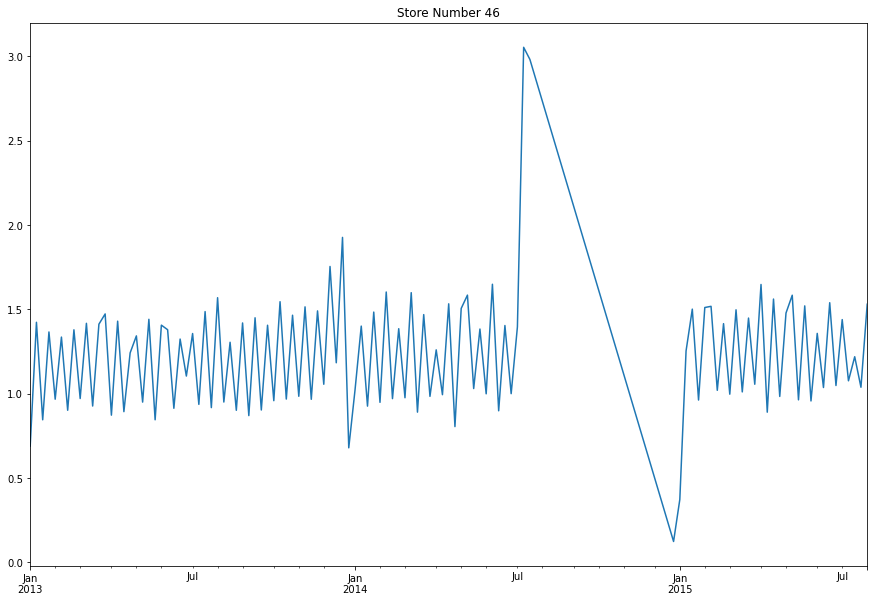

In [159]:
time_series_plot(store46['Sales'], '46') # plot time series

In [160]:
stationarity_test_adf(store46['Sales'], 46) # stationarity test

ADF Statistic: -3.091457
p-value: 0.027192
Critical Values:
	5%: -2.865
Store 46 is Stationary Time Series


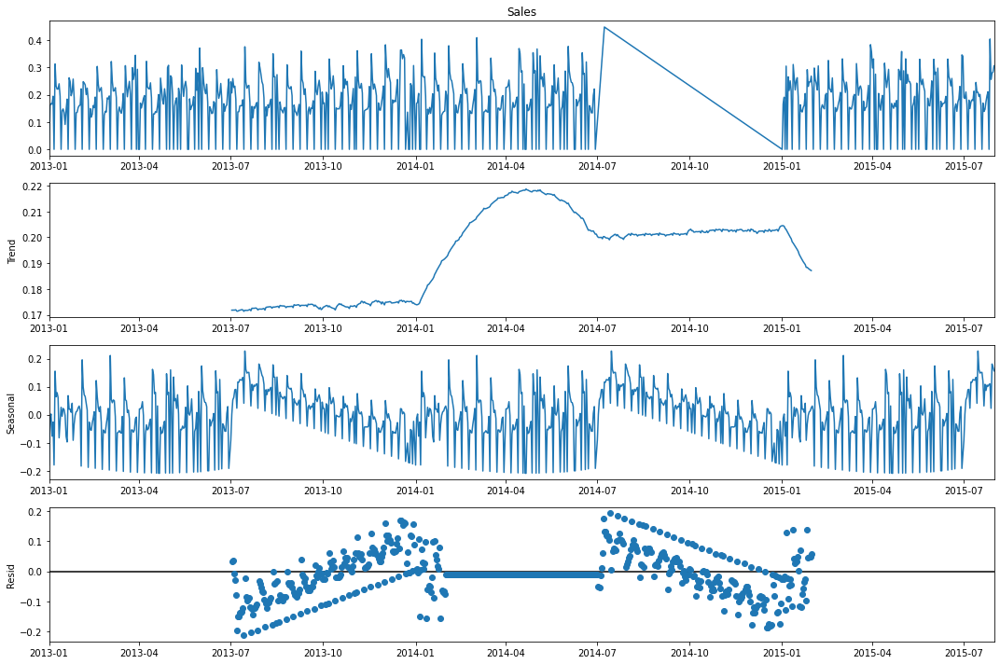

In [161]:
# seasonal decomposition to see trend, seasonal & residual component
seasonal_decomposition_plot(store46['Sales'])

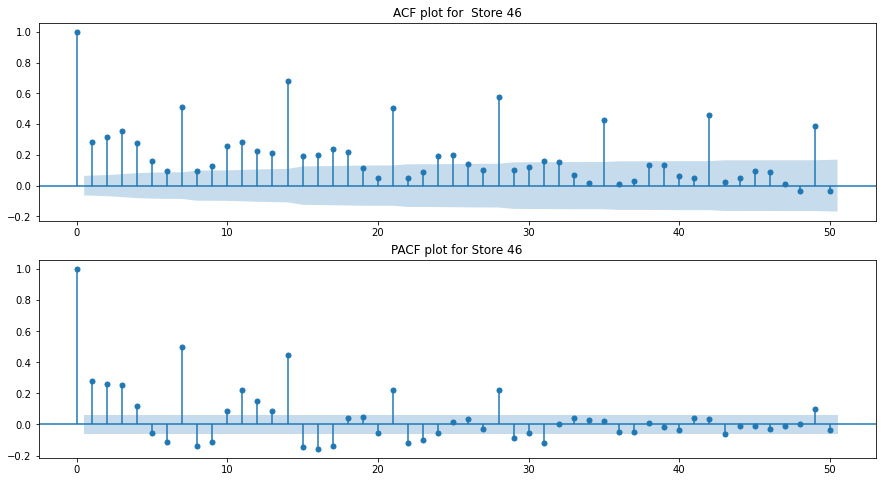

In [162]:
# acf & pacf plot to determine q & p values for model
acf_pacf_plot(store46['Sales'], ' Store '+str(46))

- ADF test shows that time series is stationary.
- Store 46 - sales increase and then drop. Around jul 2014 sales drop and then increase very slowly.
- PACF plot shows significant high value at 7.
- ACF plot shows some trend and doesnt cut off.
- p=7 and q=0 are selected.

### ARIMAX Model

In [163]:
# Empty DataFrame to Store results obtained
results46 = pd.DataFrame(columns= ['Time Series Model','Store','Variable','MAPE','RMSE'])
results46

,Time Series Model,Store,Variable,MAPE,RMSE


             Sales  ArimaxForecastedSales
2015-06-20 0.19339                0.20000
2015-06-21 0.00000               -0.00000
2015-06-22 0.15240                0.15000
2015-06-23 0.16719                0.16000
2015-06-24 0.13942                0.14000


 ------------ Test & Model forecast -----------------------


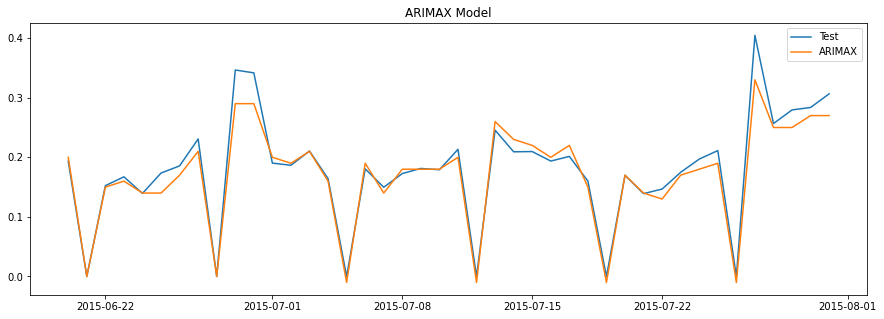

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,46,Sales,6.07000,0.02000


In [164]:
# build ARIMAX model
endog=['Sales'] # endogenuous variable
# instantiate ARMA model class
arimax46 = ARMA_Model(data=store46,store_number=46,endog=endog,exog=exo_uni_features, order=(7,0,0))
temp46 = arimax46.build_model_ARIMAX() 
temp46
results46 = pd.concat([results46, temp46]) # concat results with results46 dataframe
results46

### SARIMAX Model

C:\Users\shail\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


             Sales  SarimaxForecastedSales
2015-06-20 0.19339                 0.21000
2015-06-21 0.00000                -0.00000
2015-06-22 0.15240                 0.16000
2015-06-23 0.16719                 0.16000
2015-06-24 0.13942                 0.14000


 ------------ Test & Model forecast -----------------------


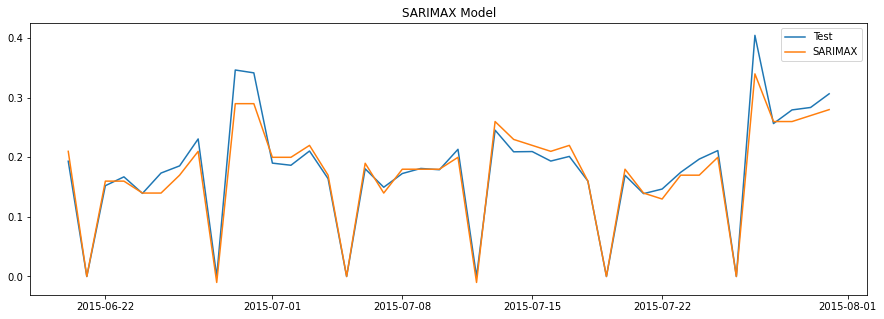

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,46,Sales,6.07000,0.02000
0,SARIMAX,46,Sales,6.13000,0.02000


In [165]:
# Instantiate ARMA Model class
sarimax46 = ARMA_Model(data=store46,store_number=46,endog=endog,order=(7,0,0),seasonal_order=(7,0,0,12),exog=exo_uni_features)
temp46 = sarimax46.build_model_SARIMAX()
results46 = pd.concat([results46, temp46]) # concat result
results46

In [166]:
# Checking for Cointegration between Sales and Customers
johansen_test(store46, ['Sales','Customers'])

   max_eig_stat  trace_stat
0      62.36943    86.16100
1      23.79156    23.79156 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 

The Rank is 2. There is no cointegration but the series is stationary. VAR/VARMAX models can be build.'
'


### VAR Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                             VAR(7)   Log Likelihood                3551.645
Date:                    Wed, 20 Jul 2022   AIC                          -7041.290
Time:                            21:44:53   BIC                          -6892.416
Sample:                        01-01-2013   HQIC                         -6984.419
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.32, 4.68   Jarque-Bera (JB):       764.62, 127.37
Prob(Q):                        0.57, 0.03   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.96, 0.74   Skew:                     -0.43, -0.03
Prob(H) (two-sided):            0.74, 0.01   Kurtosis:                   7.43, 4.84


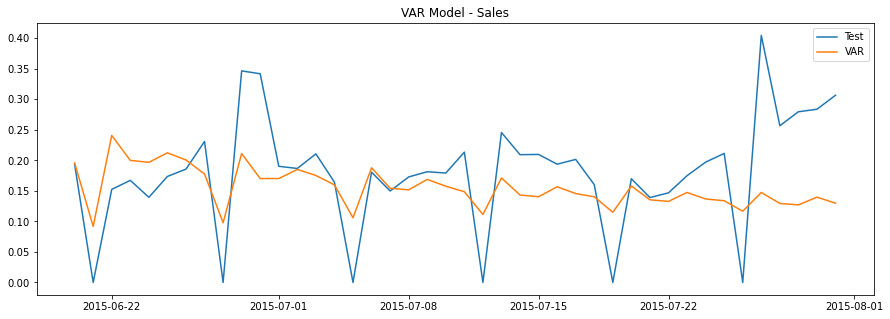

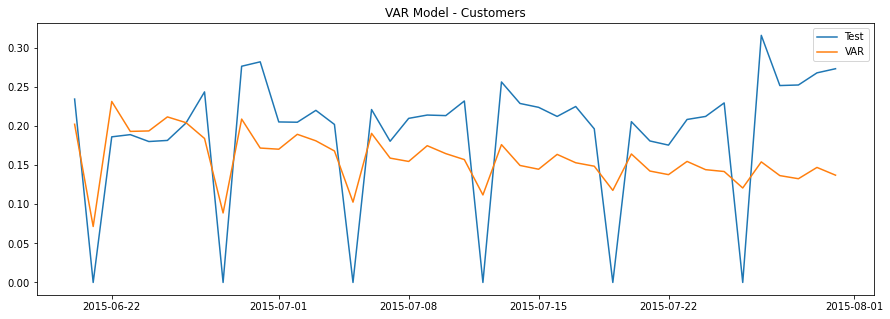

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,46,Sales,6.07000,0.02000
0,SARIMAX,46,Sales,6.13000,0.02000
0,VAR,46,Sales,29.76000,0.09000
0,VAR,46,Customers,29.47000,0.08000


In [167]:
# endogenuous vairable for VAR models
endog_multi_variate = ['Sales','Customers']
# Instantiate VAR model class
var46 = VAR_Model(data=store46,store_number=46,endog=endog_multi_variate,order=(7,0))
temp46 = var46.build_model_VAR() # model building
results46 = pd.concat([results46,temp46]) # concat
results46

### VARMAX Model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                4187.846
Date:                    Wed, 20 Jul 2022   AIC                          -8301.692
Time:                            21:46:11   BIC                          -8124.004
Sample:                        01-01-2013   HQIC                         -8233.814
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            15.06, 3.79   Jarque-Bera (JB):        76.12, 276.14
Prob(Q):                        0.00, 0.05   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.71, 0.94   Skew:                      0.04, -0.12
Prob(H) (two-sided):            0.00, 0.59   Kurtosis:                   4.42, 5.70


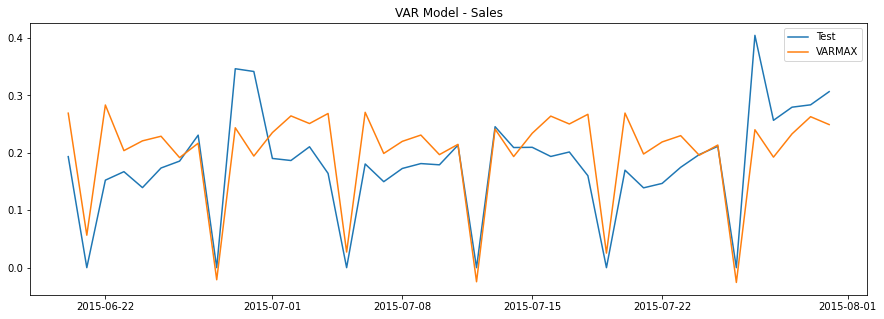

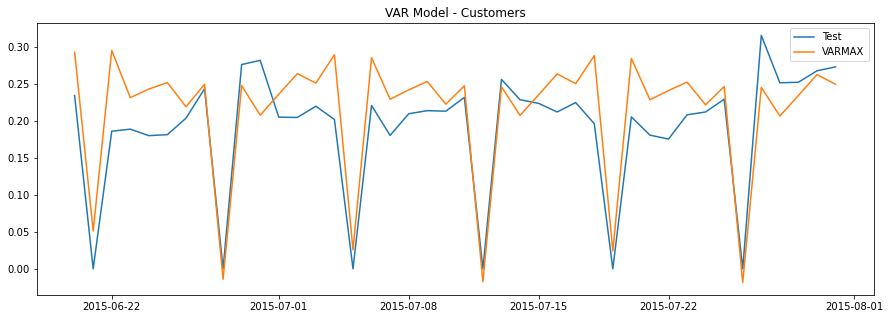

,Time Series Model,Store,Variable,MAPE,RMSE
0,ARIMAX,46,Sales,6.07000,0.02000
0,SARIMAX,46,Sales,6.13000,0.02000
0,VAR,46,Sales,29.76000,0.09000
0,VAR,46,Customers,29.47000,0.08000
0,VARMAX,46,Sales,27.52000,0.07000
0,VARMAX,46,Customers,19.12000,0.05000


In [168]:
# Instantiate VAR Model class
varmax46 = VAR_Model(data=store46,store_number=46,endog=endog_multi_variate,order=(7,0), exog= exo_mul_features)
temp46 = varmax46.build_model_VARMAX() # model building
temp46
results46 = pd.concat([results46,temp46]) # concat result of varmax to result46 dataframe
results46

## Best model
For Store no. 46 is ARIMAX with MAPE-6.07 , RMSE-0.02

# 5 Final Points

## Best models for store are:
- For Store no. 1 is SARIMAX with MAPE-3.83 , RMSE-0.01
- For Store no. 3 is SARIMAX with MAPE-7.37 , RMSE-0.03
- For Store no. 8 is **ARIMAX** with MAPE-6.99 , RMSE-0.02
- For Store no. 9 is SARIMAX with MAPE-4.25 , RMSE-0.02
- For Store no. 13 is SARIMAX with MAPE-6.70 , RMSE-0.03
- For Store no. 25 is SARIMAX with MAPE-5.96 , RMSE-0.04
- For Store no. 29 is **ARIMAX** with MAPE-5.08 , RMSE-0.02
- For Store no. 31 is SARIMAX with MAPE-4.86 , RMSE-0.01
- For Store no. 46 is **ARIMAX** with MAPE-6.07 , RMSE-0.02

-------------------------------------------------------------
- SARIMAX model is doing best forecasting for Store no. 1,3,9,13,25,31.
- ARIMAX model is doing best forecasting for store no. 8,29,46.

- All the series were stationary as checked by ADF test.
- Promo2 didn't show much affect on sales but Promo has contribution in increasing sales.

# End
----------------------------------------------------------------------------------------------------------------------------------------------------------------
